In [1]:
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.ipython_useSVG = True

In [2]:
# 带有序号的分子
def mol_with_atom_index(mol):
    if isinstance(mol, str):
        mol = Chem.MolFromSmiles(mol)
    atoms = mol.GetNumAtoms()
    for idx in range( atoms ):
        mol.GetAtomWithIdx( idx ).SetProp( 'molAtomMapNumber', str( mol.GetAtomWithIdx( idx ).GetIdx() ) )
    return mol

In [3]:
# tool
def has_non_aromatic_neighbor(atom):
    """判断原子周围是否有非芳香原子"""
    flag = False
    neighbors = atom.GetNeighbors()
    for i in neighbors:
        if not i.GetIsAromatic():
            flag = True
            break
    return flag


def find_ring_atoms(mol, atom_idxs):
    """找出给定的原子索引元组中在环上的原子索引，并返回一个元组"""
    return list((i for i in atom_idxs if mol.GetAtomWithIdx(i).IsInRing()))


def is_in_same_ring(mol, atom_idxs: tuple):
    """判断一个元组中的原子索引是否在同一个环上"""
    flag = False
    all_rings = [list(i) for i in Chem.GetSymmSSSR(mol)]
    # set(i).issubset(j)
    for i in all_rings:
        if set(atom_idxs).issubset(i):
            flag = True
            break
    return flag

In [4]:
# 测试用函数
def my_test(mol, fun, **args):
    if isinstance(mol, str):
        mol = Chem.MolFromSmiles(mol)
    return fun(mol, *args)

# my_test('CCCC', second_066_aC_CH_l_CH3_r_2, util=True)    

(2, ((0,), (7,)))


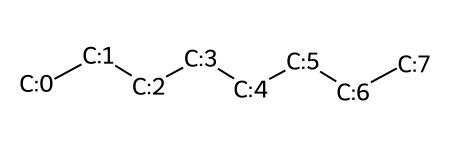

In [5]:
def first_001(mol):
    """CH3"""
    query = Chem.MolFromSmarts('[C;H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_001_smiles1 = 'CCCCCCCC'
print(my_test(first_001_smiles1, first_001))
mol_with_atom_index(first_001_smiles1)

(6, ((1,), (2,), (3,), (4,), (5,), (6,)))


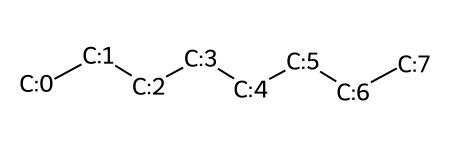

In [6]:
def first_002(mol):
    """CH2"""
    query = Chem.MolFromSmarts('[C;H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_002_smiles1 = 'CCCCCCCC'
print(my_test(first_002_smiles1, first_002))
mol_with_atom_index(first_002_smiles1)

(1, ((3,),))


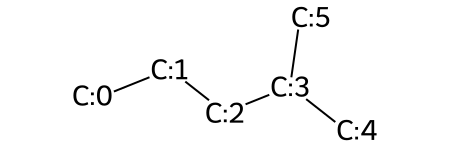

In [7]:
def first_003(mol):
    """CH"""
    query = Chem.MolFromSmarts('[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_003_smiles1 = 'CCCC(C)C'
print(my_test(first_003_smiles1, first_003))
mol_with_atom_index(first_003_smiles1)

(1, ((2,),))


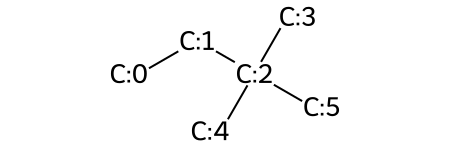

In [8]:
def first_004(mol):
    """C"""
    query = Chem.MolFromSmarts('[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_004_smiles1 = 'CCC(C)(C)C'
print(my_test(first_004_smiles1, first_004))
mol_with_atom_index(first_004_smiles1)

(1, ((0, 1),))


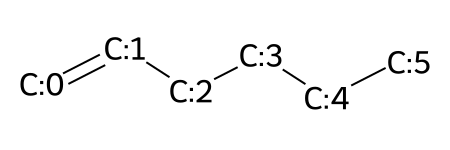

In [9]:
def first_005(mol):
    """CH2=CH"""
    query = Chem.MolFromSmarts('[C;H2;!R]=[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_005_smiles1 = 'C=CCCCC'
print(my_test(first_005_smiles1, first_005))
mol_with_atom_index(first_005_smiles1)

(1, ((1, 2),))


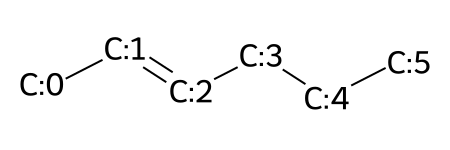

In [10]:
def first_006(mol):
    """CH=CH"""
    query = Chem.MolFromSmarts('[C;H;!R]=[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_006_smiles1 = 'C/C=C/CCC'
print(my_test(first_006_smiles1, first_006))
mol_with_atom_index(first_006_smiles1)

(1, ((0, 1),))


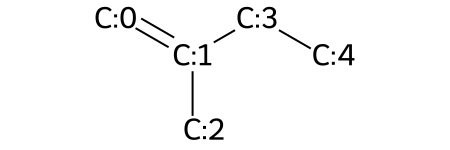

In [11]:
def first_007(mol):
    """CH2=C"""
    query = Chem.MolFromSmarts('[C;H2;!R]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_007_smiles1 = 'C=C(C)CC'
print(my_test(first_007_smiles1, first_007))
mol_with_atom_index(first_007_smiles1)

(1, ((1, 2),))


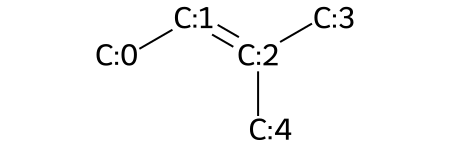

In [12]:
def first_008(mol):
    """CH=C"""
    query = Chem.MolFromSmarts('[C;H1;!R]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_008_smiles1 = 'CC=C(C)C'
print(my_test(first_008_smiles1, first_008))
mol_with_atom_index(first_008_smiles1)

(1, ((1, 3),))


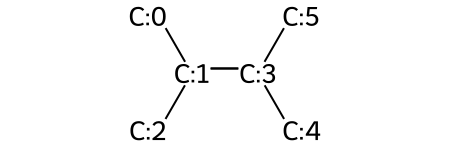

In [13]:
def first_009(mol):
    """C=C"""
    query = Chem.MolFromSmarts('[C;H0;!R]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_009_smiles1 = 'CC(C)=C(C)C'
print(my_test(first_009_smiles1, first_009))
mol_with_atom_index(first_009_smiles1)

(1, ((0, 1, 2),))


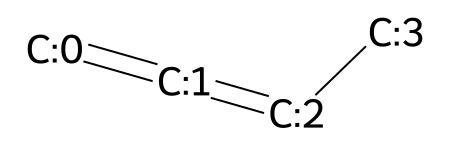

In [14]:
def first_010(mol):
    """CH2=C=CH"""
    query = Chem.MolFromSmarts('[C;H2;!R]=[C;H0;!R;D2]=[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_010_smiles1 = 'C=C=CC'
print(my_test(first_010_smiles1, first_010))
mol_with_atom_index(first_010_smiles1)

(1, ((0, 1, 2),))


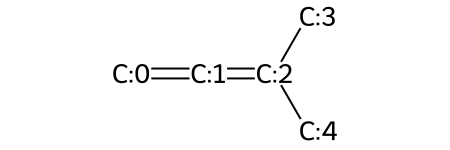

In [15]:
def first_011(mol):
    """CH2=C=C"""
    query = Chem.MolFromSmarts('[C;H2;!R]=[C;H0;!R;D2]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_011_smiles1 = 'C=C=C(C)C'
print(my_test(first_011_smiles1, first_011))
mol_with_atom_index(first_011_smiles1)

(1, ((1, 3, 4),))


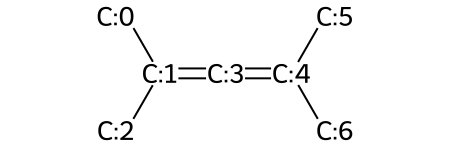

In [16]:
def first_012(mol):
    """C=C=C
    2001年的论文12号基团是CH=C=CH,对应的SMART为[C;H1;!R]=[C;H0;!R]=[C;H1;!R]
    """
    query = Chem.MolFromSmarts('[C;H0;!R]=[C;H0;!R;D2]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_012_smiles1 = 'CC(C)=C=C(C)C'
print(my_test(first_012_smiles1, first_012))
mol_with_atom_index(first_012_smiles1)

(1, ((0, 1),))


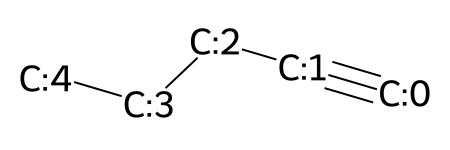

In [17]:
def first_013(mol):
    """CH#C"""
    query = Chem.MolFromSmarts('[C;H1;!R;D1]#[C;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_013_smiles1 = 'C#CCCC'
print(my_test(first_013_smiles1, first_013))
mol_with_atom_index(first_013_smiles1)

(1, ((2, 3),))


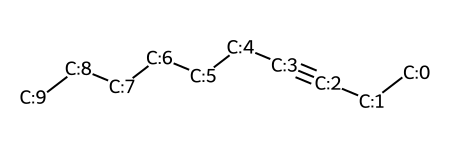

In [18]:
def first_014(mol):
    """C#C"""
    query = Chem.MolFromSmarts('[C;H0;!R;D2]#[C;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_014_smiles1 = 'CCC#CCCCCCC'
print(my_test(first_014_smiles1, first_014))
mol_with_atom_index(first_014_smiles1)

(6, ((0,), (1,), (2,), (3,), (4,), (5,)))


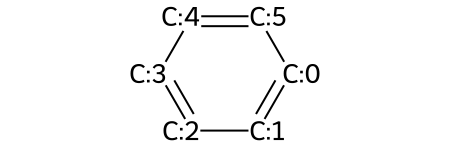

In [19]:
def first_015(mol):
    """aCH"""
    query = Chem.MolFromSmarts('[c;H1;R1;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_015_smiles1 = 'c1ccccc1'
print(my_test(first_015_smiles1, first_015))
mol_with_atom_index(first_015_smiles1)

(2, ((3,), (8,)))


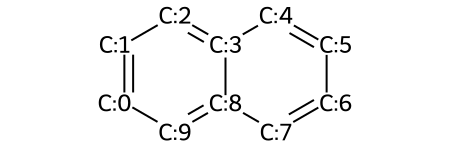

In [20]:
def first_016(mol):  # 麻烦且慢，但是应该可靠
    """aC fused with aromatic ring"""
    query = Chem.MolFromSmarts('[c;H0;R&!R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    real_match_list = []
    for i in match_list:
        atom_i = mol.GetAtomWithIdx(i[0])
        if not has_non_aromatic_neighbor(atom_i):  # 判断该原子是否有链接非芳香原子是为了防止把芳环上连接非芳香环也算进去
            real_match_list.append(i)
    return len(real_match_list), tuple(real_match_list)


# def first_016(mol, return_match_list=False):   # 简洁且快，可靠性有待测试
#     """aC fused with aromatic ring"""
#     query = Chem.MolFromSmarts('[a]:[c;H0;R&!R1](:[a]):[a]')
#     match_list = mol.GetSubstructMatches(query)
#     if return_match_list:
#         return len(match_list), match_list
#     return len(match_list)


first_016_smiles1 = 'c1ccc2ccccc2c1'
print(my_test(first_016_smiles1, first_016))
mol_with_atom_index(first_016_smiles1)

(2, ((3,), (4,)))


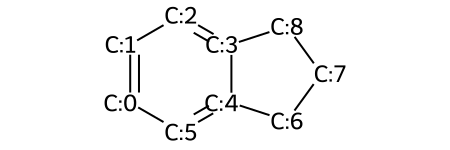

In [21]:
def first_017(mol):   # 麻烦且慢，但是应该可靠
    """aC fused with nonaromatic subring"""
    query = Chem.MolFromSmarts('[c;H0;R&!R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    real_match_list = []
    for i in match_list:
        atom_i = mol.GetAtomWithIdx(i[0])
        if has_non_aromatic_neighbor(atom_i):  # 判断该原子是否有链接非芳香原子是为了取出芳环上连接非芳香环的，和上一个函数刚好相反
            real_match_list.append(i)
    return len(real_match_list), tuple(real_match_list)


# def first_017(mol, return_match_list=False):   # 简介且快，可靠性有待测试
#     """aC fused with nonaromatic subring"""
#     query = Chem.MolFromSmarts('[a]:[c;H0;R&!R1](@;!:[!a;R]):[a]')
#     match_list = mol.GetSubstructMatches(query)
#     if return_match_list:
#         return len(match_list), match_list
#     return len(match_list)



first_017_smiles1 = 'c1ccc2c(c1)CCC2'
print(my_test(first_017_smiles1, first_017))
mol_with_atom_index(first_017_smiles1)

(3, ((2,), (8,), (10,)))


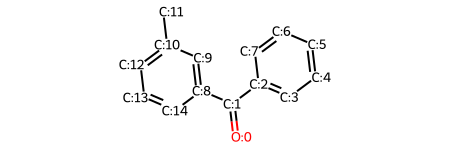

In [22]:
def first_018(mol):
    """aC except as above
    这里这样写是因为我们给出了数基团的顺序，在那里会剔除重复的，所以不用担心重复
    """
    query = Chem.MolFromSmarts('[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_018_smiles1 = 'O=C(c1ccccc1)c1cc(C)ccc1'
print(my_test(first_018_smiles1, first_018))
mol_with_atom_index(first_018_smiles1)

(1, ((3,),))


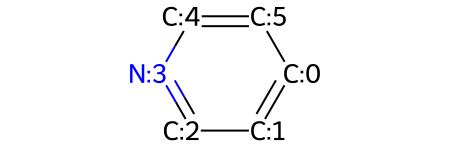

In [23]:
def first_019(mol):
    """aN in aromatic ring"""
    query = Chem.MolFromSmarts('[n;H0;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_019_smiles1 = 'c1ccncc1'
print(my_test(first_019_smiles1, first_019))
mol_with_atom_index(first_019_smiles1)

(1, ((1, 0),))


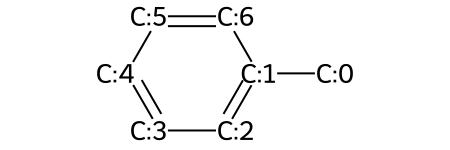

In [24]:
def first_020(mol):
    """aC-CH3"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_020_smiles1 = 'Cc1ccccc1'
print(my_test(first_020_smiles1, first_020))
mol_with_atom_index(first_020_smiles1)

(1, ((2, 1),))


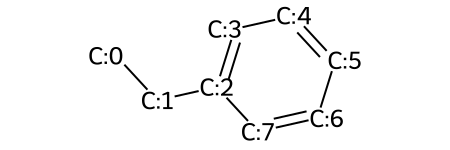

In [25]:
def first_021(mol):
    """aC-CH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_021_smiles1 = 'CCc1ccccc1'
print(my_test(first_021_smiles1, first_021))
mol_with_atom_index(first_021_smiles1)

(1, ((3, 1),))


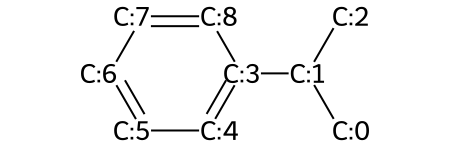

In [26]:
def first_022(mol):
    """aC-CH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_022_smiles1 = 'CC(C)c1ccccc1'
print(my_test(first_022_smiles1, first_022))
mol_with_atom_index(first_022_smiles1)

(1, ((4, 1),))


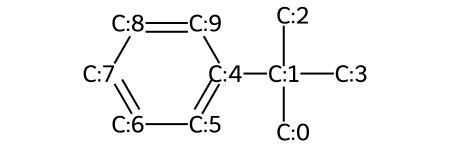

In [27]:
def first_023(mol):
    """aC-C"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_023_smiles1 = 'CC(C)(C)c1ccccc1'
print(my_test(first_023_smiles1, first_023))
mol_with_atom_index(first_023_smiles1)

(1, ((2, 1, 0),))


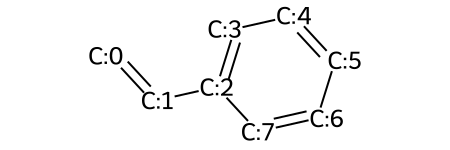

In [28]:
def first_024(mol):
    """aC-CH=CH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R;D2]=[C;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_024_smiles1 = 'C=Cc1ccccc1'
print(my_test(first_024_smiles1, first_024))
mol_with_atom_index(first_024_smiles1)

(1, ((3, 2, 1),))


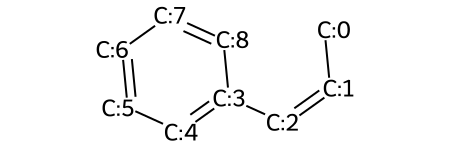

In [29]:
def first_025(mol):
    """aC-CH=CH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R;D2]=[C;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_025_smiles1 = 'C/C=C\c1ccccc1'
print(my_test(first_025_smiles1, first_025))
mol_with_atom_index(first_025_smiles1)

(1, ((3, 1, 0),))


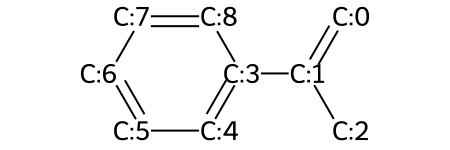

In [30]:
def first_026(mol):
    """aC-C=CH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D3]=[C;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_026_smiles1 = 'C=C(C)c1ccccc1'
print(my_test(first_026_smiles1, first_026))
mol_with_atom_index(first_026_smiles1)

(1, ((2, 1, 0),))


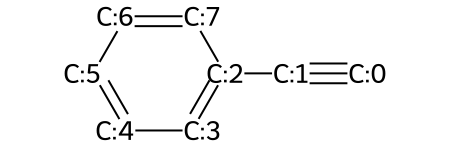

In [31]:
def first_027(mol):
    """aC-C#CH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D2]#[C;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_027_smiles1 = 'C#Cc1ccccc1'
print(my_test(first_027_smiles1, first_027))
mol_with_atom_index(first_027_smiles1)

(1, ((3, 2, 1),))


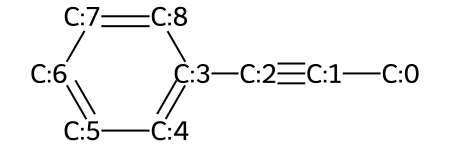

In [32]:
def first_028(mol):
    """aC-C#C"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D2]#[C;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_028_smiles1 = 'CC#Cc1ccccc1'
print(my_test(first_028_smiles1, first_028))
mol_with_atom_index(first_028_smiles1)

(2, ((0,), (5,)))


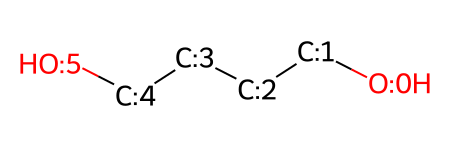

In [33]:
def first_029(mol):
    """OH"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_029_smiles1 = 'OCCCCO'
print(my_test(first_029_smiles1, first_029))
mol_with_atom_index(first_029_smiles1)

(1, ((1, 0),))


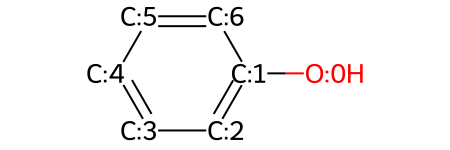

In [34]:
def first_030(mol):
    """aC-OH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_030_smiles1 = 'Oc1ccccc1'
print(my_test(first_030_smiles1, first_030))
mol_with_atom_index(first_030_smiles1)

(2, ((1, 2, 0), (6, 8, 7)))


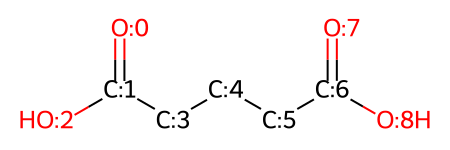

In [35]:
def first_031(mol):
    """COOH"""
    query = Chem.MolFromSmarts('[C;H0;!R;D3]([O;H1;!R;D1])=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_031_smiles1 = 'O=C(O)CCCC(=O)O'
print(my_test(first_031_smiles1, first_031))
mol_with_atom_index(first_031_smiles1)

(1, ((3, 1, 2, 0),))


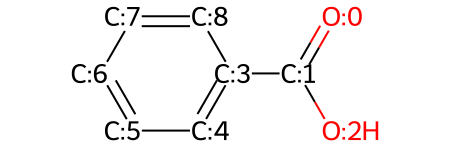

In [36]:
def first_032(mol):
    """aC-COOH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3]([O;H1;!R;D1])=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_032_smiles1 = 'O=C(O)c1ccccc1'
print(my_test(first_032_smiles1, first_032))
mol_with_atom_index(first_032_smiles1)

(1, ((3, 2, 4),))


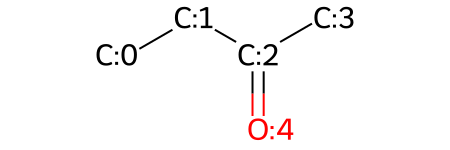

In [37]:
def first_033(mol):
    """CH3CO"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_033_smiles1 = 'CCC(C)=O'
print(my_test(first_033_smiles1, first_033))
mol_with_atom_index(first_033_smiles1)

(2, ((1, 2, 3), (4, 2, 3)))


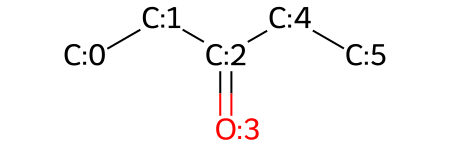

In [38]:
def first_034(mol):
    """CH2CO"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_034_smiles1 = 'CCC(=O)CC'
print(my_test(first_034_smiles1, first_034))
mol_with_atom_index(first_034_smiles1)

(2, ((1, 3, 4), (5, 3, 4)))


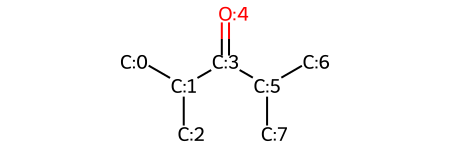

In [39]:
def first_035(mol):
    """CHCO"""
    query = Chem.MolFromSmarts('[C;H1;!R][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_035_smiles1 = 'CC(C)C(=O)C(C)C'
print(my_test(first_035_smiles1, first_035))
mol_with_atom_index(first_035_smiles1)

(2, ((1, 4, 5), (6, 4, 5)))


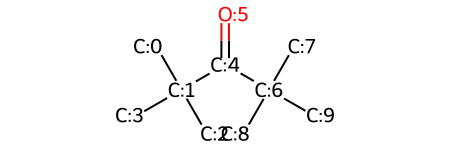

In [40]:
def first_036(mol):
    """CCO"""
    query = Chem.MolFromSmarts('[C;H0;!R][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_036_smiles1 = 'CC(C)(C)C(=O)C(C)(C)C'
print(my_test(first_036_smiles1, first_036))
mol_with_atom_index(first_036_smiles1)

(1, ((3, 1, 2),))


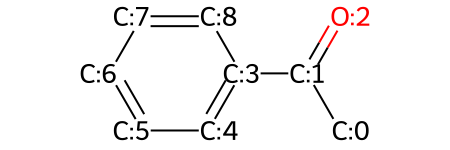

In [41]:
def first_037(mol):
    """aC-CO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_037_smiles1 = 'CC(=O)c1ccccc1'
print(my_test(first_037_smiles1, first_037))
mol_with_atom_index(first_037_smiles1)

(1, ((5, 6),))


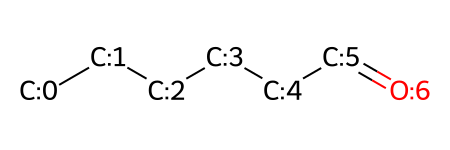

In [42]:
def first_038(mol):
    """CHO"""
    query = Chem.MolFromSmarts('[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_038_smiles1 = 'CCCCCC=O'
print(my_test(first_038_smiles1, first_038))
mol_with_atom_index(first_038_smiles1)

(1, ((2, 1, 0),))


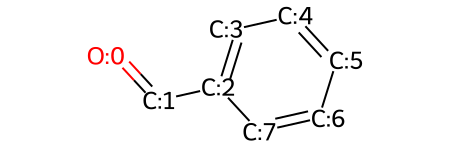

In [43]:
def first_039(mol):
    """aC-CHO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_039_smiles1 = 'O=Cc1ccccc1'
print(my_test(first_039_smiles1, first_039))
mol_with_atom_index(first_039_smiles1)

(1, ((6, 5, 7, 4),))


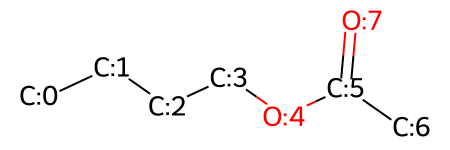

In [44]:
def first_040(mol):
    """CH3COO"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_040_smiles1 = 'CCCCOC(C)=O'
print(my_test(first_040_smiles1, first_040))
mol_with_atom_index(first_040_smiles1)

(1, ((2, 3, 4, 5),))


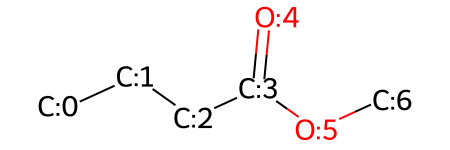

In [45]:
def first_041(mol):
    """CH2COO"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_041_smiles1 = 'CCCC(=O)OC'
print(my_test(first_041_smiles1, first_041))
mol_with_atom_index(first_041_smiles1)

(1, ((5, 3, 4, 2),))


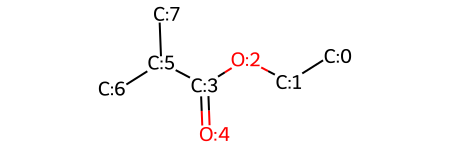

In [429]:
def first_042(mol):
    """CHCOO"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_042_smiles1 = 'CCOC(=O)C(C)C'
print(my_test(first_042_smiles1, first_042))
mol_with_atom_index(first_042_smiles1)

(1, ((5, 3, 4, 2),))


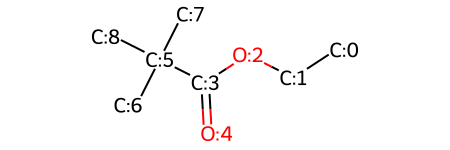

In [430]:
def first_043(mol):
    """CCOO"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_043_smiles1 = 'CCOC(=O)C(C)(C)C'
print(my_test(first_043_smiles1, first_043))
mol_with_atom_index(first_043_smiles1)

(1, ((4, 5, 3),))


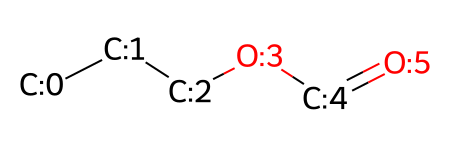

In [48]:
def first_044(mol):
    """HCOO"""
    query = Chem.MolFromSmarts('[C;H1;!R;D2](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list



first_044_smiles1 = 'CCCOC=O'
print(my_test(first_044_smiles1, first_044))
mol_with_atom_index(first_044_smiles1)

(1, ((4, 2, 3, 1),))


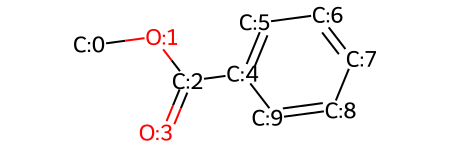

In [49]:
def first_045(mol):
    """aC-COO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list



first_045_smiles1 = 'COC(=O)c1ccccc1'
print(my_test(first_045_smiles1, first_045))
mol_with_atom_index(first_045_smiles1)

(1, ((1, 0, 2, 3),))


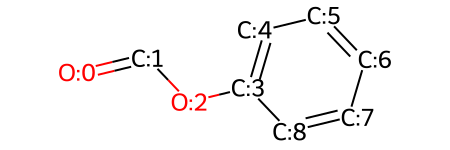

In [50]:
def first_046(mol):
    """aC-OOCH"""
    query = Chem.MolFromSmarts('[C;H1;!R;D2](=[O;H0;!R;D1])[O;H0;!R;D2][c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_046_smiles1 = 'O=COc1ccccc1'
print(my_test(first_046_smiles1, first_046))
mol_with_atom_index(first_046_smiles1)

(1, ((1, 2, 3, 4),))


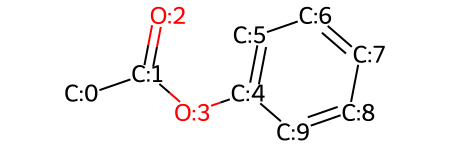

In [51]:
def first_047(mol):
    """aC-OOC"""
    query = Chem.MolFromSmarts('[C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2][c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_047_smiles1 = 'CC(=O)Oc1ccccc1'
print(my_test(first_047_smiles1, first_047))
mol_with_atom_index(first_047_smiles1)

(1, ((2, 3, 4),))


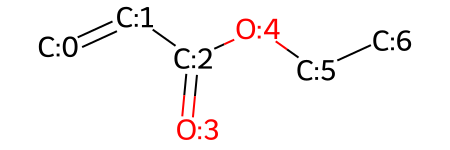

In [52]:
def first_048(mol):
    """COO except as above
    取消了是不是在环上的限制
    """
    query = Chem.MolFromSmarts('[C;H0;D3](=[O;H0;D1])[O;H0;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_048_smiles1 = 'C=CC(=O)OCC'
print(my_test(first_048_smiles1, first_048))
mol_with_atom_index(first_048_smiles1)

(1, ((5, 4),))


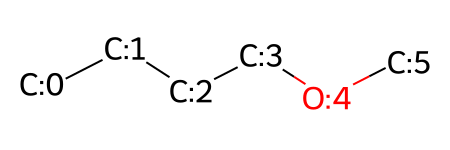

In [53]:
def first_049(mol):
    """CH3O"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_049_smiles1 = 'CCCCOC'
print(my_test(first_049_smiles1, first_049))
mol_with_atom_index(first_049_smiles1)

(2, ((3, 4), (5, 4)))


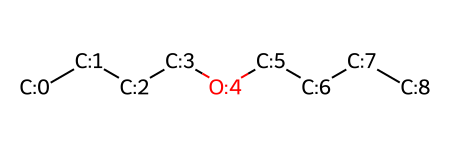

In [54]:
def first_050(mol):
    """CH2O"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_050_smiles1 = 'CCCCOCCCC'
print(my_test(first_050_smiles1, first_050))
mol_with_atom_index(first_050_smiles1)

(2, ((2, 4), (5, 4)))


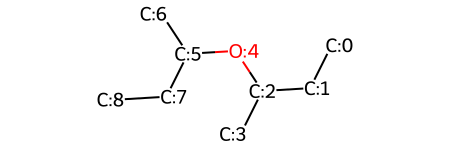

In [55]:
def first_051(mol):
    """CH-O"""
    query = Chem.MolFromSmarts('[C;H1;!R]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_051_smiles1 = 'CCC(C)OC(C)CC'
print(my_test(first_051_smiles1, first_051))
mol_with_atom_index(first_051_smiles1)

(2, ((1, 4), (5, 4)))


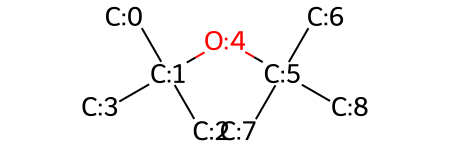

In [56]:
def first_052(mol):
    """C-O"""
    query = Chem.MolFromSmarts('[C;H0;!R]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_052_smiles1 = 'CC(C)(C)OC(C)(C)C'
print(my_test(first_052_smiles1, first_052))
mol_with_atom_index(first_052_smiles1)

(1, ((2, 1),))


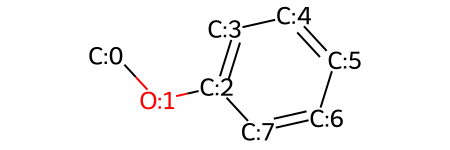

In [57]:
def first_053(mol):
    """aC-O"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_053_smiles1 = 'COc1ccccc1'
print(my_test(first_053_smiles1, first_053))
mol_with_atom_index(first_053_smiles1)

(1, ((1, 2),))


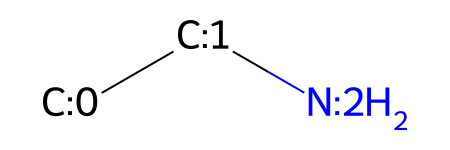

In [58]:
def first_054(mol):
    """CH2NH2"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_054_smiles1 = 'CCN'
print(my_test(first_054_smiles1, first_054))
mol_with_atom_index(first_054_smiles1)

(1, ((2, 4),))


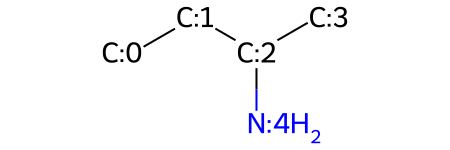

In [433]:
def first_055(mol):
    """CHNH2"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_055_smiles1 = 'CCC(C)N'
print(my_test(first_055_smiles1, first_055))
mol_with_atom_index(first_055_smiles1)

(1, ((1, 4),))


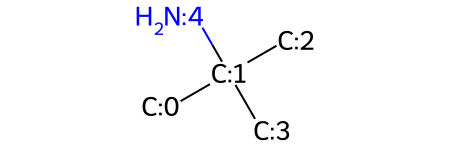

In [60]:
def first_056(mol):
    """CNH2"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_056_smiles1 = 'CC(C)(C)N'
print(my_test(first_056_smiles1, first_056))
mol_with_atom_index(first_056_smiles1)

(2, ((0, 1), (2, 1)))


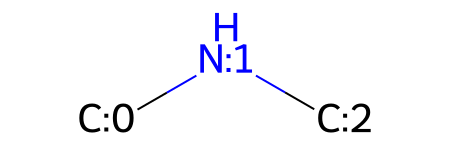

In [61]:
def first_057(mol):
    """CH3NH"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_057_smiles1 = 'CNC'
print(my_test(first_057_smiles1, first_057))
mol_with_atom_index(first_057_smiles1)

(2, ((2, 3), (4, 3)))


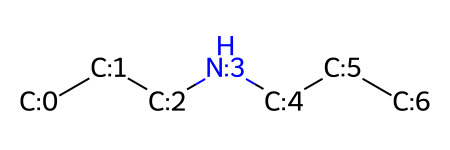

In [62]:
def first_058(mol):
    """CH2NH"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_058_smiles1 = 'CCCNCCC'
print(my_test(first_058_smiles1, first_058))
mol_with_atom_index(first_058_smiles1)

(2, ((1, 3), (4, 3)))


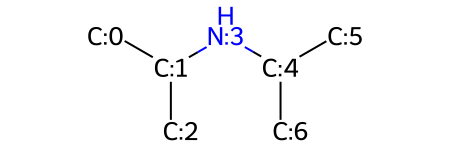

In [434]:
def first_059(mol):
    """CHNH"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3]-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_059_smiles1 = 'CC(C)NC(C)C'
print(my_test(first_059_smiles1, first_059))
mol_with_atom_index(first_059_smiles1)

(1, ((3, 2),))


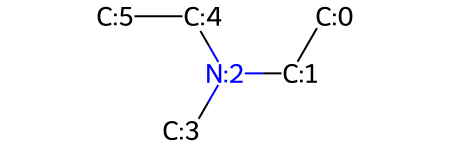

In [64]:
def first_060(mol):
    """CH3N"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[N;H0;!R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_060_smiles1 = 'CCN(C)CC'
print(my_test(first_060_smiles1, first_060))
mol_with_atom_index(first_060_smiles1)

(3, ((1, 2), (3, 2), (5, 2)))


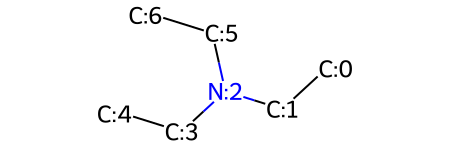

In [65]:
def first_061(mol):
    """CH2N"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[N;H0;!R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_061_smiles1 = 'CCN(CC)CC'
print(my_test(first_061_smiles1, first_061))
mol_with_atom_index(first_061_smiles1)

(1, ((1, 0),))


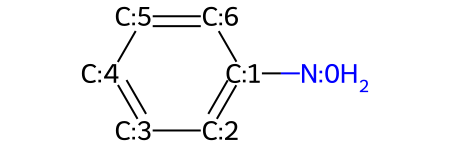

In [66]:
def first_062(mol):
    """aC-NH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_062_smiles1 = 'Nc1ccccc1'
print(my_test(first_062_smiles1, first_062))
mol_with_atom_index(first_062_smiles1)

(1, ((2, 1),))


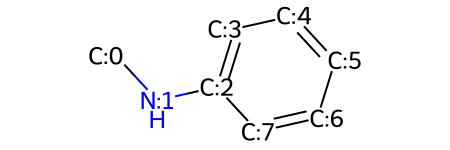

In [67]:
def first_063(mol):
    """aC-NH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_063_smiles1 = 'CNc1ccccc1'
print(my_test(first_063_smiles1, first_063))
mol_with_atom_index(first_063_smiles1)

(1, ((3, 1),))


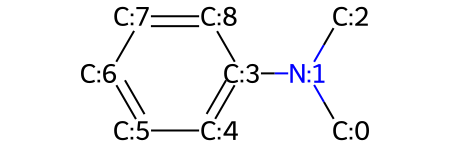

In [68]:
def first_064(mol):
    """aC-N"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H0;!R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_064_smiles1 = 'CN(C)c1ccccc1'
print(my_test(first_064_smiles1, first_064))
mol_with_atom_index(first_064_smiles1)

(1, ((0,),))


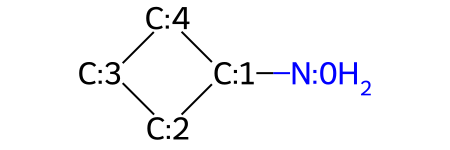

In [69]:
def first_065(mol):
    """NH2 except as above"""
    query = Chem.MolFromSmarts('[N;H2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_065_smiles1 = 'NC1CCC1'
print(my_test(first_065_smiles1, first_065))
mol_with_atom_index(first_065_smiles1)

(2, ((1, 2), (4, 3)))


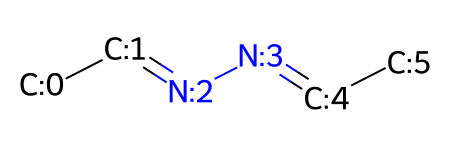

In [70]:
def first_066(mol):
    """CH=N"""
    query = Chem.MolFromSmarts('[C;H1;!R;D2]=[N;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_066_smiles1 = 'C/C=N/N=C/C'
print(my_test(first_066_smiles1, first_066))
mol_with_atom_index(first_066_smiles1)

(2, ((1, 3), (5, 4)))


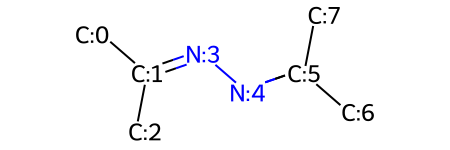

In [71]:
def first_067(mol):
    """C=N"""
    query = Chem.MolFromSmarts('[C;H0;!R]=[N;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_067_smiles1 = 'CC(C)=NN=C(C)C'
print(my_test(first_067_smiles1, first_067))
mol_with_atom_index(first_067_smiles1)

(1, ((1, 2, 3),))


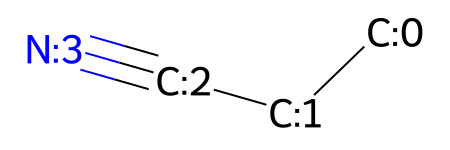

In [72]:
def first_068(mol):
    """CH2CN"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2][C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_068_smiles1 = 'CCC#N'
print(my_test(first_068_smiles1, first_068))
mol_with_atom_index(first_068_smiles1)

(1, ((1, 3, 4),))


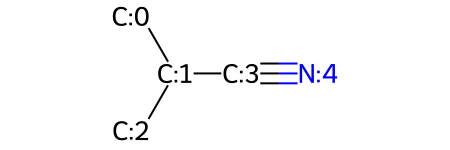

In [431]:
def first_069(mol):
    """CHCN"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3][C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_069_smiles1 = 'CC(C)C#N'
print(my_test(first_069_smiles1, first_069))
mol_with_atom_index(first_069_smiles1)

(1, ((1, 4, 5),))


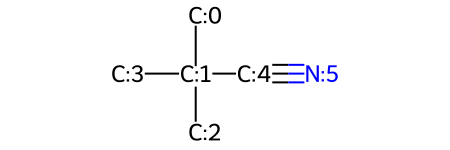

In [432]:
def first_070(mol):
    """CCN"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4][C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_070_smiles1 = 'CC(C)(C)C#N'
print(my_test(first_070_smiles1, first_070))
mol_with_atom_index(first_070_smiles1)

(1, ((2, 1, 0),))


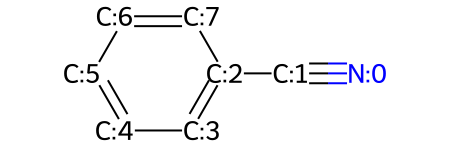

In [75]:
def first_071(mol):
    """aC-CN"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_071_smiles1 = 'N#Cc1ccccc1'
print(my_test(first_071_smiles1, first_071))
mol_with_atom_index(first_071_smiles1)

(1, ((2, 3),))


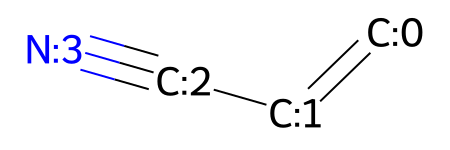

In [76]:
def first_072(mol):
    """CN except as above"""
    query = Chem.MolFromSmarts('[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_072_smiles1 = 'C=CC#N'
print(my_test(first_072_smiles1, first_072))
mol_with_atom_index(first_072_smiles1)

(1, ((1, 2, 3, 4),))


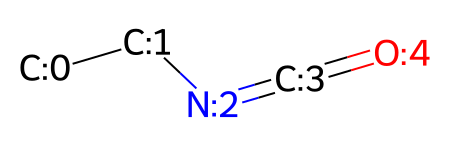

In [77]:
def first_073(mol):
    """CH2NCO"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[N;H0;!R;D2]=[C;H0;!R;D2]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_073_smiles1 = 'CCN=C=O'
print(my_test(first_073_smiles1, first_073))
mol_with_atom_index(first_073_smiles1)

(1, ((1, 3, 4, 5),))


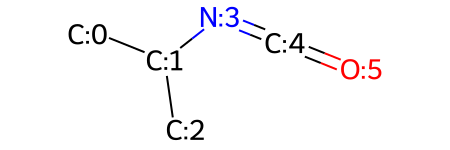

In [78]:
def first_074(mol):
    """CHNCO"""
    query = Chem.MolFromSmarts('[C;H1;!R]-[N;H0;!R;D2]=[C;H0;!R;D2]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_074_smiles1 = 'CC(C)N=C=O'
print(my_test(first_074_smiles1, first_074))
mol_with_atom_index(first_074_smiles1)

(1, ((1, 4, 5, 6),))


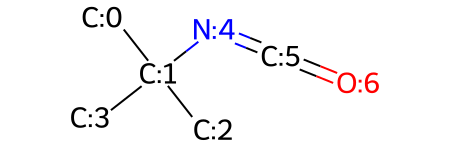

In [79]:
def first_075(mol):
    """CNCO"""
    query = Chem.MolFromSmarts('[C;H0;!R]-[N;H0;!R;D2]=[C;H0;!R;D2]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_075_smiles1 = 'CC(C)(C)N=C=O'
print(my_test(first_075_smiles1, first_075))
mol_with_atom_index(first_075_smiles1)

(1, ((3, 2, 1, 0),))


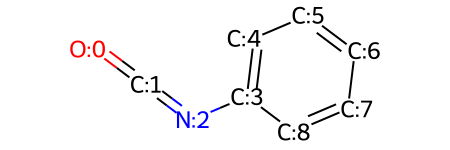

In [80]:
def first_076(mol):
    """aC-NCO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H0;!R;D2]=[C;H0;!R;D2]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_076_smiles1 = 'O=C=Nc1ccccc1'
print(my_test(first_076_smiles1, first_076))
mol_with_atom_index(first_076_smiles1)

(1, ((2, 3, 5, 4),))


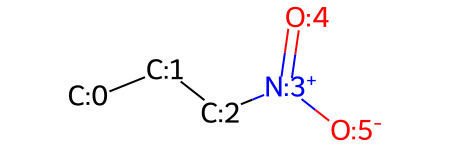

In [81]:
def first_077(mol):
    """CH2NO2"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_077_smiles1 = 'CCC[N+](=O)[O-]'
print(my_test(first_077_smiles1, first_077))
mol_with_atom_index(first_077_smiles1)

(1, ((1, 3, 5, 4),))


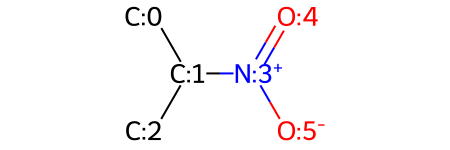

In [435]:
def first_078(mol):
    """CHNO2"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_078_smiles1 = 'CC(C)[N+](=O)[O-]'
print(my_test(first_078_smiles1, first_078))
mol_with_atom_index(first_078_smiles1)

(1, ((1, 4, 6, 5),))


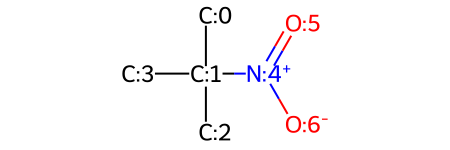

In [436]:
def first_079(mol):
    """CNO2"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_079_smiles1 = 'CC(C)(C)[N+](=O)[O-]'
print(my_test(first_079_smiles1, first_079))
mol_with_atom_index(first_079_smiles1)

(1, ((3, 1, 2, 0),))


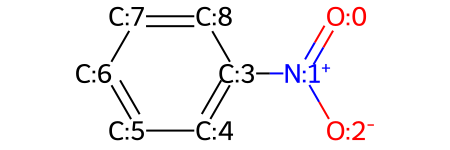

In [84]:
def first_080(mol):
    """aC-NO2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_080_smiles1 = 'O=[N+]([O-])c1ccccc1'
print(my_test(first_080_smiles1, first_080))
mol_with_atom_index(first_080_smiles1)

(1, ((1, 2, 0),))


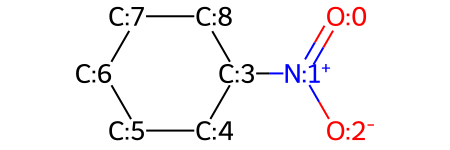

In [85]:
def first_081(mol):
    """NO2 except as above"""
    query = Chem.MolFromSmarts('[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_081_smiles1 = 'O=[N+]([O-])C1CCCCC1'
print(my_test(first_081_smiles1, first_081))
mol_with_atom_index(first_081_smiles1)

(1, ((4, 5, 6),))


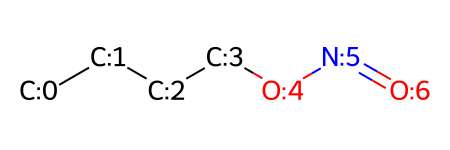

In [437]:
def first_082(mol):
    """ONO"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][N;H0;!R;D2]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_082_smiles1 = 'CCCCON=O'
print(my_test(first_082_smiles1, first_082))
mol_with_atom_index(first_082_smiles1)

(1, ((4, 5, 7, 6),))


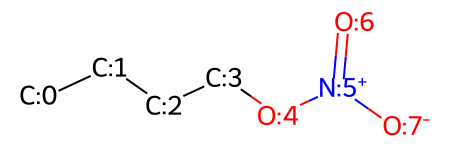

In [87]:
def first_083(mol):
    """ONO2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][N;+]([O;-1])=O')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_083_smiles1 = 'CCCCO[N+](=O)[O-]'
print(my_test(first_083_smiles1, first_083))
mol_with_atom_index(first_083_smiles1)

(1, ((4, 3, 2, 1, 5),))


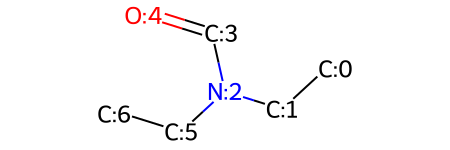

In [88]:
def first_084(mol):
    """HCON(CH2)2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H1;!R;D2][N;H0;!R;D3]([C;H2;!R;D2])[C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_084_smiles1 = 'CCN(C=O)CC'
print(my_test(first_084_smiles1, first_084))
mol_with_atom_index(first_084_smiles1)

(1, ((4, 3, 2, 1),))


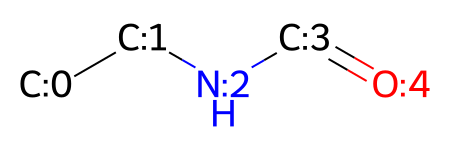

In [89]:
def first_085(mol):
    """HCONH(CH2)"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H1;!R;D2][N;H1;!R;D2][C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_085_smiles1 = 'CCNC=O'
print(my_test(first_085_smiles1, first_085))
mol_with_atom_index(first_085_smiles1)

(1, ((5, 3, 4),))


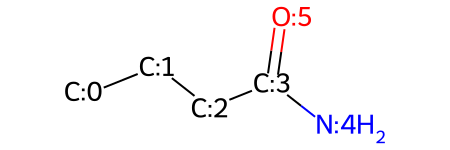

In [90]:
def first_086(mol):
    """CONH2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_086_smiles1 = 'CCCC(N)=O'
print(my_test(first_086_smiles1, first_086))
mol_with_atom_index(first_086_smiles1)

(1, ((4, 2, 1, 0),))


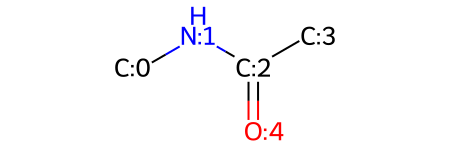

In [91]:
def first_087(mol):
    """CONHCH3"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H1;!R;D2][C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_087_smiles1 = 'CNC(C)=O'
print(my_test(first_087_smiles1, first_087))
mol_with_atom_index(first_087_smiles1)

(1, ((5, 3, 2, 1),))


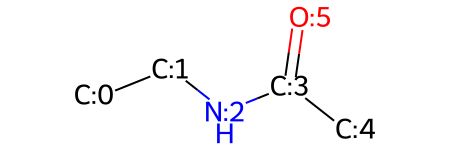

In [92]:
def first_088(mol):
    """CONHCH2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H1;!R;D2][C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_088_smiles1 = 'CCNC(C)=O'
print(my_test(first_088_smiles1, first_088))
mol_with_atom_index(first_088_smiles1)

(1, ((2, 1, 3, 4, 5),))


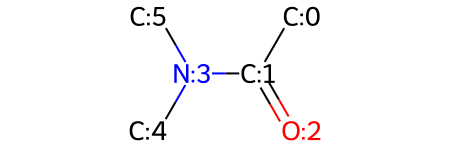

In [93]:
def first_089(mol):
    """CON(CH3)2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H0;!R;D3]([C;H3;!R;D1])[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_089_smiles1 = 'CC(=O)N(C)C'
print(my_test(first_089_smiles1, first_089))
mol_with_atom_index(first_089_smiles1)

(1, ((6, 4, 2, 1, 3),))


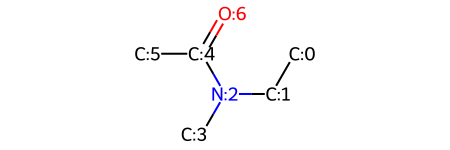

In [94]:
def first_090(mol):
    """CONCH3CH2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H0;!R;D3]([C;H2;!R;D2])[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_090_smiles1 = 'CCN(C)C(C)=O'
print(my_test(first_090_smiles1, first_090))
mol_with_atom_index(first_090_smiles1)

(1, ((7, 5, 2, 1, 3),))


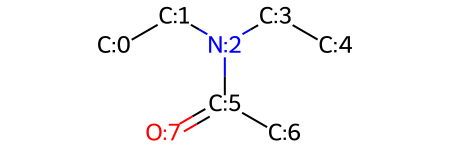

In [95]:
def first_091(mol):
    """CON(CH2)2"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H0;!R;D3]([C;H2;!R;D2])[C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_091_smiles1 = 'CCN(CC)C(C)=O'
print(my_test(first_091_smiles1, first_091))
mol_with_atom_index(first_091_smiles1)

(1, ((2, 1, 3, 4, 6),))


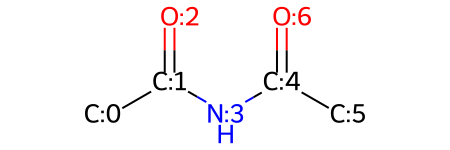

In [96]:
def first_092(mol):
    """CONHCO"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H1;!R;D2][C;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_092_smiles1 = 'CC(=O)NC(C)=O'
print(my_test(first_092_smiles1, first_092))
mol_with_atom_index(first_092_smiles1)

(1, ((2, 1, 3, 5, 7),))


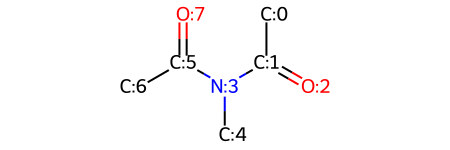

In [97]:
def first_093(mol):
    """CONCO"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3][N;H0;!R;D3][C;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_093_smiles1 = 'CC(=O)N(C)C(C)=O'
print(my_test(first_093_smiles1, first_093))
mol_with_atom_index(first_093_smiles1)

(1, ((3, 1, 2, 0),))


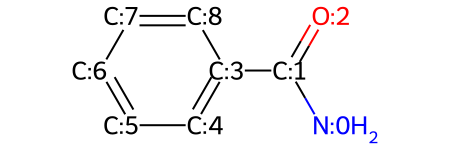

In [98]:
def first_094(mol):
    """aC-CONH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_094_smiles1 = 'NC(=O)c1ccccc1'
print(my_test(first_094_smiles1, first_094))
mol_with_atom_index(first_094_smiles1)

(1, ((3, 2, 1, 0),))


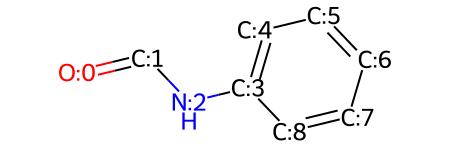

In [99]:
def first_095(mol):
    """aC-NH(CO)H"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_095_smiles1 = 'O=CNc1ccccc1'
print(my_test(first_095_smiles1, first_095))
mol_with_atom_index(first_095_smiles1)

(1, ((4, 1, 2, 3),))


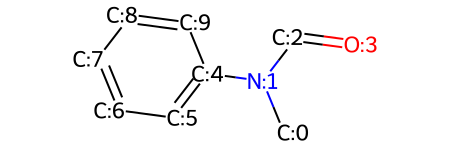

In [100]:
def first_096(mol):
    """aC-N(CO)H"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H0;!R;D3]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_096_smiles1 = 'CN(C=O)c1ccccc1'
print(my_test(first_096_smiles1, first_096))
mol_with_atom_index(first_096_smiles1)

(1, ((4, 2, 3, 1),))


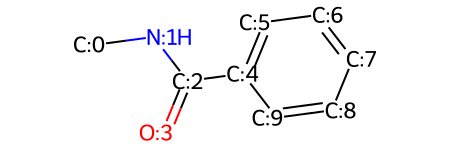

In [101]:
def first_097(mol):
    """aC-CONH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])[N;H1;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_097_smiles1 = 'CNC(=O)c1ccccc1'
print(my_test(first_097_smiles1, first_097))
mol_with_atom_index(first_097_smiles1)

(1, ((4, 3, 1, 2),))


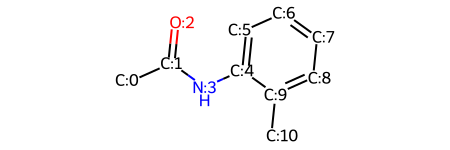

In [102]:
def first_098(mol):
    """aC-NHCO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]-[C;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_098_smiles1 = 'CC(=O)Nc1ccccc1C'
print(my_test(first_098_smiles1, first_098))
mol_with_atom_index(first_098_smiles1)

(1, ((5, 3, 1, 2),))


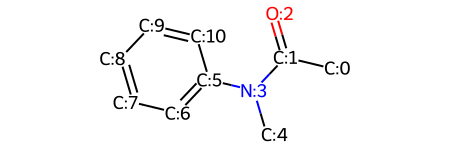

In [103]:
def first_099(mol):
    """aC-NCO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H0;!R;D3]-[C;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_099_smiles1 = 'CC(=O)N(C)c1ccccc1'
print(my_test(first_099_smiles1, first_099))
mol_with_atom_index(first_099_smiles1)

(1, ((1, 2, 3, 4),))


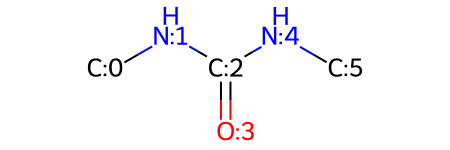

In [104]:
def first_100(mol):
    """NHCONH"""
    query = Chem.MolFromSmarts('[N;H1;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_100_smiles1 = 'CNC(=O)NC'
print(my_test(first_100_smiles1, first_100))
mol_with_atom_index(first_100_smiles1)

(1, ((3, 2, 4, 1),))


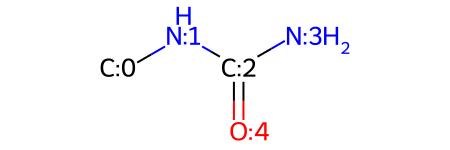

In [105]:
def first_101(mol):
    """NH2CONH"""
    query = Chem.MolFromSmarts('[N;H2;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_101_smiles1 = 'CNC(N)=O'
print(my_test(first_101_smiles1, first_101))
mol_with_atom_index(first_101_smiles1)

(1, ((4, 3, 5, 1),))


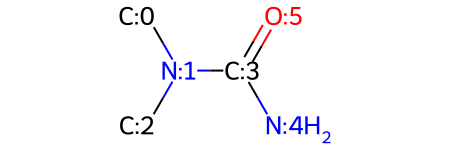

In [106]:
def first_102(mol):
    """NH2CON"""
    query = Chem.MolFromSmarts('[N;H2;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_102_smiles1 = 'CN(C)C(N)=O'
print(my_test(first_102_smiles1, first_102))
mol_with_atom_index(first_102_smiles1)

(1, ((1, 2, 3, 4),))


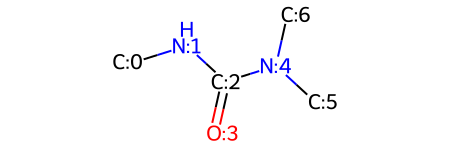

In [107]:
def first_103(mol):
    """NHCON"""
    query = Chem.MolFromSmarts('[N;H1;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_103_smiles1 = 'CNC(=O)N(C)C'
print(my_test(first_103_smiles1, first_103))
mol_with_atom_index(first_103_smiles1)

(1, ((1, 3, 4, 5),))


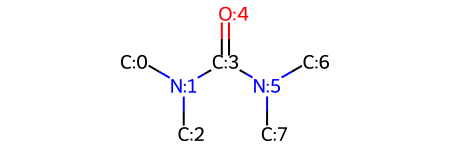

In [108]:
def first_104(mol):
    """NCON"""
    query = Chem.MolFromSmarts('[N;H0;!R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_104_smiles1 = 'CN(C)C(=O)N(C)C'
print(my_test(first_104_smiles1, first_104))
mol_with_atom_index(first_104_smiles1)

(1, ((4, 3, 1, 2, 0),))


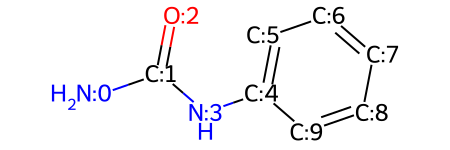

In [109]:
def first_105(mol):
    """aC-NHCONH2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_105_smiles1 = 'NC(=O)Nc1ccccc1'
print(my_test(first_105_smiles1, first_105))
mol_with_atom_index(first_105_smiles1)

(2, ((3, 2, 1, 0, 9), (10, 9, 1, 0, 2)))


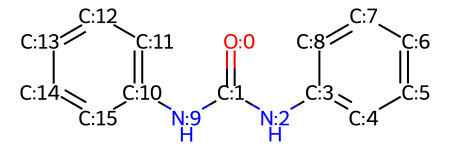

In [110]:
def first_106(mol):
    """aC-NHCONH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H1;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_106_smiles1 = 'O=C(Nc1ccccc1)Nc1ccccc1'
print(my_test(first_106_smiles1, first_106))
mol_with_atom_index(first_106_smiles1)

(1, ((3, 1, 2),))


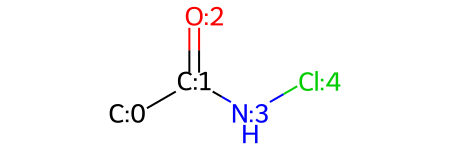

In [111]:
def first_107(mol):
    """NHCO except as above"""
    query = Chem.MolFromSmarts('[N;H1;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_107_smiles1 = 'CC(=O)NCl'
print(my_test(first_107_smiles1, first_107))
mol_with_atom_index(first_107_smiles1)

(1, ((3, 4),))


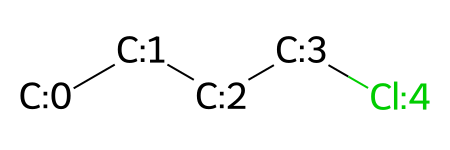

In [112]:
def first_108(mol):
    """CH2Cl"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_108_smiles1 = 'CCCCCl'
print(my_test(first_108_smiles1, first_108))
mol_with_atom_index(first_108_smiles1)

(1, ((1, 3),))


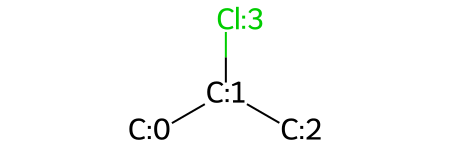

In [113]:
def first_109(mol):
    """CHCl"""
    query = Chem.MolFromSmarts('[C;H1;!R][Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list 


first_109_smiles1 = 'CC(C)Cl'
print(my_test(first_109_smiles1, first_109))
mol_with_atom_index(first_109_smiles1)

(1, ((1, 4),))


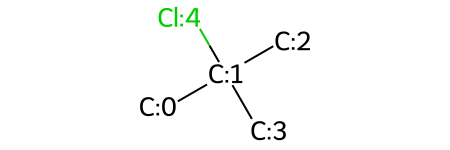

In [114]:
def first_110(mol):
    """CCl"""
    query = Chem.MolFromSmarts('[C;H0;!R][Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_110_smiles1 = 'CC(C)(C)Cl'
print(my_test(first_110_smiles1, first_110))
mol_with_atom_index(first_110_smiles1)

(1, ((1, 2, 3),))


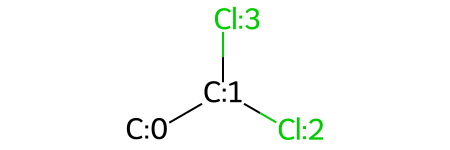

In [115]:
def first_111(mol):
    """CHCl2"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3](-[Cl])-[Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_111_smiles1 = 'CC(Cl)Cl'
print(my_test(first_111_smiles1, first_111))
mol_with_atom_index(first_111_smiles1)

(1, ((1, 3, 4),))


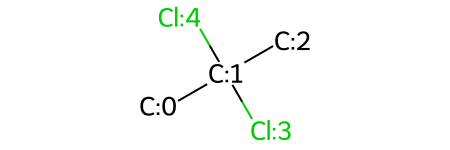

In [116]:
def first_112(mol):
    """CCl2"""
    query = Chem.MolFromSmarts('[C;H0;!R](-[Cl])-[Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_112_smiles1 = 'CC(C)(Cl)Cl'
print(my_test(first_112_smiles1, first_112))
mol_with_atom_index(first_112_smiles1)

(1, ((1, 2, 3, 4),))


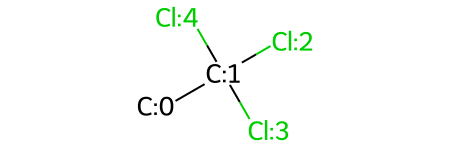

In [117]:
def first_113(mol):
    """CCl3"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4](-[Cl])(-[Cl])-[Cl]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_113_smiles1 = 'CC(Cl)(Cl)Cl'
print(my_test(first_113_smiles1, first_113))
mol_with_atom_index(first_113_smiles1)

(1, ((3, 4),))


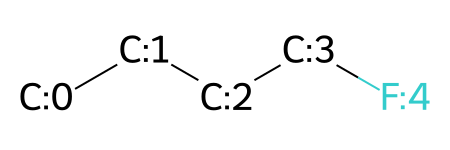

In [118]:
def first_114(mol):
    """CH2F"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_114_smiles1 = 'CCCCF'
print(my_test(first_114_smiles1, first_114))
mol_with_atom_index(first_114_smiles1)

(1, ((2, 4),))


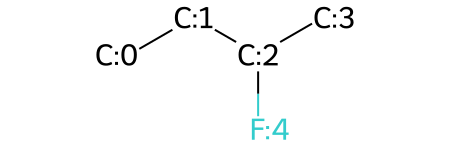

In [119]:
def first_115(mol):
    """CHF"""
    query = Chem.MolFromSmarts('[C;H1;!R][F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_115_smiles1 = 'CCC(C)F'
print(my_test(first_115_smiles1, first_115))
mol_with_atom_index(first_115_smiles1)

(1, ((1, 4),))


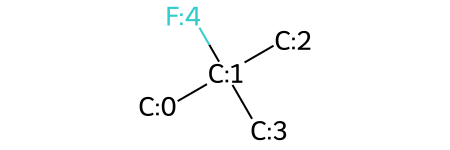

In [120]:
def first_116(mol):
    """CF"""
    query = Chem.MolFromSmarts('[C;H0;!R][F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_116_smiles1 = 'CC(C)(C)F'
print(my_test(first_116_smiles1, first_116))
mol_with_atom_index(first_116_smiles1)

(1, ((1, 2, 3),))


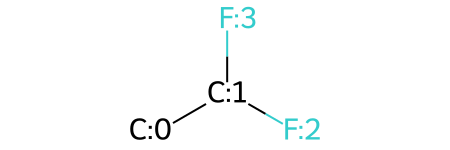

In [121]:
def first_117(mol):
    """CHF2"""
    query = Chem.MolFromSmarts('[C;H1;!R;D3](-[F])-[F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_117_smiles1 = 'CC(F)F'
print(my_test(first_117_smiles1, first_117))
mol_with_atom_index(first_117_smiles1)

(10, ((1, 0, 2), (1, 0, 3), (1, 2, 3), (4, 5, 6), (7, 8, 9), (10, 11, 12), (13, 14, 15), (16, 17, 18), (16, 17, 19), (16, 18, 19)))


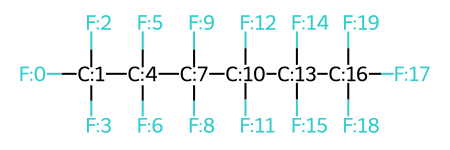

In [122]:
def first_118(mol):
    """CF2"""
    query = Chem.MolFromSmarts('[C;H0;!R](-[F])-[F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_118_smiles1 = 'FC(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)C(F)(F)F'
print(my_test(first_118_smiles1, first_118))
mol_with_atom_index(first_118_smiles1)

(2, ((1, 0, 2, 3), (4, 5, 6, 7)))


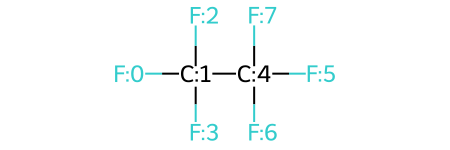

In [123]:
def first_119(mol):
    """CF3"""
    query = Chem.MolFromSmarts('[C;H0;!R;D4](-[F])(-[F])-[F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_119_smiles1 = 'FC(F)(F)C(F)(F)F'
print(my_test(first_119_smiles1, first_119))
mol_with_atom_index(first_119_smiles1)

(2, ((0, 1, 2, 3), (5, 4, 6, 7)))


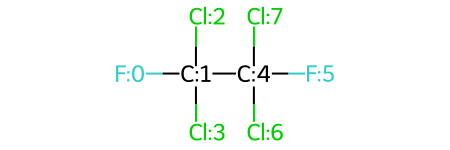

In [124]:
def first_120(mol):
    """CCl2F"""
    query = Chem.MolFromSmarts('F[C;H0;!R;D4](Cl)Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_120_smiles1 = 'FC(Cl)(Cl)C(F)(Cl)Cl'
print(my_test(first_120_smiles1, first_120))
mol_with_atom_index(first_120_smiles1)

(1, ((0, 1, 2),))


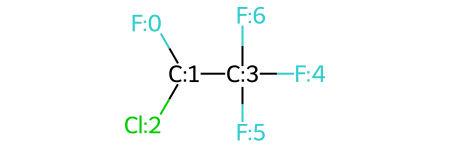

In [125]:
def first_121(mol):
    """HCClF"""
    query = Chem.MolFromSmarts('F[C;H1;!R;D3]Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_121_smiles1 = 'FC(Cl)C(F)(F)F'
print(my_test(first_121_smiles1, first_121))
mol_with_atom_index(first_121_smiles1)

(2, ((3, 1, 0, 2), (7, 4, 5, 6)))


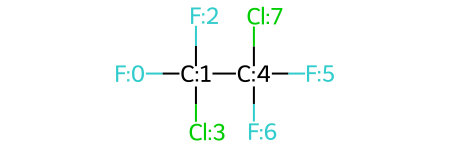

In [126]:
def first_122(mol):
    """CClF2"""
    query = Chem.MolFromSmarts('Cl[C;H0;!R;D4](F)F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_122_smiles1 = 'FC(F)(Cl)C(F)(F)Cl'
print(my_test(first_122_smiles1, first_122))
mol_with_atom_index(first_122_smiles1)

(1, ((1, 0),))


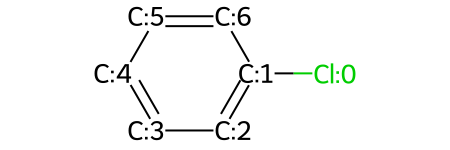

In [127]:
def first_123(mol):
    """aC-Cl"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_123_smiles1 = 'Clc1ccccc1'
print(my_test(first_123_smiles1, first_123))
mol_with_atom_index(first_123_smiles1)

(6, ((1, 0), (2, 3), (4, 5), (6, 7), (8, 9), (10, 11)))


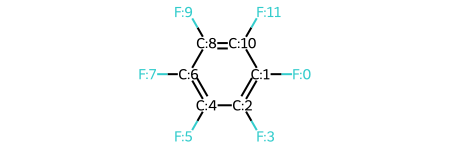

In [128]:
def first_124(mol):
    """aC-F"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_124_smiles1 = 'Fc1c(F)c(F)c(F)c(F)c1F'
print(my_test(first_124_smiles1, first_124))
mol_with_atom_index(first_124_smiles1)

(1, ((1, 0),))


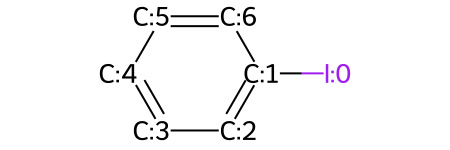

In [129]:
def first_125(mol):
    """aC-I"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-I')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_125_smiles1 = 'Ic1ccccc1'
print(my_test(first_125_smiles1, first_125))
mol_with_atom_index(first_125_smiles1)

(1, ((1, 0),))


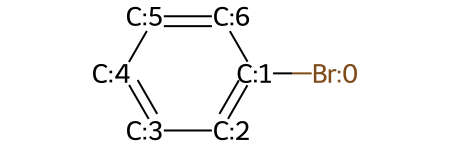

In [130]:
def first_126(mol):
    """aC-Br"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-Br')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_126_smiles1 = 'Brc1ccccc1'
print(my_test(first_126_smiles1, first_126))
mol_with_atom_index(first_126_smiles1)

(1, ((2,),))


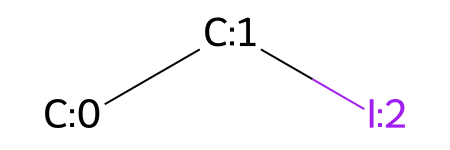

In [131]:
def first_127(mol):
    """I except as above"""
    query = Chem.MolFromSmarts('I')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_127_smiles1 = 'CCI'
print(my_test(first_127_smiles1, first_127))
mol_with_atom_index(first_127_smiles1)

(1, ((2,),))


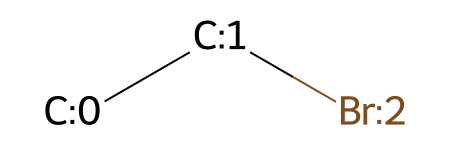

In [132]:
def first_128(mol):
    """Br except as above"""
    query = Chem.MolFromSmarts('Br')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_128_smiles1 = 'CCBr'
print(my_test(first_128_smiles1, first_128))
mol_with_atom_index(first_128_smiles1)

(1, ((0,),))


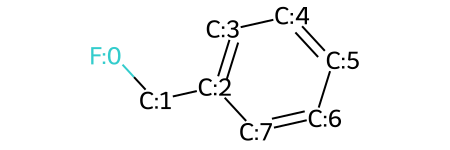

In [133]:
def first_129(mol):
    """F except as above"""
    query = Chem.MolFromSmarts('F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_129_smiles1 = 'FCc1ccccc1'
print(my_test(first_129_smiles1, first_129))
mol_with_atom_index(first_129_smiles1)

(1, ((6,),))


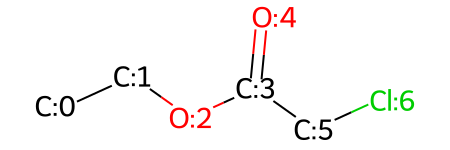

In [134]:
def first_130(mol):
    """Cl except as above"""
    query = Chem.MolFromSmarts('Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_130_smiles1 = 'CCOC(=O)CCl'
print(my_test(first_130_smiles1, first_130))
mol_with_atom_index(first_130_smiles1)

(1, ((2, 3, 4),))


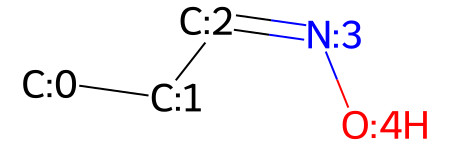

In [135]:
def first_131(mol):
    """CHNOH"""
    query = Chem.MolFromSmarts('[C;H1;!R;D2]=[N;H0;!R;D2]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_131_smiles1 = 'CC/C=N\O'
print(my_test(first_131_smiles1, first_131))
mol_with_atom_index(first_131_smiles1)

(1, ((1, 3, 4),))


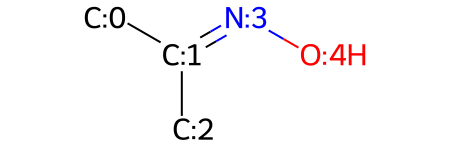

In [136]:
def first_132(mol):
    """CNOH"""
    query = Chem.MolFromSmarts('[C;H0;!R]=[N;H0;!R;D2]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_132_smiles1 = 'CC(C)=NO'
print(my_test(first_132_smiles1, first_132))
mol_with_atom_index(first_132_smiles1)

(1, ((3, 2, 1, 0),))


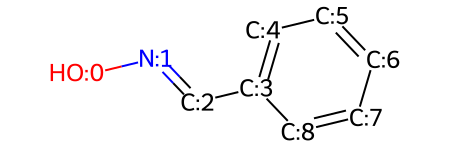

In [137]:
def first_133(mol):
    """aC-CHNOH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R;D2]=[N;H0;!R;D2]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_133_smiles1 = 'O/N=C/c1ccccc1'
print(my_test(first_133_smiles1, first_133))
mol_with_atom_index(first_133_smiles1)

(1, ((2, 3, 4, 5),))


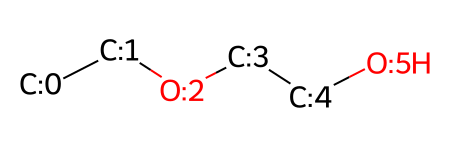

In [138]:
def first_134(mol):
    """OCH2CH2OH"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][C;H2;!R;D2][C;H2;!R;D2][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_134_smiles1 = 'CCOCCO'
print(my_test(first_134_smiles1, first_134))
mol_with_atom_index(first_134_smiles1)

(1, ((2, 3, 5, 6),))


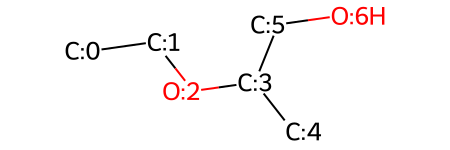

In [139]:
def first_135(mol):
    """OCHCH2OH"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][C;H1;!R;D3][C;H2;!R;D2][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_135_smiles1 = 'CCOC(C)CO'
print(my_test(first_135_smiles1, first_135))
mol_with_atom_index(first_135_smiles1)

(1, ((1, 2, 3, 5),))


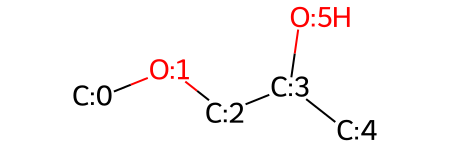

In [140]:
def first_136(mol):
    """OCH2CHOH"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][C;H2;!R;D2][C;H1;!R;D3][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_136_smiles1 = 'COCC(C)O'
print(my_test(first_136_smiles1, first_136))
mol_with_atom_index(first_136_smiles1)

(1, ((4, 5),))


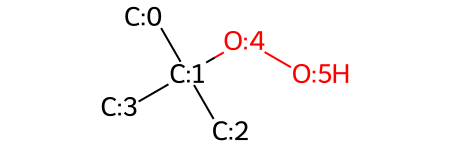

In [141]:
def first_137(mol):
    """O-OH"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_137_smiles1 = 'CC(C)(C)OO'
print(my_test(first_137_smiles1, first_137))
mol_with_atom_index(first_137_smiles1)

(1, ((1, 2),))


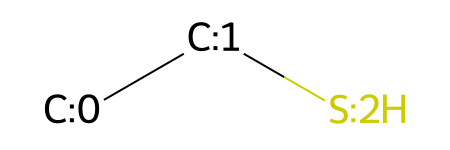

In [142]:
def first_138(mol):
    """CH2SH"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_138_smiles1 = 'CCS'
print(my_test(first_138_smiles1, first_138))
mol_with_atom_index(first_138_smiles1)

(1, ((1, 3),))


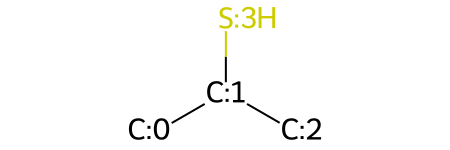

In [143]:
def first_139(mol):
    """CHSH
    这里要求C是D3，是因为后面又142(-SH(except as above))
    """
    query = Chem.MolFromSmarts('[C;H1;!R;D3]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_139_smiles1 = 'CC(C)S'
print(my_test(first_139_smiles1, first_139))
mol_with_atom_index(first_139_smiles1)

(1, ((1, 4),))


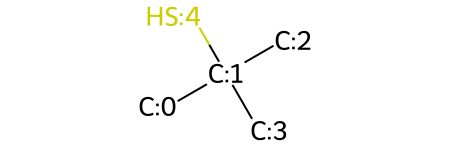

In [144]:
def first_140(mol):
    """CSH
    这里要求C是D4，是因为后面又142(-SH(except as above))
    """
    query = Chem.MolFromSmarts('[C;H0;!R;D4]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_140_smiles1 = 'CC(C)(C)S'
print(my_test(first_140_smiles1, first_140))
mol_with_atom_index(first_140_smiles1)

(1, ((1, 0),))


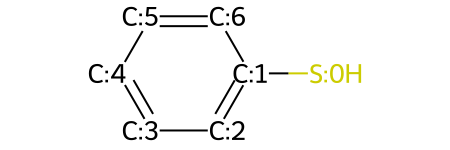

In [145]:
def first_141(mol):
    """aC-SH"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_141_smiles1 = 'Sc1ccccc1'
print(my_test(first_141_smiles1, first_141))
mol_with_atom_index(first_141_smiles1)

(1, ((0,),))


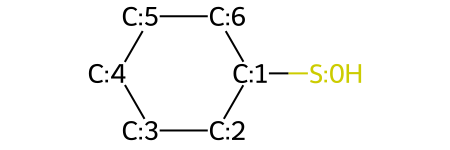

In [146]:
def first_142(mol):
    """SH except as above"""
    query = Chem.MolFromSmarts('[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_142_smiles1 = 'SC1CCCCC1'
print(my_test(first_142_smiles1, first_142))
mol_with_atom_index(first_142_smiles1)

(2, ((0, 1), (2, 1)))


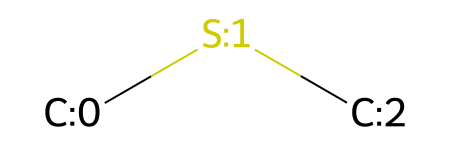

In [147]:
def first_143(mol):
    """CH3S"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_143_smiles1 = 'CSC'
print(my_test(first_143_smiles1, first_143))
mol_with_atom_index(first_143_smiles1)

(2, ((1, 2), (3, 2)))


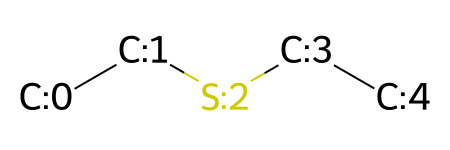

In [148]:
def first_144(mol):
    """CH2S"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_144_smiles1 = 'CCSCC'
print(my_test(first_144_smiles1, first_144))
mol_with_atom_index(first_144_smiles1)

(2, ((1, 3), (4, 3)))


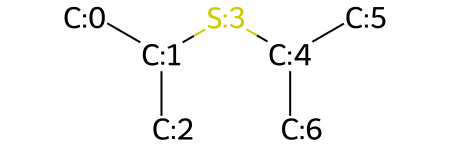

In [149]:
def first_145(mol):
    """CHS"""
    query = Chem.MolFromSmarts('[C;H1;!R]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_145_smiles1 = 'CC(C)SC(C)C'
print(my_test(first_145_smiles1, first_145))
mol_with_atom_index(first_145_smiles1)

(2, ((1, 4), (5, 4)))


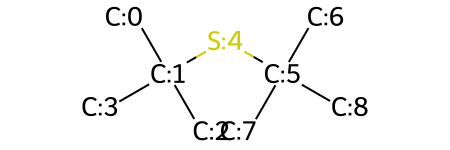

In [150]:
def first_146(mol):
    """CS"""
    query = Chem.MolFromSmarts('[C;H0;!R]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_146_smiles1 = 'CC(C)(C)SC(C)(C)C'
print(my_test(first_146_smiles1, first_146))
mol_with_atom_index(first_146_smiles1)

(1, ((2, 1),))


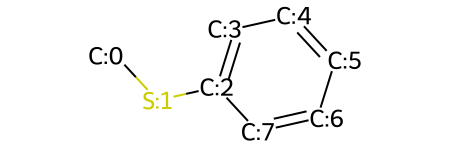

In [151]:
def first_147(mol):
    """aC-S-"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_147_smiles1 = 'CSc1ccccc1'
print(my_test(first_147_smiles1, first_147))
mol_with_atom_index(first_147_smiles1)

(1, ((1, 3),))


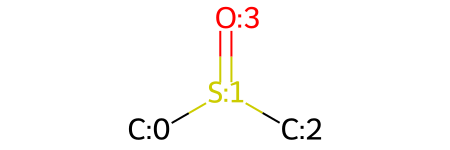

In [152]:
def first_148(mol):
    """SO"""
    query = Chem.MolFromSmarts('[S;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_148_smiles1 = 'CS(C)=O'
print(my_test(first_148_smiles1, first_148))
mol_with_atom_index(first_148_smiles1)

(1, ((1, 3, 4),))


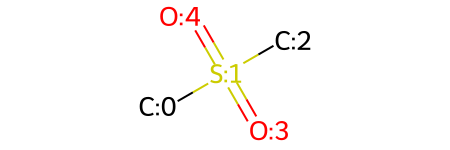

In [153]:
def first_149(mol):
    """SO2"""
    query = Chem.MolFromSmarts('[S;H0;!R;D4](=[O;H0;!R;D1])(=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_149_smiles1 = 'CS(C)(=O)=O'
print(my_test(first_149_smiles1, first_149))
mol_with_atom_index(first_149_smiles1)

(1, ((1, 2, 3, 4),))


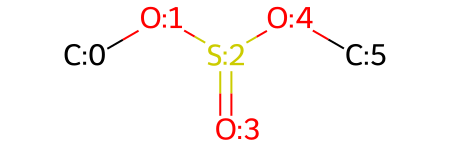

In [154]:
def first_150(mol):
    """SO3(sulfite)"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][S;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_150_smiles1 = 'COS(=O)OC'
print(my_test(first_150_smiles1, first_150))
mol_with_atom_index(first_150_smiles1)

(1, ((1, 2, 4, 5),))


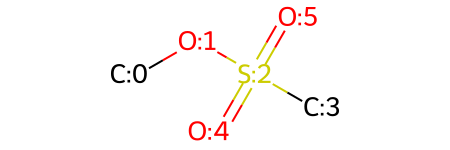

In [155]:
def first_151(mol):
    """SO3(sulfonate)"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][S;H0;!R;D4](=[O;H0;!R;D1])(=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_151_smiles1 = 'COS(C)(=O)=O'
print(my_test(first_151_smiles1, first_151))
mol_with_atom_index(first_151_smiles1)

(1, ((1, 2, 3, 4, 5),))


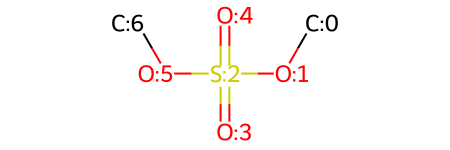

In [156]:
def first_152(mol):
    """SO4(sulfite)"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][S;H0;!R;D4](=[O;H0;!R;D1])(=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_152_smiles1 = 'COS(=O)(=O)OC'
print(my_test(first_152_smiles1, first_152))
mol_with_atom_index(first_152_smiles1)

(1, ((3, 1, 2),))


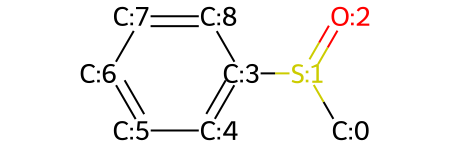

In [157]:
def first_153(mol):
    """aC-SO"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][S;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_153_smiles1 = 'CS(=O)c1ccccc1'
print(my_test(first_153_smiles1, first_153))
mol_with_atom_index(first_153_smiles1)

(2, ((3, 1, 0, 2), (9, 1, 0, 2)))


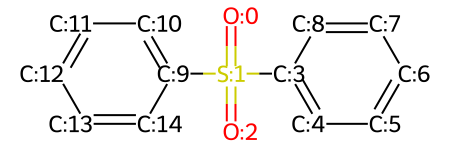

In [158]:
def first_154(mol):
    """aC-SO2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][S;H0;!R;D4](=[O;H0;!R;D1])(=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_154_smiles1 = 'O=S(=O)(c1ccccc1)c1ccccc1'
print(my_test(first_154_smiles1, first_154))
mol_with_atom_index(first_154_smiles1)

(1, ((1,),))


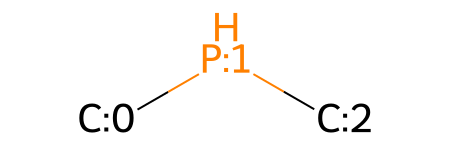

In [159]:
def first_155(mol):
    """PH(phosphine)"""
    query = Chem.MolFromSmarts('[P;H1;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_155_smiles1 = 'CPC'
print(my_test(first_155_smiles1, first_155))
mol_with_atom_index(first_155_smiles1)

(1, ((1,),))


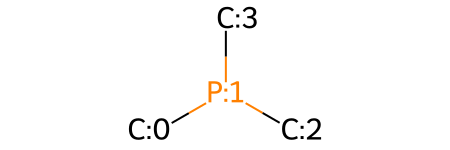

In [160]:
def first_156(mol):
    """P(phosphine)"""
    query = Chem.MolFromSmarts('[P;H0;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_156_smiles1 = 'CP(C)C'
print(my_test(first_156_smiles1, first_156))
mol_with_atom_index(first_156_smiles1)

(1, ((2, 3, 4, 7),))


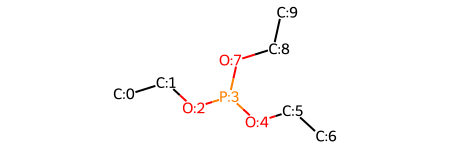

In [161]:
def first_157(mol):
    """PO3(phosphine)"""
    query = Chem.MolFromSmarts('[O;D2;H0][P;H0;D3]([O;D2;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_157_smiles1 = 'CCOP(OCC)OCC'
print(my_test(first_157_smiles1, first_157))
mol_with_atom_index(first_157_smiles1)

(1, ((1, 2, 3, 4),))


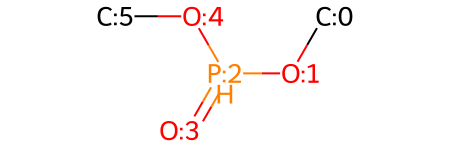

In [162]:
def first_158(mol):
    """PHO3(phosphonate)"""
    query = Chem.MolFromSmarts('[O;D2;H0][P;H1;D3](=[O;D1;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_158_smiles1 = 'CO[PH](=O)OC'
print(my_test(first_158_smiles1, first_158))
mol_with_atom_index(first_158_smiles1)

(1, ((1, 2, 4, 5),))


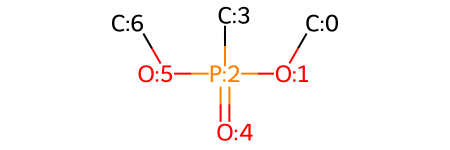

In [163]:
def first_159(mol):
    """PO3(phosphonate)"""
    query = Chem.MolFromSmarts('[O;D2;H0][P;H0;D4](=[O;D1;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_159_smiles1 = 'COP(C)(=O)OC'
print(my_test(first_159_smiles1, first_159))
mol_with_atom_index(first_159_smiles1)

(1, ((2, 3, 5, 4, 6),))


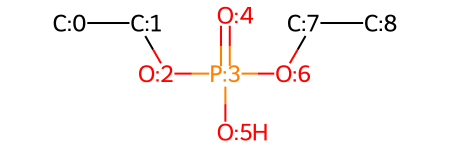

In [164]:
def first_160(mol):
    """PHO4(phosphate)"""
    query = Chem.MolFromSmarts('[O;D2;H0][P;H0;D4]([O;H1;D1])(=[O;D1;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_160_smiles1 = 'CCOP(=O)(O)OCC'
print(my_test(first_160_smiles1, first_160))
mol_with_atom_index(first_160_smiles1)

(1, ((1, 2, 4, 3, 6),))


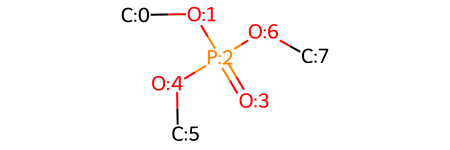

In [165]:
def first_161(mol):
    """PO4(phosphate)"""
    query = Chem.MolFromSmarts('[O;D2;H0][P;H0;D4]([O;H0;D2])(=[O;D1;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_161_smiles1 = 'COP(=O)(OC)OC'
print(my_test(first_161_smiles1, first_161))
mol_with_atom_index(first_161_smiles1)

(3, ((3, 2, 1, 9, 0, 16), (10, 9, 1, 2, 0, 16), (17, 16, 1, 2, 0, 9)))


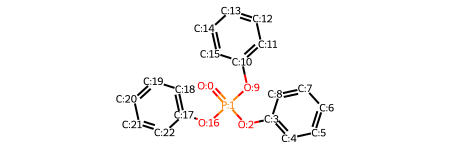

In [166]:
def first_162(mol):
    """aC-PO4"""
    query = Chem.MolFromSmarts('[c;H0;R][O;D2;H0][P;H0;D4]([O;H0;D2])(=[O;D1;H0])[O;D2;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_162_smiles1 = 'O=P(Oc1ccccc1)(Oc1ccccc1)Oc1ccccc1'
print(my_test(first_162_smiles1, first_162))
mol_with_atom_index(first_162_smiles1)

(3, ((3, 4), (5, 4), (11, 4)))


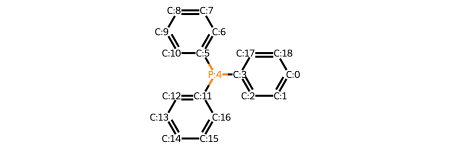

In [167]:
def first_163(mol):
    """aC-P"""
    query = Chem.MolFromSmarts('[c;H0;R][P;H0;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_163_smiles1 = 'c1ccc(P(c2ccccc2)c2ccccc2)cc1'
print(my_test(first_163_smiles1, first_163))
mol_with_atom_index(first_163_smiles1)

(1, ((2, 3, 4, 5),))


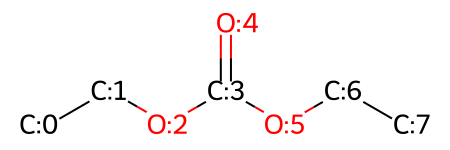

In [168]:
def first_164(mol):
    """CO3(carbonate)"""
    query = Chem.MolFromSmarts('[O;H0;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_164_smiles1 = 'CCOC(=O)OCC'
print(my_test(first_164_smiles1, first_164))
mol_with_atom_index(first_164_smiles1)

(1, ((3, 4, 2),))


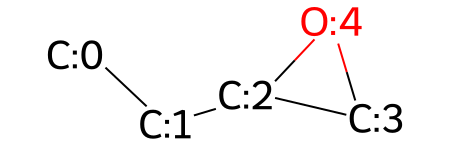

In [169]:
def first_165(mol):
    """C2H3O"""
    query = Chem.MolFromSmarts('[C;H2;R;D2]1[O;H0;R;D2][C;H1;R;D3]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_165_smiles1 = 'CCC1CO1'
print(my_test(first_165_smiles1, first_165))
mol_with_atom_index(first_165_smiles1)

(1, ((3, 4, 1),))


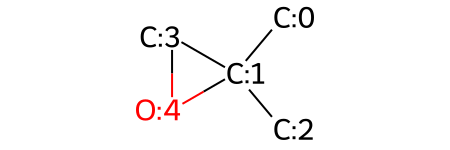

In [170]:
def first_166(mol):
    """C2H2O"""
    query = Chem.MolFromSmarts('[C;H2;R;D2]1[O;H0;R;D2][C;H0;R]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_166_smiles1 = 'CC1(C)CO1'
print(my_test(first_166_smiles1, first_166))
mol_with_atom_index(first_166_smiles1)

(1, ((1, 2, 3),))


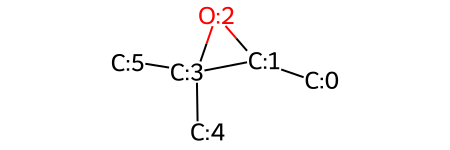

In [171]:
def first_167(mol):
    """C2HO"""
    query = Chem.MolFromSmarts('[C;H1;R]1[O;H0;R][C;H0;R]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_167_smiles1 = 'CC1OC1(C)C'
print(my_test(first_167_smiles1, first_167))
mol_with_atom_index(first_167_smiles1)

(5, ((0,), (1,), (2,), (3,), (4,)))


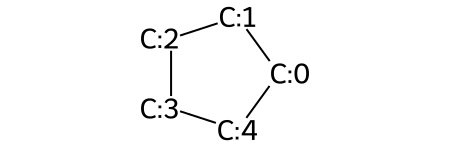

In [172]:
def first_168(mol):
    """CH2(cyclic)"""
    query = Chem.MolFromSmarts('[C;H2;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

first_168_smiles1 = 'C1CCCC1'
print(my_test(first_168_smiles1, first_168))
mol_with_atom_index(first_168_smiles1)

(1, ((1,),))


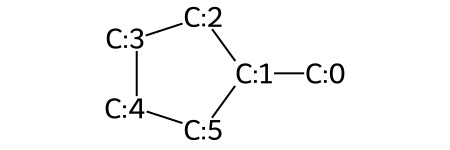

In [173]:
def first_169(mol):
    """CH(cyclic)"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

first_169_smiles1 = 'CC1CCCC1'
print(my_test(first_169_smiles1, first_169))
mol_with_atom_index(first_169_smiles1)

(1, ((1,),))


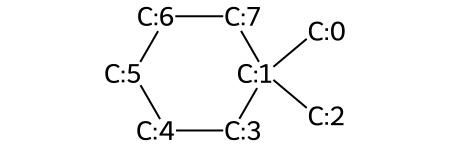

In [174]:
def first_170(mol):
    """C(cyclic)"""
    query = Chem.MolFromSmarts('[C;H0;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

first_170_smiles1 = 'CC1(C)CCCCC1'
print(my_test(first_170_smiles1, first_170))
mol_with_atom_index(first_170_smiles1)

(1, ((0, 1),))


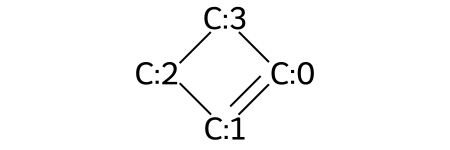

In [175]:
def first_171(mol):
    """CH=CH(cyclic)"""
    query = Chem.MolFromSmarts('[C;H1;D2]=[C;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_171_smiles1 = 'C1=CCC1'
print(my_test(first_171_smiles1, first_171))
mol_with_atom_index(first_171_smiles1)

(1, ((2, 1),))


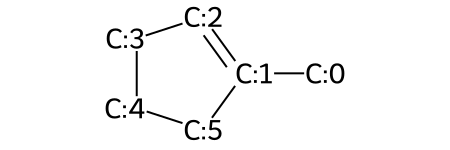

In [176]:
def first_172(mol):
    """CH=C(cyclic)"""
    query = Chem.MolFromSmarts('[C;H1;D2]=[C;H0;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_172_smiles1 = 'CC1=CCCC1'
print(my_test(first_172_smiles1, first_172))
mol_with_atom_index(first_172_smiles1)

(1, ((1, 2),))


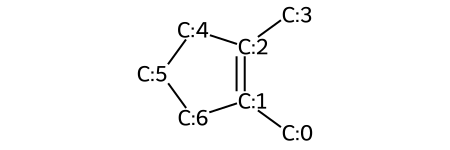

In [177]:
def first_173(mol):
    """C=C(cyclic)"""
    query = Chem.MolFromSmarts('[C;H0]=[C;H0;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_173_smiles1 = 'CC1=C(C)CCC1'
print(my_test(first_173_smiles1, first_173))
mol_with_atom_index(first_173_smiles1)

(1, ((0, 1),))


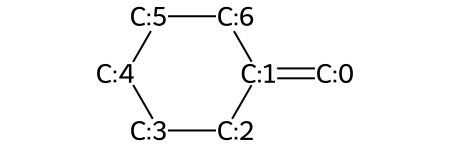

In [178]:
def first_174(mol):
    """CH2=C(cyclic)"""
    query = Chem.MolFromSmarts('[C;H2;D1]=[C;H0;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_174_smiles1 = 'C=C1CCCCC1'
print(my_test(first_174_smiles1, first_174))
mol_with_atom_index(first_174_smiles1)

(1, ((3,),))


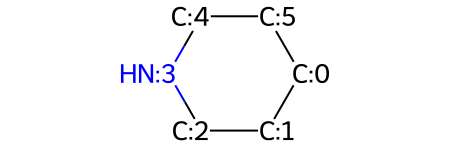

In [179]:
def first_175(mol):
    """NH(cyclic)"""
    query = Chem.MolFromSmarts('[N;H1;D2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_175_smiles1 = 'C1CCNCC1'
print(my_test(first_175_smiles1, first_175))
mol_with_atom_index(first_175_smiles1)

(1, ((1,),))


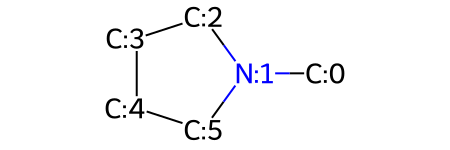

In [180]:
def first_176(mol):
    """N(cyclic)"""
    query = Chem.MolFromSmarts('[N;H0;D3;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_176_smiles1 = 'CN1CCCC1'
print(my_test(first_176_smiles1, first_176))
mol_with_atom_index(first_176_smiles1)

(0, ())


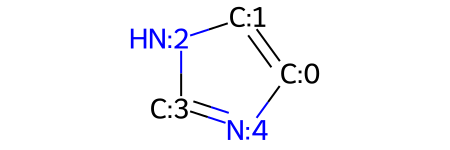

In [181]:
def first_177(mol):
    """CH=N(cyclic)"""
    query1 = Chem.MolFromSmarts('[C;H1]=[N;H0;D2;R]')
    match_list = mol.GetSubstructMatches(query1)
    return len(match_list), match_list


first_177_smiles1 = 'c1c[nH]cn1'
print(my_test(first_177_smiles1, first_177))
mol_with_atom_index(first_177_smiles1)

(0, ())


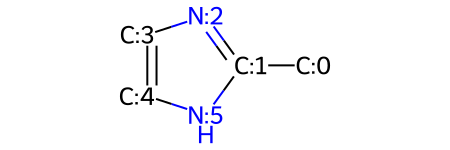

In [182]:
def first_178(mol):
    """C=N(cyclic)"""
    query = Chem.MolFromSmarts('[C;H0]=[N;H0;D2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_178_smiles1 = 'Cc1ncc[nH]1'
print(my_test(first_178_smiles1, first_178))
mol_with_atom_index(first_178_smiles1)

(1, ((3,),))


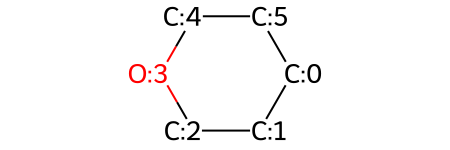

In [183]:
def first_179(mol):
    """O(cyclic)"""
    query = Chem.MolFromSmarts('[O;H0;D2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_179_smiles1 = 'C1CCOCC1'
print(my_test(first_179_smiles1, first_179))
mol_with_atom_index(first_179_smiles1)

(1, ((1, 0),))


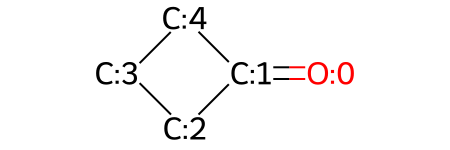

In [184]:
def first_180(mol):
    """CO(cyclic)"""
    query = Chem.MolFromSmarts('[C;H0;R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_180_smiles1 = 'O=C1CCC1'
print(my_test(first_180_smiles1, first_180))
mol_with_atom_index(first_180_smiles1)

(1, ((5,),))


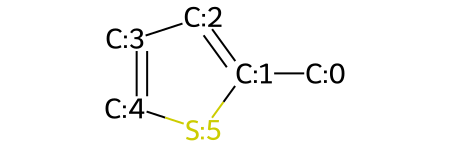

In [185]:
def first_181(mol):  # todo 芳香性
    """S(cyclic)"""
    query = Chem.MolFromSmarts('[S,s;H0;D2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_181_smiles1 = 'Cc1cccs1'
print(my_test(first_181_smiles1, first_181))
mol_with_atom_index(first_181_smiles1)

(1, ((0, 1, 2),))


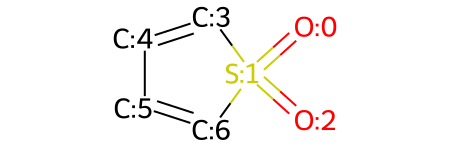

In [186]:
def first_182(mol):  # todo 芳香性
    """SO2(cyclic)"""
    query = Chem.MolFromSmarts('[O;H0;D1;!R]=[S,s;H0;D4;R]=[O;H0;D1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_182_smiles1 = 'O=S1(=O)C=CC=C1'
print(my_test(first_182_smiles1, first_182))
mol_with_atom_index(first_182_smiles1)

In [187]:
def first_183(mol):  
    """>NH"""
    query = Chem.MolFromSmarts('[N;H1;D3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [188]:
def first_184(mol):  
    """-O-"""
    query = Chem.MolFromSmarts('[O;H0;D2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [189]:
def first_185(mol):  
    """-S-"""
    query = Chem.MolFromSmarts('[S;H0;D2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [190]:
def first_186(mol):  
    """>CO"""
    query = Chem.MolFromSmarts('[C;H0;D3;!R]=[O;H0;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [191]:
def first_187(mol):  
    """PO2"""
    query = Chem.MolFromSmarts('[O;H0;!R][P;!R][O;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [192]:
def first_188(mol):  
    """CH-N"""
    query = Chem.MolFromSmarts('[C;H1;!R]-[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [193]:
def first_189(mol):  
    """SiHO"""
    query = Chem.MolFromSmarts('[Si;H1;!R]=[O;H0;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [194]:
def first_190(mol):  
    """SiO"""
    query = Chem.MolFromSmarts('[Si;H0;!R]=[O;H0;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [195]:
def first_191(mol):  
    """SiH2"""
    query = Chem.MolFromSmarts('[Si;H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [196]:
def first_192(mol):  
    """SiH1"""
    query = Chem.MolFromSmarts('[Si;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [197]:
def first_193(mol):  
    """Si"""
    query = Chem.MolFromSmarts('[Si;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [198]:
def first_194(mol):  
    """(CH3)3N"""
    query = Chem.MolFromSmarts('[C;H3][N;!R]([C;H3])[C;H3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [199]:
def first_195(mol):  
    """N=N"""
    query = Chem.MolFromSmarts('[N;H0;!R]=[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [200]:
def first_196(mol):  
    """Ccyc=N-"""
    query = Chem.MolFromSmarts('[C;H0;R]=[N;H0;D2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [201]:
def first_197(mol):  
    """Ccyc=CH-"""
    query = Chem.MolFromSmarts('[C;H0;R]=[C;H1;D2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [202]:
def first_198(mol):  
    """Ccyc=NH"""
    query = Chem.MolFromSmarts('[C;H0;R]=[N;H1;D1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [203]:
def first_199(mol):  
    """N=O"""
    query = Chem.MolFromSmarts('[N;H0;!R]=[O;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [204]:
def first_200(mol):  
    """Ccyc=C"""
    query = Chem.MolFromSmarts('[C;H0;R]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [205]:
def first_201(mol):  
    """P=O"""
    query = Chem.MolFromSmarts('[P;H0;!R]=[O;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [206]:
def first_202(mol):  
    """N=N"""
    query = Chem.MolFromSmarts('[N;H0;!R]=[N;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [207]:
def first_203(mol):  
    """C=NH"""
    query = Chem.MolFromSmarts('[C;H0;!R]=[N;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [208]:
def first_204(mol):  
    """>C=S"""
    query = Chem.MolFromSmarts('[C;H0;!R;D3]=[S;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [209]:
def first_205(mol):  
    """aC-CON"""
    query = Chem.MolFromSmarts('[c]!@&-[C](=[O;H0;D1])[N;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [210]:
def first_206(mol):  
    """aC=O"""
    query = Chem.MolFromSmarts('[c]!@&=[O;H0;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [211]:
def first_207(mol):  
    """aN-"""
    query = Chem.MolFromSmarts('[n;H0;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [212]:
def first_208(mol):  
    """-Na"""
    query = Chem.MolFromSmarts('[Na]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [213]:
def first_209(mol):  
    """-K"""
    query = Chem.MolFromSmarts('[K]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [214]:
def first_210(mol):  
    """HCONH"""
    query = Chem.MolFromSmarts('[C;H1;!R](=[O;H0;D1])[N;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [215]:
def first_211(mol):  
    """CHOCH"""
    query = Chem.MolFromSmarts('[C;H1;!R](=[O;H0;D1])[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [216]:
def first_212(mol):  
    """C2O"""
    query = Chem.MolFromSmarts('[C;H0;R]1[O;H0;R][C;H0;R]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [217]:
def first_213(mol):  
    """SiH3"""
    query = Chem.MolFromSmarts('[Si;H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [218]:
def first_214(mol):  # todo ?
    """SiH2O"""
    query = Chem.MolFromSmarts('[Si;H2;!R][O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [219]:
def first_215(mol):  
    """CH=C=CH"""
    query = Chem.MolFromSmarts('[C;H1;!R]=[C;H0;!R]=[C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [220]:
def first_216(mol):  
    """CH=C=C"""
    query = Chem.MolFromSmarts('[C;H1;!R]=[C;H0;!R]=[C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [221]:
def first_217(mol):  
    """OP(=S)O"""
    query = Chem.MolFromSmarts('[O;H0][P;H0](=[S;H0])[O;H0]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

(7, ((0,), (1,), (2,), (3,), (4,), (5,), (6,)))


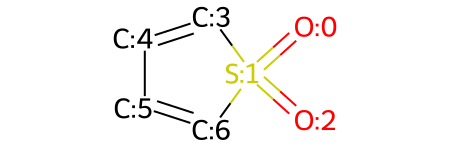

In [222]:
def first_218(mol):  # todo ?
    """R"""
    query = Chem.MolFromSmarts('[*]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


first_218_smiles1 = 'O=S1(=O)C=CC=C1'
print(my_test(first_218_smiles1, first_218))
mol_with_atom_index(first_218_smiles1)

In [223]:
def first_219(mol): 
    """CF2cyc"""
    query = Chem.MolFromSmarts('[F][C;H0;R][F]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

In [224]:
def first_220(mol): 
    """CFcyc"""
    query = Chem.MolFromSmarts('[F][C;H0;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

(1, ((4, 3, 5),))


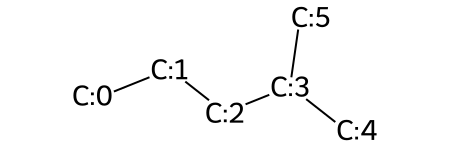

In [225]:
def second_001(mol):
    """(CH3)2CH"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1][C;H1;!R;D3][C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_001_smiles1 = 'CCCC(C)C'
print(my_test(second_001_smiles1, second_001))
mol_with_atom_index(second_001_smiles1)

(2, ((0, 1, 2, 3), (6, 5, 7, 8)))


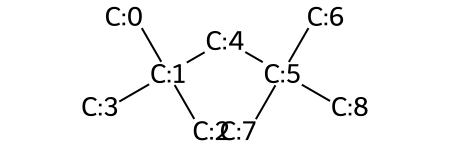

In [226]:
def second_002(mol):
    """(CH3)3C"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1][C;H0;!R;D4]([C;H3;!R;D1])[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_002_smiles1 = 'CC(C)(C)CC(C)(C)C'
print(my_test(second_002_smiles1, second_002))
mol_with_atom_index(second_002_smiles1)

(2, ((0, 1, 2, 3, 4, 5), (1, 3, 4, 5, 6, 7)))


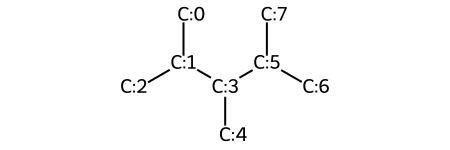

In [227]:
def second_003(mol):
    """CH(CH3)CH(CH3)"""
    query = Chem.MolFromSmarts('[*]-[C;H1;!R;D3]([C;H3;!R;D1])[C;H1;!R;D3]([C;H3;!R;D1])-[*]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_003_smiles1 = 'CC(C)C(C)C(C)C'
print(my_test(second_003_smiles1, second_003))
mol_with_atom_index(second_003_smiles1)

(2, ((2, 1, 0, 6, 7, 8, 9), (6, 1, 0, 2, 3, 4, 5)))


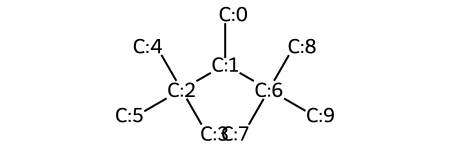

In [228]:
def second_004(mol):
    """CH(CH3)C(CH3)2"""
    query = Chem.MolFromSmarts('[*]-[C;H1;!R;D3]([C;H3;!R;D1])[C;H0;!R;D4]([*])([C;H3;!R;D1])[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_004_smiles1 = 'CC(C(C)(C)C)C(C)(C)C'
print(my_test(second_004_smiles1, second_004))
mol_with_atom_index(second_004_smiles1)

(2, ((0, 1, 2, 3, 4, 7, 5, 6), (1, 4, 5, 6, 7, 8, 9, 10)))


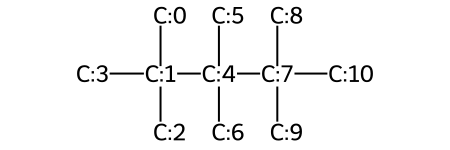

In [229]:
def second_005(mol):
    """C(CH3)2C(CH3)2"""
    query = Chem.MolFromSmarts('[*]-[C;H0;!R;D4]([C;H3;!R;D1])([C;H3;!R;D1])[C;H0;!R;D4]([*])([C;H3;!R;D1])[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_005_smiles1 = 'CC(C)(C)C(C)(C)C(C)(C)C'
print(my_test(second_005_smiles1, second_005))
mol_with_atom_index(second_005_smiles1)

(1, ((0, 1, 2, 3),))


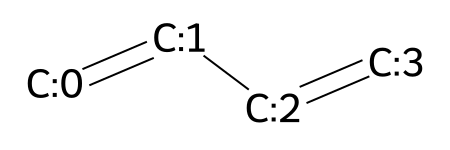

In [230]:
def second_006(mol):
    """CHn=CHm-CHp=CHk k,m,n,p=0,1,2"""
    query = Chem.MolFromSmarts('[C;!R]=[C;!R]-[C;!R]=[C;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_006_smiles1 = 'C=CC=C'
print(my_test(second_006_smiles1, second_006))
mol_with_atom_index(second_006_smiles1)

(3, ((0, 1, 2), (3, 2, 1), (4, 2, 1)))


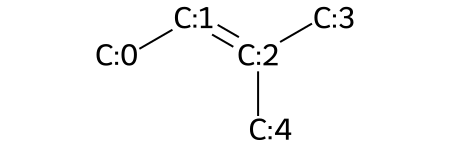

In [231]:
def second_007(mol):
    """CH3-CHm=CHn   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[C;!R]=[C;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_007_smiles1 = 'CC=C(C)C'
print(my_test(second_007_smiles1, second_007))
mol_with_atom_index(second_007_smiles1)

(2, ((2, 1, 0), (2, 3, 4)))


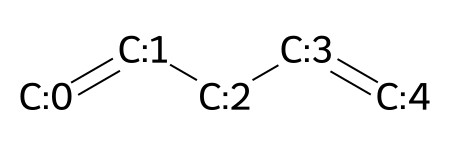

In [232]:
def second_008(mol):
    """CH2-CHm=CHn   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H2;!R;D2]-[C;!R]=[C;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_008_smiles1 = 'C=CCC=C'
print(my_test(second_008_smiles1, second_008))
mol_with_atom_index(second_008_smiles1)

(1, ((2, 1, 0),))


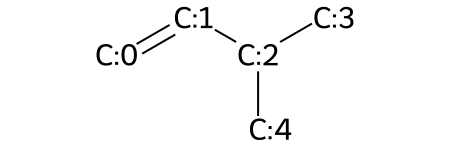

In [233]:
def second_009(mol):
    """CHp-CHm=CHn   p=0,1 m,n=0,1,2"""
    query1 = Chem.MolFromSmarts('[C;H0;!R;D4]-[C;!R]=[C;!R]')
    query2 = Chem.MolFromSmarts('[C;H1;!R;D3]-[C;!R]=[C;!R]')
    match_list1 = mol.GetSubstructMatches(query1)
    match_list2 = mol.GetSubstructMatches(query2)
    match_list = match_list1 + match_list2
    return len(match_list), match_list


def second_009(mol):
    """CHp-CHm=CHn   p=0,1 m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;!H2;!R]-[C;!R]=[C;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_009_smiles1 = 'C=CC(C)C'
print(my_test(second_009_smiles1, second_009))
mol_with_atom_index(second_009_smiles1)

(1, ((2, 4, 5),))


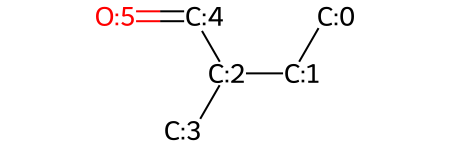

In [234]:
def second_010(mol):
    """CHCHO or CCHO"""
    query1 = Chem.MolFromSmarts('[C;H1;!R][C;H1;!R;D2]=[O;H0;D1]')
    query2 = Chem.MolFromSmarts('[C;H0;!R][C;H1;!R;D2]=[O;H0;D1]')
    match_list = mol.GetSubstructMatches(query1) + mol.GetSubstructMatches(query2)
    return len(match_list), match_list


second_010_smiles1 = 'CCC(C)C=O'
print(my_test(second_010_smiles1, second_010))
mol_with_atom_index(second_010_smiles1)

(1, ((4, 3, 5, 2),))


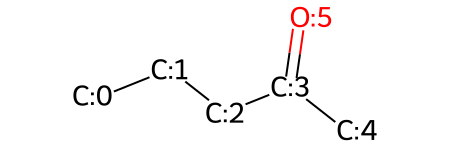

In [235]:
def second_011(mol):
    """CH3COCH2"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_011_smiles1 = 'CCCC(C)=O'
print(my_test(second_011_smiles1, second_011))
mol_with_atom_index(second_011_smiles1)

(1, ((5, 4, 6, 2),))


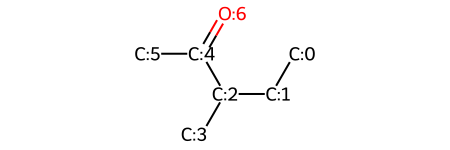

In [236]:
def second_012(mol):
    """CH3COCH or CH3COC"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H1,H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_012_smiles1 = 'CCC(C)C(C)=O'
print(my_test(second_012_smiles1, second_012))
mol_with_atom_index(second_012_smiles1)

(1, ((7, 5, 6, 2),))


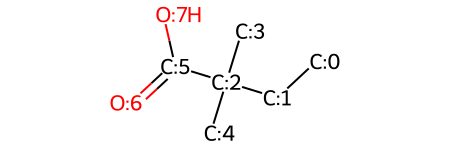

In [237]:
def second_013(mol):
    """CHCOOH or CCOOH"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H1,H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_013_smiles1 = 'CCC(C)(C)C(=O)O'
print(my_test(second_013_smiles1, second_013))
mol_with_atom_index(second_013_smiles1)

(1, ((0, 1, 2, 3, 4),))


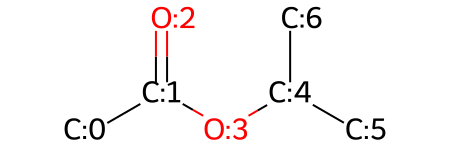

In [238]:
def second_014(mol):
    """CH3COOCH or CH3COOC"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H0;!R;D2]-[C;H1,H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_014_smiles1 = 'CC(=O)OC(C)C'
print(my_test(second_014_smiles1, second_014))
mol_with_atom_index(second_014_smiles1)

(1, ((3, 2, 4, 5, 6),))


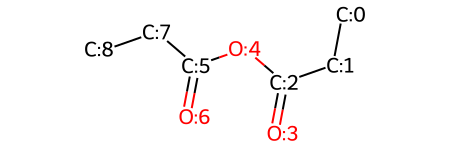

In [239]:
def second_015(mol):
    """CO-O-CO"""
    query = Chem.MolFromSmarts('[O;H0;!R;D1]=[C;H0;!R;D3]-[O;H0;!R;D2]-[C;H0;!R;D3]=[O;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_015_smiles1 = 'CCC(=O)OC(=O)CC'
print(my_test(second_015_smiles1, second_015))
mol_with_atom_index(second_015_smiles1)

(1, ((2, 4),))


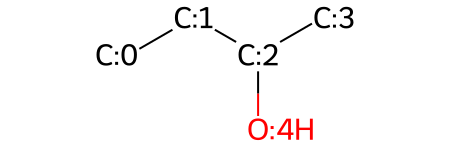

In [240]:
def second_016(mol):
    """CHOH"""
    query = Chem.MolFromSmarts('[C;H1;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_016_smiles1 = 'CCC(C)O'
print(my_test(second_016_smiles1, second_016))
mol_with_atom_index(second_016_smiles1)

(1, ((2, 5),))


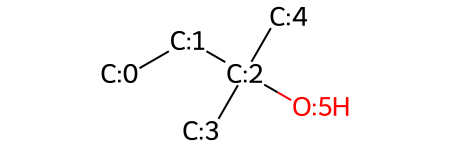

In [241]:
def second_017(mol):
    """COH"""
    query = Chem.MolFromSmarts('[C;H0;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_017_smiles1 = 'CCC(C)(C)O'
print(my_test(second_017_smiles1, second_017))
mol_with_atom_index(second_017_smiles1)

(1, ((0, 1, 2, 3, 5),))


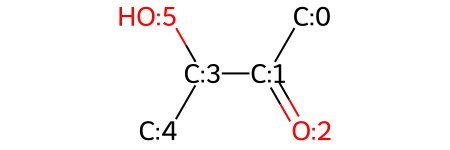

In [242]:
def second_018(mol):
    """CH3COCHnOH   n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])[C;H0,H1,H2;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_018_smiles1 = 'CC(=O)C(C)O'
print(my_test(second_018_smiles1, second_018))
mol_with_atom_index(second_018_smiles1)

(1, ((4, 3, 1, 2),))


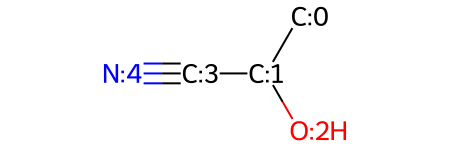

In [243]:
def second_019(mol):
    """NCCHOH or NCCOH"""
    query = Chem.MolFromSmarts('[N;H0;!R;D1]#[C;H0;!R;D2][C;H0,H1;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_019_smiles1 = 'CC(O)C#N'
print(my_test(second_019_smiles1, second_019))
mol_with_atom_index(second_019_smiles1)

(1, ((7, 5, 3, 4, 2),))


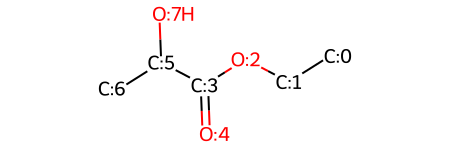

In [244]:
def second_020(mol):
    """OH-CHn-COO   n=0,1,2"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1]-[C;H0,H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_020_smiles1 = 'CCOC(=O)C(C)O'
print(my_test(second_020_smiles1, second_020))
mol_with_atom_index(second_020_smiles1)

(1, ((0, 1, 2, 3),))


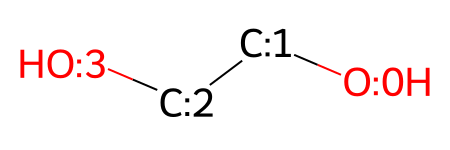

In [245]:
def second_021(mol):
    """CHm(OH)CHn(OH)   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1]-[C;H0,H1,H2;!R]-[C;H0,H1,H2;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_021_smiles1 = 'OCCO'
print(my_test(second_021_smiles1, second_021))
mol_with_atom_index(second_021_smiles1)

(1, ((5, 4, 2, 3),))


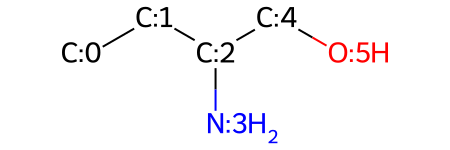

In [246]:
def second_022(mol):
    """CHm(OH)CHn(NHp)   m,n,p=0,1,2"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1]-[C;H0,H1,H2;!R]-[C;H0,H1,H2;!R]-[N;H0,H1,H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_022_smiles1 = 'CCC(N)CO'
print(my_test(second_022_smiles1, second_022))
mol_with_atom_index(second_022_smiles1)

(1, ((0, 1, 2, 3),))


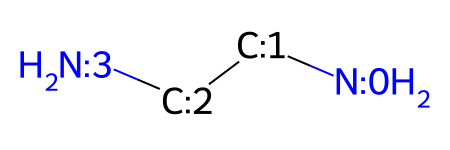

In [247]:
def second_023(mol):
    """CHm(NH2)CHn(NH2)   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[N;H2;!R;D1]-[C;H0,H1,H2;!R]-[C;H0,H1,H2;!R]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_023_smiles1 = 'NCCN'
print(my_test(second_023_smiles1, second_023))
mol_with_atom_index(second_023_smiles1)

(2, ((3, 2, 1, 0), (3, 4, 5, 6)))


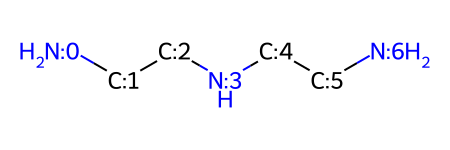

In [248]:
def second_024(mol):
    """CHm(NH)CHn(NH2)   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[N;H;!R;D2]-[C;H0,H1,H2;!R]-[C;H0,H1,H2;!R]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_024_smiles1 = 'NCCNCCN'
print(my_test(second_024_smiles1, second_024))
mol_with_atom_index(second_024_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 7, 6),))


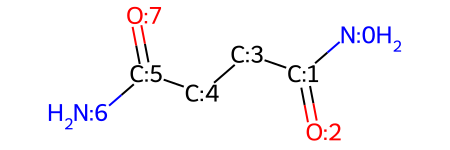

In [249]:
def second_025(mol):
    """H2NCOCHnCHmCONH2   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[N;H2;!R;D1]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H0,H1,H2;!R][C;H0,H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_025_smiles1 = 'NC(=O)CCC(N)=O'
print(my_test(second_025_smiles1, second_025))
mol_with_atom_index(second_025_smiles1)

(1, ((2, 1, 3, 4, 5),))


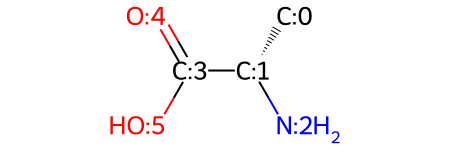

In [250]:
def second_026(mol):
    """CHm(NHn)-COOH   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[N;H0,H1,H2;!R]-[C;H0,H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_026_smiles1 = 'C[C@H](N)C(=O)O'
print(my_test(second_026_smiles1, second_026))
mol_with_atom_index(second_026_smiles1)

(1, ((3, 1, 0, 2, 4, 5, 6),))


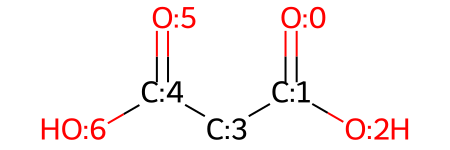

In [251]:
def second_027(mol):
    """HOOC-CHn-COOH   n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_027_smiles1 = 'O=C(O)CC(=O)O'
print(my_test(second_027_smiles1, second_027))
mol_with_atom_index(second_027_smiles1)

(1, ((3, 1, 0, 2, 4, 5, 6, 7),))


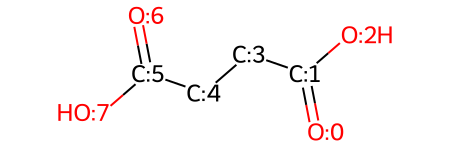

In [252]:
def second_028(mol):
    """HOOC-CHn-CHm-COOH   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])-[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_028_smiles1 = 'O=C(O)CCC(=O)O'
print(my_test(second_028_smiles1, second_028))
mol_with_atom_index(second_028_smiles1)

(1, ((3, 1, 4, 5, 6),))


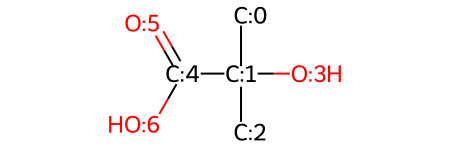

In [253]:
def second_029(mol):
    """HO-CHn-COOH   n=0,1,2"""
    query = Chem.MolFromSmarts('[O;H1;!R;D1][C;H0,H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_029_smiles1 = 'CC(C)(O)C(=O)O'
print(my_test(second_029_smiles1, second_029))
mol_with_atom_index(second_029_smiles1)

(1, ((1, 0, 2, 3, 4, 5),))


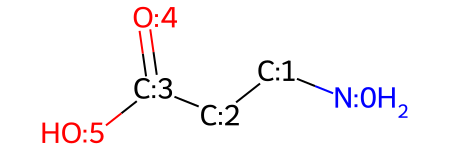

In [254]:
def second_030(mol):
    """NH2-CHn-CHm-COOH   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([N;H2;!R;D1])-[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_030_smiles1 = 'NCCC(=O)O'
print(my_test(second_030_smiles1, second_030))
mol_with_atom_index(second_030_smiles1)

(1, ((0, 1, 2, 3, 4, 5),))


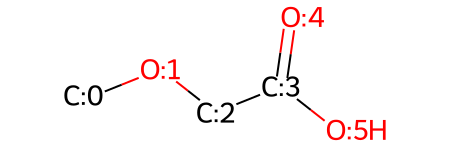

In [255]:
def second_031(mol):
    """CH3-O-CHn-COOH   n=1,2"""
    query = Chem.MolFromSmarts('[C;H3;!R;D1]-[O;H0;!R;D2]-[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_031_smiles1 = 'COCC(=O)O'
print(my_test(second_031_smiles1, second_031))
mol_with_atom_index(second_031_smiles1)

(1, ((2, 1, 3, 4, 5),))


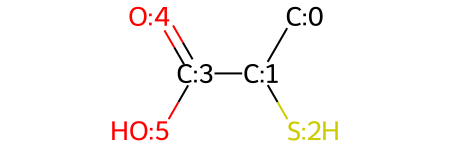

In [256]:
def second_032(mol):
    """HS-CH-COOH"""
    query = Chem.MolFromSmarts('[S;H1;!R;D1][C;H1;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_032_smiles1 = 'CC(S)C(=O)O'
print(my_test(second_032_smiles1, second_032))
mol_with_atom_index(second_032_smiles1)

(1, ((1, 2, 3, 4, 5, 6),))


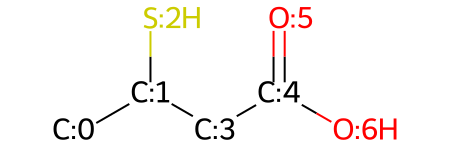

In [257]:
def second_033(mol):
    """HS-CHn-CHm-COOH   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([S;H1;!R;D1])-[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_033_smiles1 = 'CC(S)CC(=O)O'
print(my_test(second_033_smiles1, second_033))
mol_with_atom_index(second_033_smiles1)

(1, ((2, 1, 0, 3, 4, 5),))


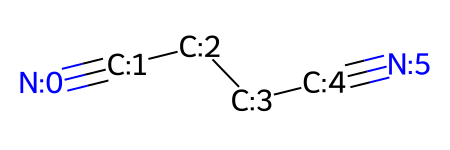

In [258]:
def second_034(mol):
    """NC-CHn-CHm-CN   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([C;H0;!R;D2]#[N;H0;!R;D1])-[C;H1,H2;!R]([C;H0;!R;D2]#[N;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_034_smiles1 = 'N#CCCC#N'
print(my_test(second_034_smiles1, second_034))
mol_with_atom_index(second_034_smiles1)

(1, ((3, 4, 2, 1, 0),))


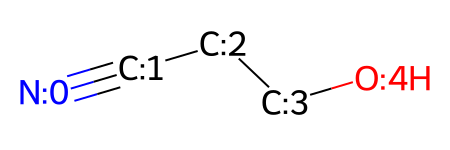

In [259]:
def second_035(mol):
    """OH-CHn-CHm-CN   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([O;H1;!R;D1])-[C;H1,H2;!R]([C;H0;!R;D2]#[N;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_035_smiles1 = 'N#CCCO'
print(my_test(second_035_smiles1, second_035))
mol_with_atom_index(second_035_smiles1)

(1, ((1, 0, 2, 3),))


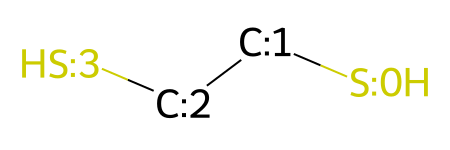

In [260]:
def second_036(mol):
    """HS-CHn-CHm-SH   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([S;H1;!R;D1])-[C;H1,H2;!R]([S;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_036_smiles1 = 'SCCS'
print(my_test(second_036_smiles1, second_036))
mol_with_atom_index(second_036_smiles1)

(1, ((4, 3, 1, 2, 5, 6, 7, 9),))


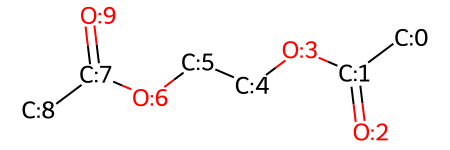

In [261]:
def second_037(mol):
    """COO-CHn-CHm-OOC   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([O;H0;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1]))-[C;H1,H2;!R]([O;H0;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1]))')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_037_smiles1 = 'CC(=O)OCCOC(C)=O'
print(my_test(second_037_smiles1, second_037))
mol_with_atom_index(second_037_smiles1)

(1, ((4, 2, 3, 1, 5, 6, 7, 8),))


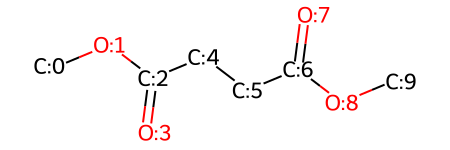

In [262]:
def second_038(mol):
    """OOC-CHn-CHm-COO   m,n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([C;H0;D3;!R](=[O;H0;!R;D1])[O;H0;!R;D2])-[C;H1,H2;!R]([C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_038_smiles1 = 'COC(=O)CCC(=O)OC'
print(my_test(second_038_smiles1, second_038))
mol_with_atom_index(second_038_smiles1)

(1, ((4, 5, 6, 2, 3, 1),))


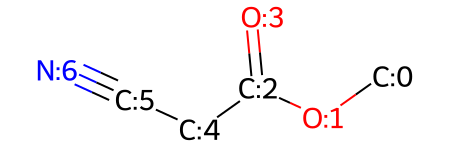

In [263]:
def second_039(mol):
    """NC-CHn-COO   n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([C;H0;!R;D2]#[N;H0;!R;D1])([C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_039_smiles1 = 'COC(=O)CC#N'
print(my_test(second_039_smiles1, second_039))
mol_with_atom_index(second_039_smiles1)

(1, ((4, 2, 3, 5, 6, 7),))


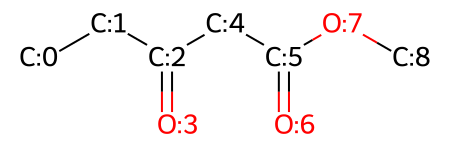

In [264]:
def second_040(mol):
    """COCHnCOO   n=1,2"""
    query = Chem.MolFromSmarts('[C;H1,H2;!R]([C;H0;!R;D3](=[O;H0;!R;D1]))([C;H0;D3;!R](=[O;H0;!R;D1])[O;H0;!R;D2])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_040_smiles1 = 'CCC(=O)CC(=O)OC'
print(my_test(second_040_smiles1, second_040))
mol_with_atom_index(second_040_smiles1)

(1, ((3, 2, 1, 0),))


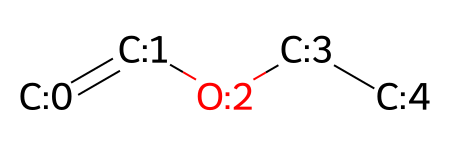

In [265]:
def second_041(mol):
    """CHm-O-CHn=CHp   m,n,p=0,1,2,3"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2,H3;!R]-[O;H0;!R;D2]-[C;H0,H1,H2,H3;!R]=[C;H0,H1,H2,H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_041_smiles1 = 'C=COCC'
print(my_test(second_041_smiles1, second_041))
mol_with_atom_index(second_041_smiles1)

(1, ((1, 2, 3),))


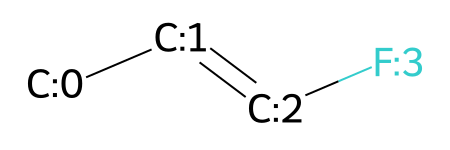

In [266]:
def second_042(mol):
    """CHm=CHn-F   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_042_smiles1 = 'CC=CF'
print(my_test(second_042_smiles1, second_042))
mol_with_atom_index(second_042_smiles1)

(1, ((1, 2, 3),))


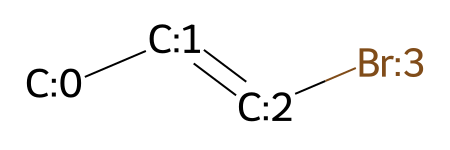

In [267]:
def second_043(mol):
    """CHm=CHn-Br   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-Br')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_043_smiles1 = 'CC=CBr'
print(my_test(second_043_smiles1, second_043))
mol_with_atom_index(second_043_smiles1)

(1, ((1, 2, 3),))


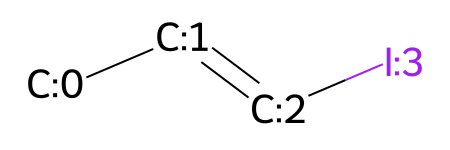

In [268]:
def second_044(mol):
    """CHm=CHn-I   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-I')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_044_smiles1 = 'C/C=C/I'
print(my_test(second_044_smiles1, second_044))
mol_with_atom_index(second_044_smiles1)

(1, ((1, 3, 4),))


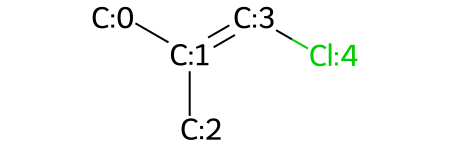

In [269]:
def second_045(mol):
    """CHm=CHn-Cl   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_045_smiles1 = 'CC(C)=CCl'
print(my_test(second_045_smiles1, second_045))
mol_with_atom_index(second_045_smiles1)

(1, ((0, 1, 2, 3),))


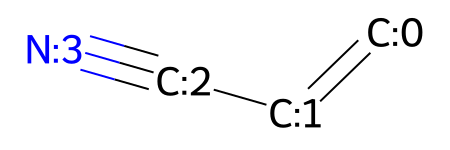

In [270]:
def second_046(mol):
    """CHm=CHn-CN   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_046_smiles1 = 'C=CC#N'
print(my_test(second_046_smiles1, second_046))
mol_with_atom_index(second_046_smiles1)

(1, ((0, 1, 2, 3, 4, 5),))


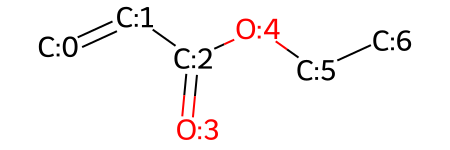

In [271]:
def second_047(mol):
    """CHm=CHn-COO-CHp   m,n,p=0,1,2,3"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-[C;H0;!R](=[O;H0;D1;!R])[O;H0;!R;D2]-[C;H0,H1,H2,H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_047_smiles1 = 'C=CC(=O)OCC'
print(my_test(second_047_smiles1, second_047))
mol_with_atom_index(second_047_smiles1)

(1, ((0, 1, 2, 3),))


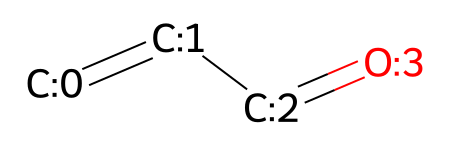

In [272]:
def second_048(mol):
    """CHm=CHn-CHO   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_048_smiles1 = 'C=CC=O'
print(my_test(second_048_smiles1, second_048))
mol_with_atom_index(second_048_smiles1)

(1, ((0, 1, 2, 3, 4),))


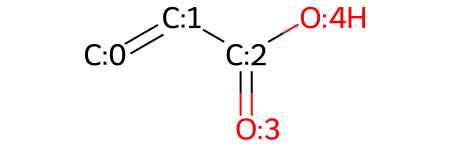

In [273]:
def second_049(mol):
    """CHm=CHn-COOH   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_049_smiles1 = 'C=CC(=O)O'
print(my_test(second_049_smiles1, second_049))
mol_with_atom_index(second_049_smiles1)

(1, ((2, 1, 0),))


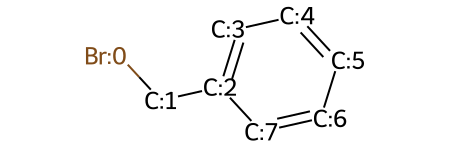

In [274]:
def second_050(mol):
    """aC-CHn-X   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[F,Cl,Br,I]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_050_smiles1 = 'BrCc1ccccc1'
print(my_test(second_050_smiles1, second_050))
mol_with_atom_index(second_050_smiles1)

(1, ((2, 1, 0),))


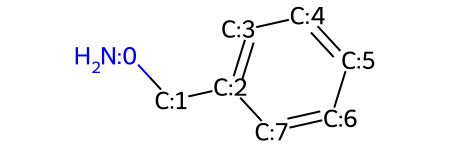

In [275]:
def second_051(mol):
    """aC-CHn-NHm   n=1,2 m=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[N;H0,H1,H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_051_smiles1 = 'NCc1ccccc1'
print(my_test(second_051_smiles1, second_051))
mol_with_atom_index(second_051_smiles1)

(1, ((4, 3, 2),))


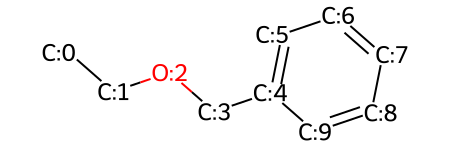

In [276]:
def second_052(mol):
    """aC-CHn-O-   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_052_smiles1 = 'CCOCc1ccccc1'
print(my_test(second_052_smiles1, second_052))
mol_with_atom_index(second_052_smiles1)

(1, ((2, 1, 0),))


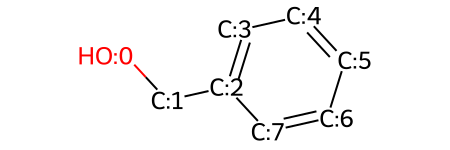

In [277]:
def second_053(mol):
    """aC-CHn-OH   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_053_smiles1 = 'OCc1ccccc1'
print(my_test(second_053_smiles1, second_053))
mol_with_atom_index(second_053_smiles1)

(1, ((3, 2, 1, 0),))


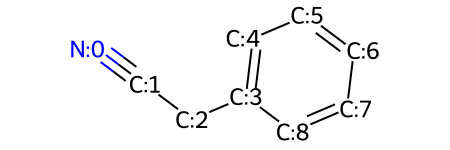

In [278]:
def second_054(mol):
    """aC-CHn-CN   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_054_smiles1 = 'N#CCc1ccccc1'
print(my_test(second_054_smiles1, second_054))
mol_with_atom_index(second_054_smiles1)

(1, ((3, 2, 1, 0),))


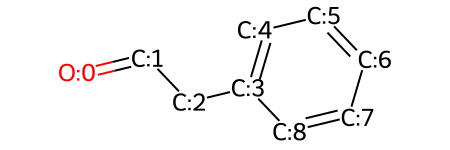

In [279]:
def second_055(mol):
    """aC-CHn-CHO   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_055_smiles1 = 'O=CCc1ccccc1'
print(my_test(second_055_smiles1, second_055))
mol_with_atom_index(second_055_smiles1)

(1, ((2, 1, 0),))


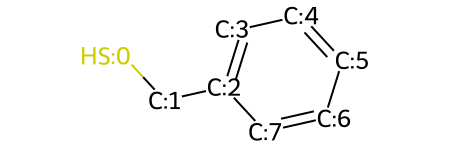

In [280]:
def second_056(mol):
    """aC-CHn-SH   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_056_smiles1 = 'SCc1ccccc1'
print(my_test(second_056_smiles1, second_056))
mol_with_atom_index(second_056_smiles1)

(1, ((4, 3, 1, 0, 2),))


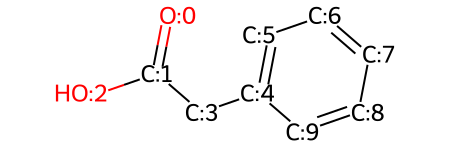

In [281]:
def second_057(mol):
    """aC-CHn-COOH   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_057_smiles1 = 'O=C(O)Cc1ccccc1'
print(my_test(second_057_smiles1, second_057))
mol_with_atom_index(second_057_smiles1)

(1, ((4, 3, 1, 2),))


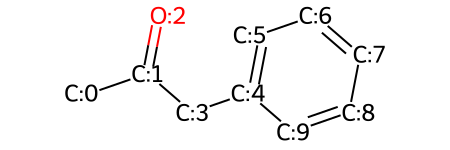

In [282]:
def second_058(mol):
    """aC-CHn-CO-   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_058_smiles1 = 'CC(=O)Cc1ccccc1'
print(my_test(second_058_smiles1, second_058))
mol_with_atom_index(second_058_smiles1)

(1, ((3, 2, 1),))


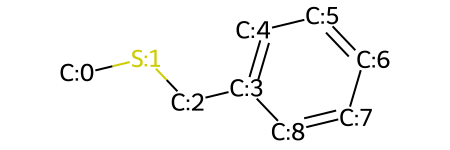

In [283]:
def second_059(mol):
    """aC-CHn-S-   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_059_smiles1 = 'CSCc1ccccc1'
print(my_test(second_059_smiles1, second_059))
mol_with_atom_index(second_059_smiles1)

(1, ((4, 3, 2, 1, 0),))


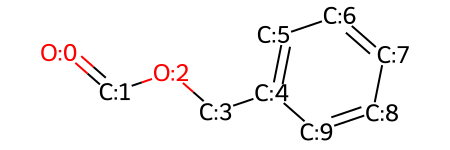

In [284]:
def second_060(mol):
    """aC-CHn-OOC-H   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]([O;H0;!R;D2][C;H1;!R;D2](=[O;H0;!R;D1]))')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_060_smiles1 = 'O=COCc1ccccc1'
print(my_test(second_060_smiles1, second_060))
mol_with_atom_index(second_060_smiles1)

(1, ((4, 3, 1, 2, 0),))


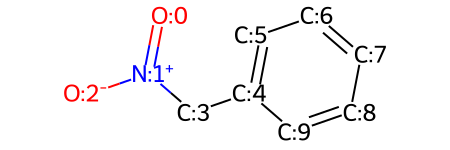

In [285]:
def second_061(mol):
    """aC-CHn-NO2   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_061_smiles1 = 'O=[N+]([O-])Cc1ccccc1'
print(my_test(second_061_smiles1, second_061))
mol_with_atom_index(second_061_smiles1)

(1, ((4, 3, 1, 2, 0),))


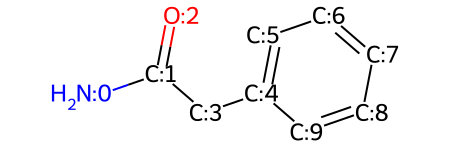

In [286]:
def second_062(mol):
    """aC-CHn-CONH2   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_062_smiles1 = 'NC(=O)Cc1ccccc1'
print(my_test(second_062_smiles1, second_062))
mol_with_atom_index(second_062_smiles1)

(1, ((5, 4, 3, 1, 2),))


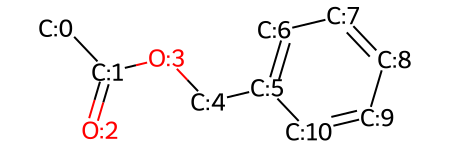

In [287]:
def second_063(mol):
    """aC-CHn-OOC   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]([O;H0;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1]))')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_063_smiles1 = 'CC(=O)OCc1ccccc1'
print(my_test(second_063_smiles1, second_063))
mol_with_atom_index(second_063_smiles1)

(1, ((5, 4, 2, 3, 1),))


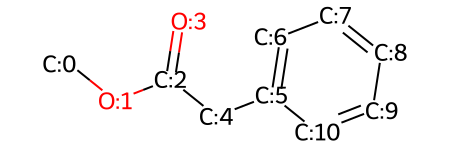

In [288]:
def second_064(mol):
    """aC-CHn-COO   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H1,H2;!R]([C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_064_smiles1 = 'COC(=O)Cc1ccccc1'
print(my_test(second_064_smiles1, second_064))
mol_with_atom_index(second_064_smiles1)

(1, ((4, 1, 0, 2, 3),))


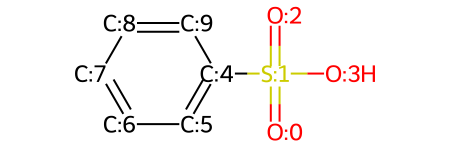

In [289]:
def second_065(mol):
    """aC-SO2-OH   n=1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[S;H0;!R;D4](=[O;H0;!R;D1])(=[O;H0;!R;D1])[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_065_smiles1 = 'O=S(=O)(O)c1ccccc1'
print(my_test(second_065_smiles1, second_065))
mol_with_atom_index(second_065_smiles1)

(1, ((3, 1, 0, 2),))


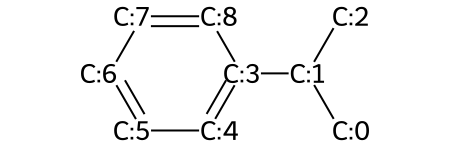

In [290]:
def second_066(mol):
    """aC-CH(CH3)2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H1;!R;D3]([C;H3;!R;D1])([C;H3;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_066_smiles1 = 'CC(C)c1ccccc1'
print(my_test(second_066_smiles1, second_066))
mol_with_atom_index(second_066_smiles1)

(1, ((4, 1, 0, 2, 3),))


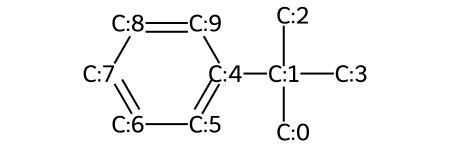

In [291]:
def second_067(mol):
    """aC-C(CH3)3"""
    query = Chem.MolFromSmarts('[c;H0;R;D3][C;H0;!R;D4]([C;H3;!R;D1])([C;H3;!R;D1])([C;H3;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_067_smiles1 = 'CC(C)(C)c1ccccc1'
print(my_test(second_067_smiles1, second_067))
mol_with_atom_index(second_067_smiles1)

(1, ((6, 7, 8, 9, 10),))


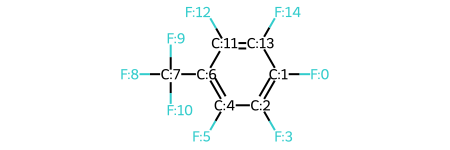

In [292]:
def second_068(mol):
    """aC-CF3"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D4](F)(F)F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_068_smiles1 = 'Fc1c(F)c(F)c(C(F)(F)F)c(F)c1F'
print(my_test(second_068_smiles1, second_068))
mol_with_atom_index(second_068_smiles1)

(1, ((3, 2, 1, 0),))


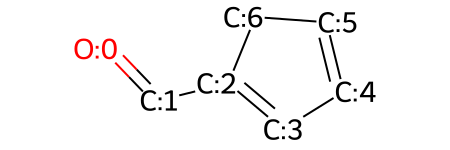

In [293]:
def second_069(mol):
    """(CHn=C)(cyclic)-CHO   n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_069_smiles1 = 'O=Cc1ccco1'
second_069_smiles1 = 'O=CC1=CC=CC1'
print(my_test(second_069_smiles1, second_069))
mol_with_atom_index(second_069_smiles1)

(1, ((5, 4, 2, 3, 1, 0),))


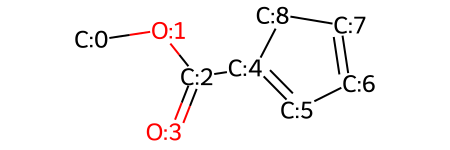

In [294]:
def second_070(mol):
    """(CHn=C)(cyclic)-COO-CHm   m,n=0,1,2,3"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H0;!R;D2]-[C;H0,H1,H2,H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_070_smiles1 = 'COC(=O)c1ccco1'
second_070_smiles1 = 'COC(=O)C1=CC=CC1'
print(my_test(second_070_smiles1, second_070))
mol_with_atom_index(second_070_smiles1)

(1, ((4, 3, 1, 2),))


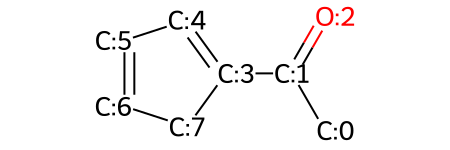

In [295]:
def second_071(mol):
    """(CHn=C)(cyclic)-CO-   n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_071_smiles1 = 'CC(=O)c1ccco1'
second_071_smiles1 = 'CC(=O)C1=CC=CC1'
print(my_test(second_071_smiles1, second_071))
mol_with_atom_index(second_071_smiles1)

(2, ((1, 2, 3), (2, 1, 0)))


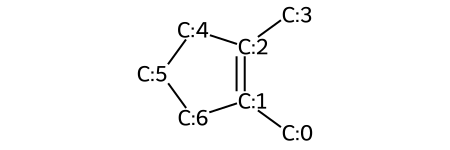

In [296]:
def second_072(mol):
    """(CHn=C)cyc-CH3, n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_072_smiles1 = 'CC1=C(C)CCC1'
print(my_test(second_072_smiles1, second_072))
mol_with_atom_index(second_072_smiles1)

(1, ((3, 2, 1),))


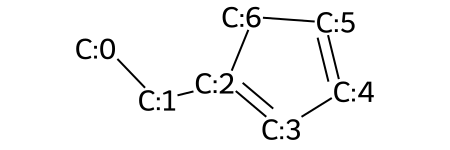

In [297]:
def second_073(mol):
    """(CHn=C)cyc-CH2, n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_073_smiles1 = 'CCc1ccco1'
second_073_smiles1 = 'CCC1=CC=CC1'
print(my_test(second_073_smiles1, second_073))
mol_with_atom_index(second_073_smiles1)

(1, ((3, 2, 1, 0),))


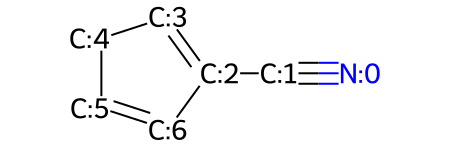

In [298]:
def second_074(mol):
    """(CHn=C)(cyclic)-CN   n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_074_smiles1 = 'N#Cc1ccoc1'
second_074_smiles1 = 'N#CC1=CCC=C1'
print(my_test(second_074_smiles1, second_074))
mol_with_atom_index(second_074_smiles1)

(1, ((2, 1, 0),))


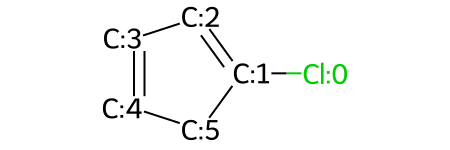

In [299]:
def second_075(mol):
    """(CHn=C)(cyclic)-Cl   n=0,1,2"""
    query = Chem.MolFromSmarts('[C;H0,H1,H2;R]=[C;H0;R;D3]-Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_075_smiles1 = 'Clc1ccco1'
second_075_smiles1 = 'ClC1=CC=CC1'
print(my_test(second_075_smiles1, second_075))
mol_with_atom_index(second_075_smiles1)

(1, ((1, 0),))


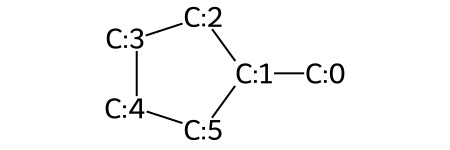

In [300]:
def second_076(mol):
    """CHcyc-CH3"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_076_smiles1 = 'CC1CCCC1'
print(my_test(second_076_smiles1, second_076))
mol_with_atom_index(second_076_smiles1)

(1, ((2, 1),))


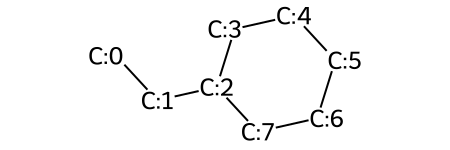

In [301]:
def second_077(mol):
    """CHcyc-CH2"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_077_smiles1 = 'CCC1CCCCC1'
print(my_test(second_077_smiles1, second_077))
mol_with_atom_index(second_077_smiles1)

(1, ((3, 1),))


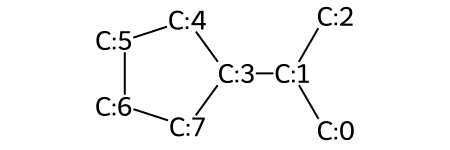

In [302]:
def second_078(mol):
    """CHcyc-CH"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H1;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_078_smiles1 = 'CC(C)C1CCCC1'
print(my_test(second_078_smiles1, second_078))
mol_with_atom_index(second_078_smiles1)

(1, ((4, 1),))


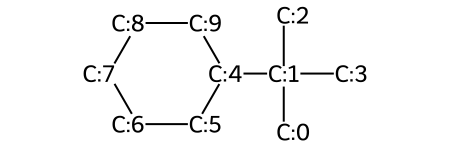

In [303]:
def second_079(mol):
    """CHcyc-C"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H0;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_079_smiles1 = 'CC(C)(C)C1CCCCC1'
print(my_test(second_079_smiles1, second_079))
mol_with_atom_index(second_079_smiles1)

(1, ((2, 1, 0),))


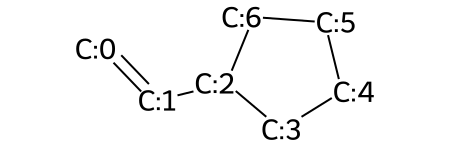

In [304]:
def second_080(mol):
    """CHcyc-CH=CHn   n=1,2"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H1;!R;D2]=[C;H1,H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_080_smiles1 = 'C=CC1CCCC1'
print(my_test(second_080_smiles1, second_080))
mol_with_atom_index(second_080_smiles1)

(1, ((3, 1, 0),))


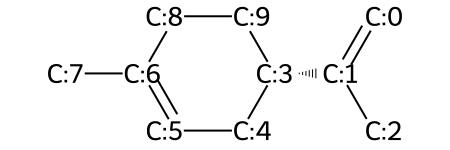

In [305]:
def second_081(mol):
    """CHcyc-C=CHn n=1,2"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H0;!R;D3]=[C;H1,H2;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_081_smiles1 = 'C=C(C)[C@@H]1CC=C(C)CC1'
print(my_test(second_081_smiles1, second_081))
mol_with_atom_index(second_081_smiles1)

(1, ((1, 0),))


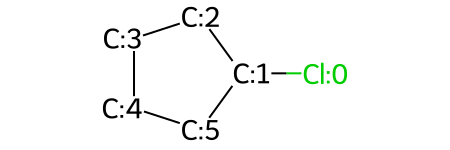

In [306]:
def second_082(mol):
    """CHcyc-Cl"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-Cl')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_082_smiles1 = 'ClC1CCCC1'
print(my_test(second_082_smiles1, second_082))
mol_with_atom_index(second_082_smiles1)

(1, ((1, 0),))


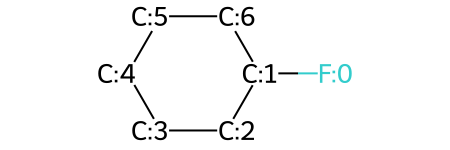

In [307]:
def second_083(mol):
    """CHcyc-F"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-F')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_083_smiles1 = 'FC1CCCCC1'
print(my_test(second_083_smiles1, second_083))
mol_with_atom_index(second_083_smiles1)

(1, ((1, 0),))


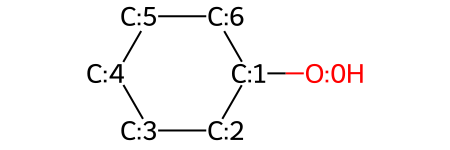

In [308]:
def second_084(mol):
    """CHcyc-OH"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_084_smiles1 = 'OC1CCCCC1'
print(my_test(second_084_smiles1, second_084))
mol_with_atom_index(second_084_smiles1)

(1, ((1, 0),))


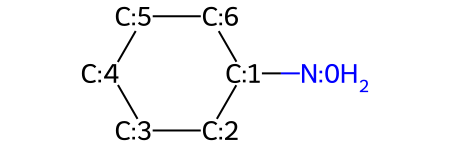

In [309]:
def second_085(mol):
    """CHcyc-NH2"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[N;H2;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_085_smiles1 = 'NC1CCCCC1'
print(my_test(second_085_smiles1, second_085))
mol_with_atom_index(second_085_smiles1)

(1, ((2, 1, 0),))


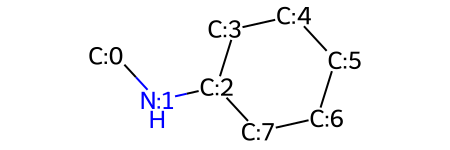

In [310]:
def second_086(mol):
    """CHcyc-NH-CHn   n=0,1,2,3"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[N;H1;!R;D2]-[C;H0,H1,H2,H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_086_smiles1 = 'CNC1CCCCC1'
print(my_test(second_086_smiles1, second_086))
mol_with_atom_index(second_086_smiles1)

(2, ((3, 1, 0), (3, 1, 2)))


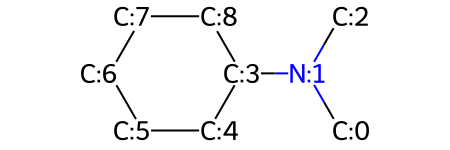

In [311]:
def second_087(mol):
    """CHcyc-N-CHn   n=0,1,2,3"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[N;H0;!R;D3]-[C;H0,H1,H2,H3;!R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_087_smiles1 = 'CN(C)C1CCCCC1'
print(my_test(second_087_smiles1, second_087))
mol_with_atom_index(second_087_smiles1)

(1, ((1, 0),))


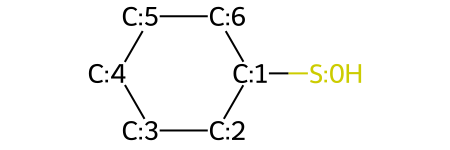

In [312]:
def second_088(mol):
    """CHcyc-SH"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[S;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_088_smiles1 = 'SC1CCCCC1'
print(my_test(second_088_smiles1, second_088))
mol_with_atom_index(second_088_smiles1)

(1, ((2, 1, 0),))


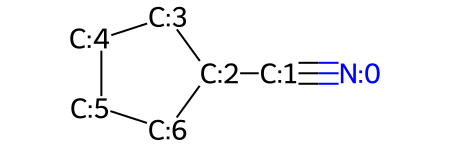

In [313]:
def second_089(mol):
    """CHcyc-CN"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[C;H0;!R;D2]#[N;H0;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_089_smiles1 = 'N#CC1CCCC1'
print(my_test(second_089_smiles1, second_089))
mol_with_atom_index(second_089_smiles1)

(1, ((3, 1, 0, 2),))


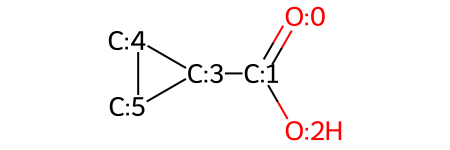

In [314]:
def second_090(mol):
    """CHcyc-COOH"""
    query = Chem.MolFromSmarts('[C;H1;R;D3](-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_090_smiles1 = 'O=C(O)C1CC1'
print(my_test(second_090_smiles1, second_090))
mol_with_atom_index(second_090_smiles1)

(1, ((3, 1, 2),))


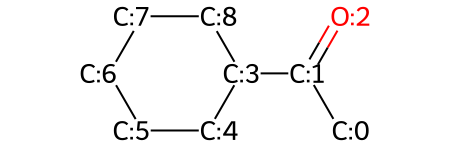

In [315]:
def second_091(mol):
    """CHcyc-CO-"""
    query = Chem.MolFromSmarts('[C;H1;R;D3][C;H0;!R;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_091_smiles1 = 'CC(=O)C1CCCCC1'
print(my_test(second_091_smiles1, second_091))
mol_with_atom_index(second_091_smiles1)

(1, ((3, 1, 2, 0),))


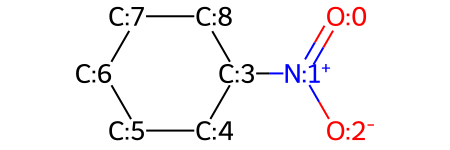

In [316]:
def second_092(mol):
    """CHcyc-NO2"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[N;+]([O;-])=[O]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_092_smiles1 = 'O=[N+]([O-])C1CCCCC1'
print(my_test(second_092_smiles1, second_092))
mol_with_atom_index(second_092_smiles1)

(1, ((2, 1),))


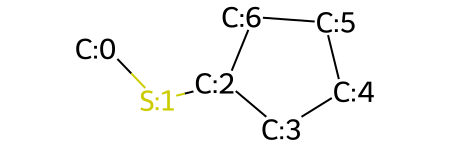

In [317]:
def second_093(mol):
    """CHcyc-S-"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[S;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_093_smiles1 = 'CSC1CCCC1'
print(my_test(second_093_smiles1, second_093))
mol_with_atom_index(second_093_smiles1)

(1, ((2, 1, 0),))


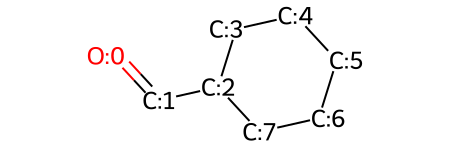

In [318]:
def second_094(mol):
    """CHcyc-CHO"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[C;H1;!R;D2](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_094_smiles1 = 'O=CC1CCCCC1'
print(my_test(second_094_smiles1, second_094))
mol_with_atom_index(second_094_smiles1)

(1, ((2, 1),))


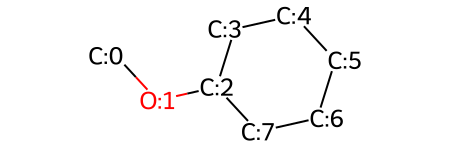

In [319]:
def second_095(mol):
    """CHcyc-O-"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-[O;H0;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_095_smiles1 = 'COC1CCCCC1'
print(my_test(second_095_smiles1, second_095))
mol_with_atom_index(second_095_smiles1)

(1, ((3, 2, 1, 0),))


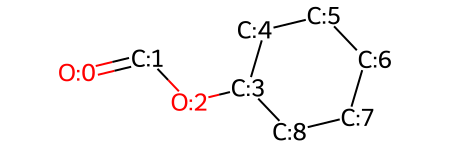

In [320]:
def second_096(mol):
    """CHcyc-OOCH"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]([O;H0;!R;D2][C;H1;!R;D2](=[O;H0;!R;D1]))')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_096_smiles1 = 'O=COC1CCCCC1'
print(my_test(second_096_smiles1, second_096))
mol_with_atom_index(second_096_smiles1)

(1, ((5, 3, 4, 2),))


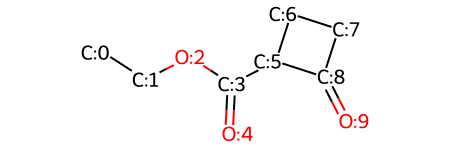

In [321]:
def second_097(mol):
    """CHcyc-COO"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]([C;H0;!R;D3](=[O;H0;!R;D1])[O;H0;!R;D2])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_097_smiles1 = 'CCOC(=O)C1CCC1=O'
print(my_test(second_097_smiles1, second_097))
mol_with_atom_index(second_097_smiles1)

(1, ((4, 3, 1, 2),))


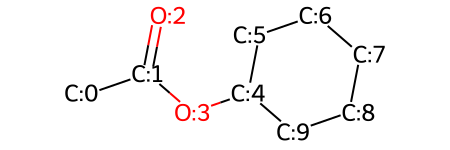

In [322]:
def second_098(mol):
    """CHcyc-OOC"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]([O;H0;!R;D2][C;H0;!R;D3](=[O;H0;!R;D1]))')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_098_smiles1 = 'CC(=O)OC1CCCCC1'
print(my_test(second_098_smiles1, second_098))
mol_with_atom_index(second_098_smiles1)

(2, ((1, 0), (1, 2)))


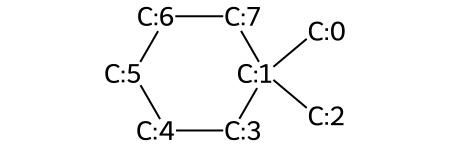

In [323]:
def second_099(mol):
    """Ccyc-CH3"""
    query = Chem.MolFromSmarts('[C;H0;R;D4][C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_099_smiles1 = 'CC1(C)CCCCC1'
print(my_test(second_099_smiles1, second_099))
mol_with_atom_index(second_099_smiles1)

(1, ((2, 1),))


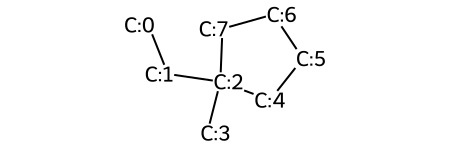

In [324]:
def second_100(mol):
    """Ccyc-CH2"""
    query = Chem.MolFromSmarts('[C;H0;R;D4][C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

second_100_smiles1 = 'CCC1(C)CCCC1'
print(my_test(second_100_smiles1, second_100))
mol_with_atom_index(second_100_smiles1)

(1, ((1, 2),))


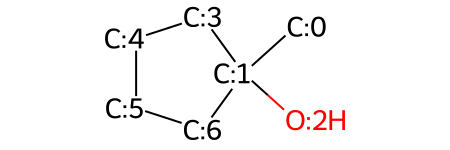

In [325]:
def second_101(mol):
    """Ccyc-OH"""
    query = Chem.MolFromSmarts('[C;H0;R;D4][O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_101_smiles1 = 'CC1(O)CCCC1'
print(my_test(second_101_smiles1, second_101))
mol_with_atom_index(second_101_smiles1)

(1, ((1, 0),))


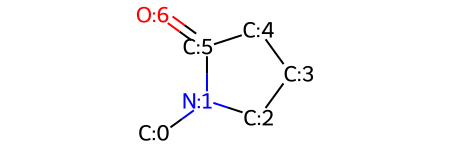

In [326]:
def second_102(mol):
    """>Ncyc-CH3"""
    query = Chem.MolFromSmarts('[N,n;H0;D3;R]-[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_102_smiles1 = 'CN1CCCC1=O'
print(my_test(second_102_smiles1, second_102))
mol_with_atom_index(second_102_smiles1)

(1, ((2, 1),))


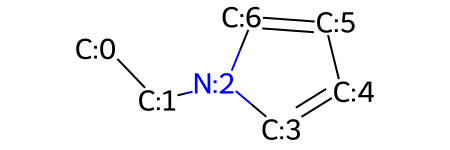

In [327]:
def second_103(mol):
    """>Ncyc-CH2"""
    query = Chem.MolFromSmarts('[N,n;H0;D3;R]-[C;H2;!R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_103_smiles1 = 'CCn1cccc1'
print(my_test(second_103_smiles1, second_103))
mol_with_atom_index(second_103_smiles1)

(1, ((1, 0, 6, 7, 5, 4, 3, 2),))


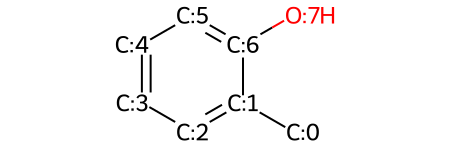

In [328]:
def second_104(mol):
    """AROMRINGs1s2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_104_smiles1 = 'Cc1ccccc1O'
print(my_test(second_104_smiles1, second_104))
mol_with_atom_index(second_104_smiles1)

(1, ((1, 0, 7, 5, 6, 4, 3, 2),))


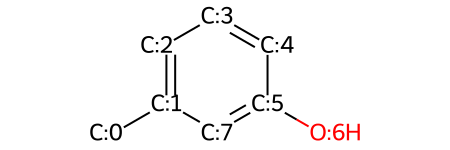

In [329]:
def second_105(mol):
    """AROMRINGs1s3"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_105_smiles1 = 'Cc1cccc(O)c1'
print(my_test(second_105_smiles1, second_105))
mol_with_atom_index(second_105_smiles1)

(1, ((1, 0, 2, 3, 4, 5, 6, 7),))


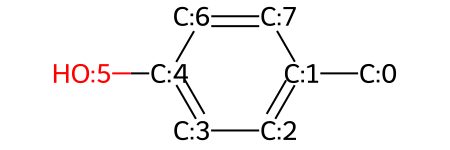

In [330]:
def second_106(mol):
    """AROMRINGs1s4"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_106_smiles1 = 'Cc1ccc(O)cc1'
print(my_test(second_106_smiles1, second_106))
mol_with_atom_index(second_106_smiles1)

(1, ((1, 0, 7, 8, 5, 6, 4, 3, 2),))


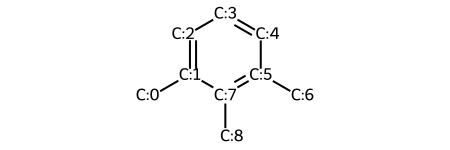

In [331]:
def second_107(mol):
    """AROMRINGs1s2s3"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_107_smiles1 = 'Cc1cccc(C)c1C'
print(my_test(second_107_smiles1, second_107))
mol_with_atom_index(second_107_smiles1)

(1, ((4, 5, 6, 7, 8, 1, 0, 2, 3),))


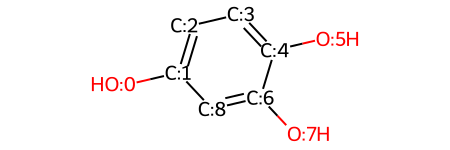

In [332]:
def second_108(mol):
    """AROMRINGs1s2s4"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_108_smiles1 = 'Oc1ccc(O)c(O)c1'
print(my_test(second_108_smiles1, second_108))
mol_with_atom_index(second_108_smiles1)

(1, ((2, 1, 3, 4, 5, 6, 7, 8, 10),))


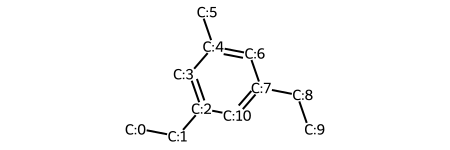

In [333]:
def second_109(mol):
    """AROMRINGs1s3s5"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_109_smiles1 = 'CCc1cc(C)cc(CC)c1'
print(my_test(second_109_smiles1, second_109))
mol_with_atom_index(second_109_smiles1)

(1, ((3, 4, 2, 1, 9, 10, 7, 8, 6, 5),))


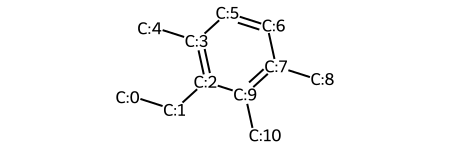

In [334]:
def second_110(mol):
    """AROMRINGs1s2s3s4"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_110_smiles1 = 'CCc1c(C)ccc(C)c1C'
print(my_test(second_110_smiles1, second_110))
mol_with_atom_index(second_110_smiles1)

(1, ((3, 4, 5, 6, 7, 8, 9, 1, 0, 2),))


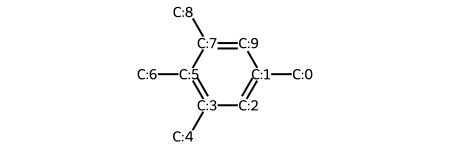

In [335]:
def second_111(mol):
    """AROMRINGs1s2s3s5"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_111_smiles1 = 'Cc1cc(C)c(C)c(C)c1'
print(my_test(second_111_smiles1, second_111))
mol_with_atom_index(second_111_smiles1)

(1, ((1, 0, 8, 9, 7, 5, 6, 3, 4, 2),))


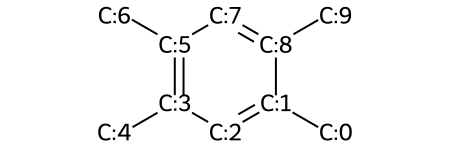

In [336]:
def second_112(mol):
    """AROMRINGs1s2s4s5"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_112_smiles1 = 'Cc1cc(C)c(C)cc1C'
print(my_test(second_112_smiles1, second_112))
mol_with_atom_index(second_112_smiles1)

(1, ((6, 1, 0, 2, 3, 4, 5),))


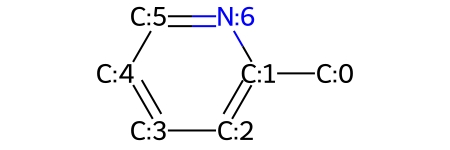

In [337]:
def second_113(mol):
    """PYRIDINEs2"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_113_smiles1 = 'Cc1ccccn1'
print(my_test(second_113_smiles1, second_113))
mol_with_atom_index(second_113_smiles1)

(1, ((5, 6, 1, 0, 2, 3, 4),))


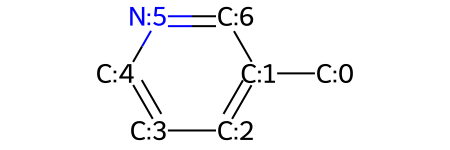

In [338]:
def second_114(mol):
    """PYRIDINEs3"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_114_smiles1 = 'Cc1cccnc1'
print(my_test(second_114_smiles1, second_114))
mol_with_atom_index(second_114_smiles1)

(1, ((4, 3, 2, 1, 0, 6, 5),))


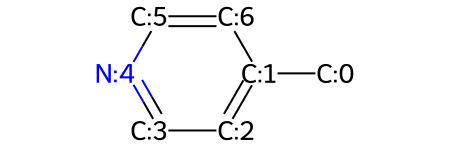

In [339]:
def second_115(mol):
    """PYRIDINEs4"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H1;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_115_smiles1 = 'Cc1ccncc1'
print(my_test(second_115_smiles1, second_115))
mol_with_atom_index(second_115_smiles1)

(1, ((5, 6, 7, 1, 0, 2, 3, 4),))


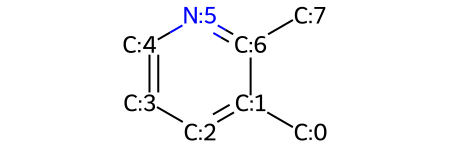

In [340]:
def second_116(mol):
    """PYRIDINEs2s3"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_116_smiles1 = 'Cc1cccnc1C'
print(my_test(second_116_smiles1, second_116))
mol_with_atom_index(second_116_smiles1)

(1, ((4, 5, 6, 7, 1, 0, 2, 3),))


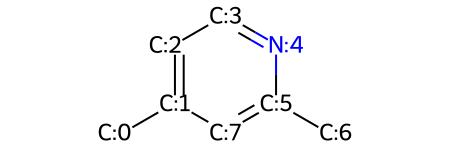

In [341]:
def second_117(mol):
    """PYRIDINEs2s4"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_117_smiles1 = 'Cc1ccnc(C)c1'
print(my_test(second_117_smiles1, second_117))
mol_with_atom_index(second_117_smiles1)

(1, ((6, 4, 5, 3, 2, 1, 0, 7),))


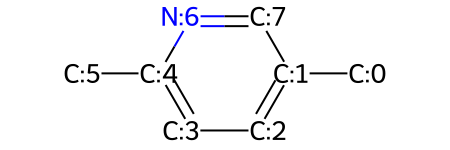

In [342]:
def second_118(mol):
    """PYRIDINEs2s5"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_118_smiles1 = 'Cc1ccc(C)nc1'
print(my_test(second_118_smiles1, second_118))
mol_with_atom_index(second_118_smiles1)

(1, ((7, 5, 6, 4, 3, 2, 1, 0),))


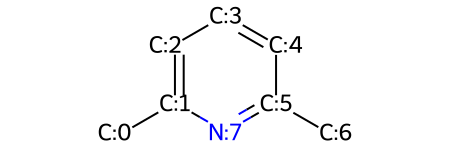

In [343]:
def second_119(mol):
    """PYRIDINEs2s6"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_119_smiles1 = 'Cc1cccc(C)n1'
print(my_test(second_119_smiles1, second_119))
mol_with_atom_index(second_119_smiles1)

(1, ((4, 5, 6, 7, 1, 0, 2, 3),))


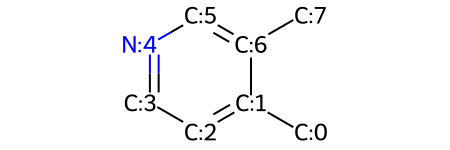

In [344]:
def second_120(mol):
    """PYRIDINEs3s4"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_120_smiles1 = 'Cc1ccncc1C'
print(my_test(second_120_smiles1, second_120))
mol_with_atom_index(second_120_smiles1)

(1, ((3, 2, 1, 0, 7, 5, 6, 4),))


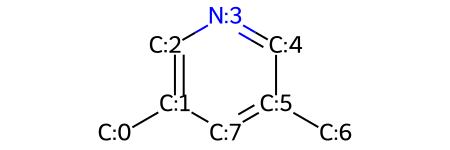

In [345]:
def second_121(mol):
    """PYRIDINEs3s5"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_121_smiles1 = 'Cc1cncc(C)c1'
print(my_test(second_121_smiles1, second_121))
mol_with_atom_index(second_121_smiles1)

(1, ((8, 6, 7, 4, 5, 3, 2, 1, 0),))


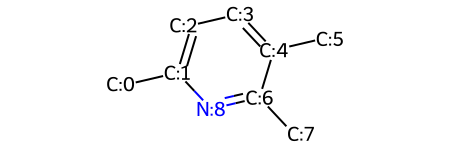

In [346]:
def second_122(mol):
    """PYRIDINEs2s3s6"""
    query = Chem.MolFromSmarts('[n;H0;R;D2][c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2][c;H1;R;D2][c;H0;R;D3]([!a;!R])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_122_smiles1 = 'Cc1ccc(C)c(C)n1'
print(my_test(second_122_smiles1, second_122))
mol_with_atom_index(second_122_smiles1)

(1, ((4, 3, 1, 0, 2),))


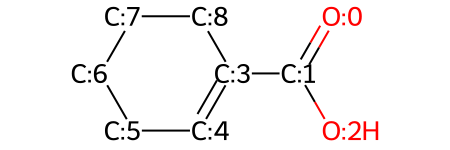

In [347]:
def second_123(mol):
    """(CHn=CHm)cyc-COOH"""
    query = Chem.MolFromSmarts('[C;R]@&=[C;R]!@&-[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H1;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_123_smiles1 = 'O=C(O)C1=CCCCC1'
print(my_test(second_123_smiles1, second_123))
mol_with_atom_index(second_123_smiles1)

(1, ((1, 0, 9, 10, 7, 8, 5, 6, 3, 4, 2),))


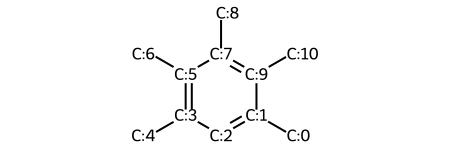

In [348]:
def second_124(mol):
    """AROMRINGs1s2s3s4s5"""
    #query = Chem.MolFromSmarts('[c]1[c](!@&-[*])[c](!@&-[*])[c](!@&-[*])[c](!@&-[*])[c]1(!@&-[*])')
    query = Chem.MolFromSmarts('[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H0;R;D3]([!a;!R])[c;H1;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_124_smiles1 = 'Cc1cc(C)c(C)c(C)c1C'
print(my_test(second_124_smiles1, second_124))
mol_with_atom_index(second_124_smiles1)

(1, ((5, 4, 2, 3, 1, 0),))


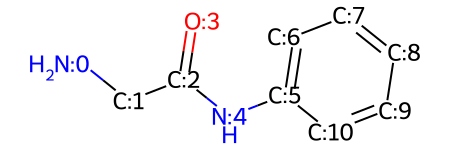

In [349]:
def second_125(mol):
    """aC-NHCOCH2N"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[N;H1]-[C;H0](=[O;H0;D1])[C;H2][N]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_125_smiles1 = 'NCC(=O)Nc1ccccc1'
print(my_test(second_125_smiles1, second_125))
mol_with_atom_index(second_125_smiles1)

(1, ((2, 1, 0),))


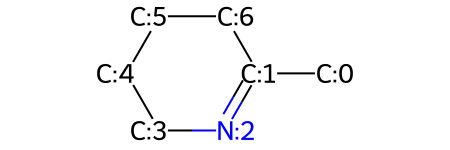

In [350]:
def second_126(mol):
    """(N=C)cyc-CH3"""
    query = Chem.MolFromSmarts('[N;R]@&=[C;R]!@&-[C;H3;!R;D1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_126_smiles1 = 'CC1=NCCCC1'
print(my_test(second_126_smiles1, second_126))
mol_with_atom_index(second_126_smiles1)

(1, ((6, 4, 5, 3, 2, 1, 0),))


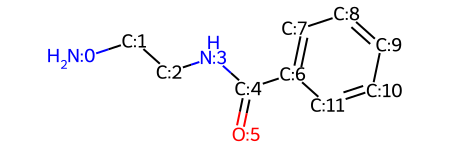

In [351]:
def second_127(mol):
    """aC-CONH(CH2)2N"""
    query = Chem.MolFromSmarts('[c]!@&-[C](=[O;H0;D1])[N;H1][C;H2][C;H2][N]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_127_smiles1 = 'NCCNC(=O)c1ccccc1'
print(my_test(second_127_smiles1, second_127))
mol_with_atom_index(second_127_smiles1)

(1, ((4, 1, 2, 3, 0),))


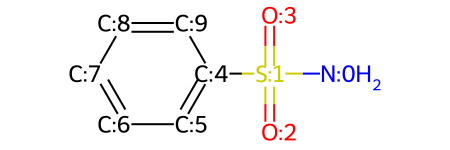

In [352]:
def second_128(mol):  # todo 原文128、129、130完全一样，不知道怎么回事
    """aC-SO2NHn   n=0,1,2"""
    query = Chem.MolFromSmarts('[c]!@&-[S](=[O;H0;D1])(=[O;H0;D1])[N;H0,H1,H2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_128_smiles1 = 'NS(=O)(=O)c1ccccc1'
print(my_test(second_128_smiles1, second_128))
mol_with_atom_index(second_128_smiles1)

(1, ((4, 1, 2, 3, 0),))


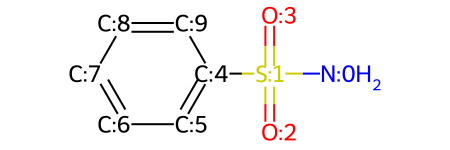

In [353]:
def second_129(mol):  # todo 原文128、129、130完全一样，不知道怎么回事
    """aC-SO2NHn   n=0,1,2"""
    query = Chem.MolFromSmarts('[c]!@&-[S](=[O;H0;D1])(=[O;H0;D1])[N;H0,H1,H2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_129_smiles1 = 'NS(=O)(=O)c1ccccc1'
print(my_test(second_129_smiles1, second_129))
mol_with_atom_index(second_129_smiles1)

(1, ((4, 1, 2, 3, 0),))


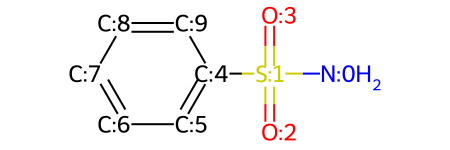

In [354]:
def second_130(mol):  # todo 原文128、129、130完全一样，不知道怎么回事
    """aC-SO2NHn   n=0,1,2"""
    query = Chem.MolFromSmarts('[c]!@&-[S](=[O;H0;D1])(=[O;H0;D1])[N;H0,H1,H2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


second_130_smiles1 = 'NS(=O)(=O)c1ccccc1'
print(my_test(second_130_smiles1, second_130))
mol_with_atom_index(second_130_smiles1)

(1, ((1, 0, 2, 3, 4, 5, 6, 7, 8),))


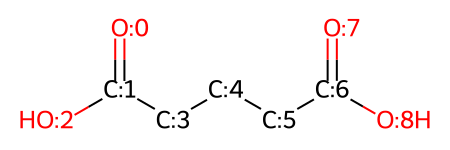

In [355]:
def third_001(mol):
    """HOOC-(CHn)m-COOH   m>2,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[C;H0;!R;D3](=[O;H0;!R;D1])(-[O;H1;!R;D1]){}-[C;H0;!R;D3](=[O;H0;!R;D1])(-[O;H1;!R;D1])'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_001_smiles1 = 'O=C(O)CCCC(=O)O'
print(my_test(third_001_smiles1, third_001))
mol_with_atom_index(third_001_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6),))


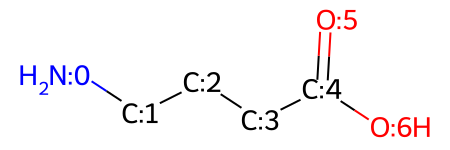

In [356]:
def third_002(mol):
    """NHn-(CHn)m-COOH   m>2,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[N;H0,H1,H2;!R]{}-[C;H0;!R;D3](=[O;H0;!R;D1])(-[O;H1;!R;D1])'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_002_smiles1 = 'NCCCC(=O)O'
print(my_test(third_002_smiles1, third_002))
mol_with_atom_index(third_002_smiles1)

(1, ((0, 1, 2, 3, 4, 5),))


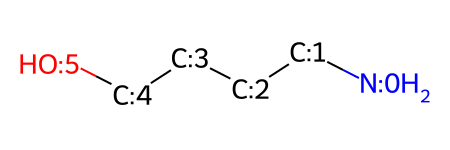

In [357]:
def third_003(mol):
    """NH2-(CHn)m-OH   m>2,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[N;H2;!R;D1]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_003_smiles1 = 'NCCCCO'
print(my_test(third_003_smiles1, third_003))
mol_with_atom_index(third_003_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10),))


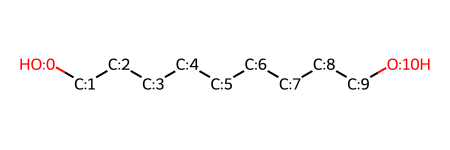

In [358]:
def third_004(mol):
    """OH-(CHn)m-OH   m>2,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[O;H1;!R;D1]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_004_smiles1 = 'OCCCCCCCCCO'
print(my_test(third_004_smiles1, third_004))
mol_with_atom_index(third_004_smiles1)

(1, ((2, 1, 3, 4, 5, 6, 8),))


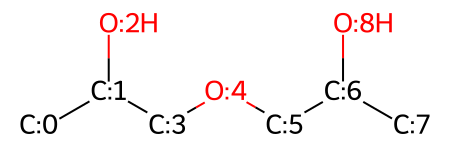

In [359]:
def third_005(mol):
    """OH-(CHp)k-O-(CHn)m-OH   m,k>0;p,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms)+1):
        for j in range(1, len(not_in_ring_atoms)+1):
            query = Chem.MolFromSmarts('[O;H1;!R;D1]{}-[O;H0;D2;!R]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i, '-[C;H0,H1,H2;!R]'*j))
            match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_005_smiles1 = 'CC(O)COCC(C)O'
print(my_test(third_005_smiles1, third_005))
mol_with_atom_index(third_005_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6),))


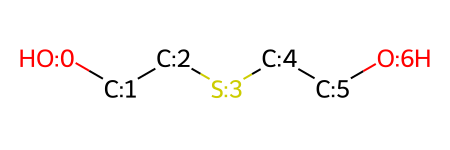

In [360]:
def third_006(mol):
    """OH-(CHp)k-S-(CHn)m-OH   m,k>0;p,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms)+1):
        for j in range(1, len(not_in_ring_atoms)+1):
            query = Chem.MolFromSmarts('[O;H1;!R;D1]{}-[S;H0;D2;!R]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i, '-[C;H0,H1,H2;!R]'*j))
            match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_006_smiles1 = 'OCCSCCO'
print(my_test(third_006_smiles1, third_006))
mol_with_atom_index(third_006_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6),))


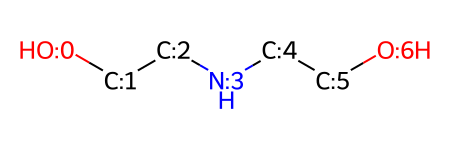

In [361]:
def third_007(mol):
    """OH-(CHp)k-NHx-(CHn)m-OH   m,k>0;x,p,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms)+1):
        for j in range(1, len(not_in_ring_atoms)+1):
            query = Chem.MolFromSmarts('[O;H1;!R;D1]{}-[N;H0,H1,H2;!R]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i, '-[C;H0,H1,H2;!R]'*j))
            match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_007_smiles1 = 'OCCNCCO'
print(my_test(third_007_smiles1, third_007))
mol_with_atom_index(third_007_smiles1)

(1, ((3, 4, 5, 6, 7, 8),))


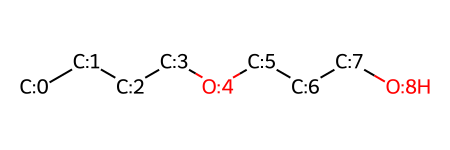

In [362]:
def third_008(mol):
    """CHp-O-(CHn)m-OH   m>2;p,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[C;H0,H1,H2;!R][O;H0;!R;D2]{}-[O;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_008_smiles1 = 'CCCCOCCCO'
print(my_test(third_008_smiles1, third_008))
mol_with_atom_index(third_008_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6),))


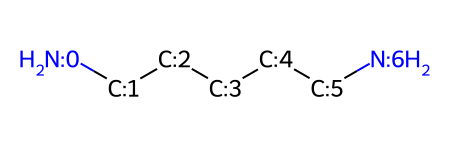

In [363]:
def third_009(mol):
    """NH2-(CHn)m-NH2   m>2,n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[N;H2;!R;D1]{}-[N;H2;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_009_smiles1 = 'NCCCCCN'
print(my_test(third_009_smiles1, third_009))
mol_with_atom_index(third_009_smiles1)

(1, ((1, 3, 4, 5, 6),))


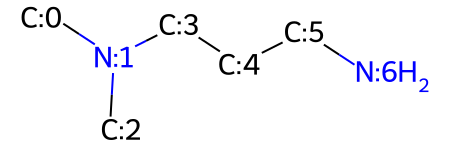

In [364]:
def third_010(mol):
    """NHk-(CHn)m-NH2   m>2;n=0,1,2;k=0,1"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[N;H0,H1;!R]{}-[N;H2;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_010_smiles1 = 'CN(C)CCCN'
print(my_test(third_010_smiles1, third_010))
mol_with_atom_index(third_010_smiles1)

(1, ((0, 1, 2, 3, 4, 5, 6),))


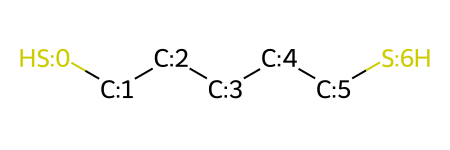

In [365]:
def third_011(mol):
    """SH-(CHn)m-SH   m>2;n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[S;H1;!R;D1]{}-[S;H1;!R;D1]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_011_smiles1 = 'SCCCCCS'
print(my_test(third_011_smiles1, third_011))
mol_with_atom_index(third_011_smiles1)

(1, ((1, 0, 2, 3, 4, 5, 6),))


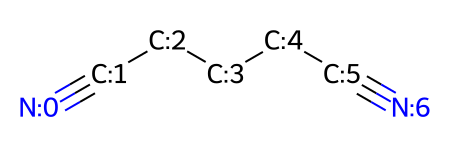

In [366]:
def third_012(mol):
    """CN-(CHn)m-CN   m>2;n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[C;H0;!R;D2](#[N;H0;!R;D1]){}-[C;H0;!R;D2](#[N;H0;!R;D1])'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_012_smiles1 = 'N#CCCCC#N'
print(my_test(third_012_smiles1, third_012))
mol_with_atom_index(third_012_smiles1)

(1, ((11, 12, 13, 14, 15, 16, 17, 18, 19),))


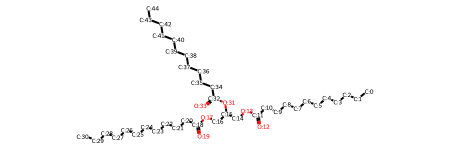

In [367]:
def third_013(mol):
    """COO-(CHn)m-OOC   m>2;n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(3, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[C;H0;!R;D3](=[O;H0;!R;D1])-[O;H0;!R;D2]{}-[O;H0;!R;D2]-[C;H0;!R;D3](=[O;H0;!R;D1])'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_013_smiles1 = 'CCCCCCCCCCCC(=O)OCC(COC(=O)CCCCCCCCCCC)OC(=O)CCCCCCCCCCC'
print(my_test(third_013_smiles1, third_013))
mol_with_atom_index(third_013_smiles1)

(1, ((2, 1, 0),))


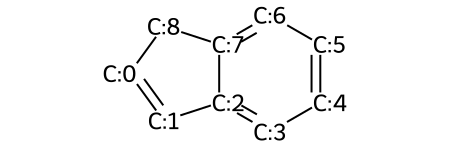

In [368]:
def third_014(mol):
    """aC-(CHn=CHm)cyc (fused rings)   m,n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@&-[C;H1,H2;R]@&=[C;H1,H2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_014_smiles1 = 'C1=Cc2ccccc2C1'
print(my_test(third_014_smiles1, third_014))
mol_with_atom_index(third_014_smiles1)

(1, ((3, 4),))


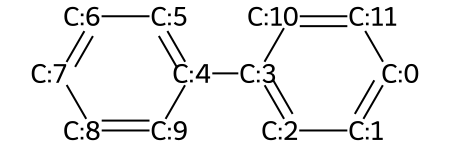

In [369]:
def third_015(mol):
    """aC-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]!@&-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_015_smiles1 = 'c1ccc(-c2ccccc2)cc1'
print(my_test(third_015_smiles1, third_015))
mol_with_atom_index(third_015_smiles1)

(1, ((3, 4),))


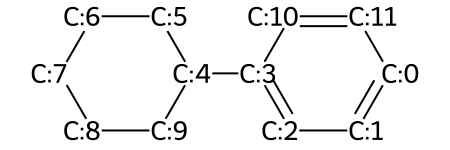

In [370]:
def third_016(mol):
    """aC-CHncyc (different rings)   n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]!@&-[C;H0,H1;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_016_smiles1 = 'c1ccc(C2CCCCC2)cc1'
print(my_test(third_016_smiles1, third_016))
mol_with_atom_index(third_016_smiles1)

(2, ((3, 9), (4, 6)))


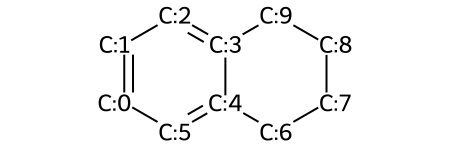

In [371]:
def third_017(mol):
    """aC-CHncyc (fused rings)   n=0,1,2原文写的0,1应该是不对的"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@&-[C;H0,H1,H2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_017_smiles1 = 'c1ccc2c(c1)CCCC2'
print(my_test(third_017_smiles1, third_017))
mol_with_atom_index(third_017_smiles1)

(1, ((3, 4, 5, 6),))


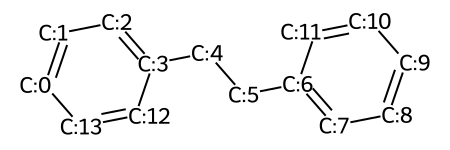

In [372]:
def third_018(mol):
    """aC-(CHn)m-aC m>1 n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(2, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[c;H0;R;D3]{}-[c;H0;R;D3]'.format('-[C;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_018_smiles1 = 'c1ccc(CCc2ccccc2)cc1'
print(my_test(third_018_smiles1, third_018))
mol_with_atom_index(third_018_smiles1)

(1, ((3, 4, 5, 6, 7),))


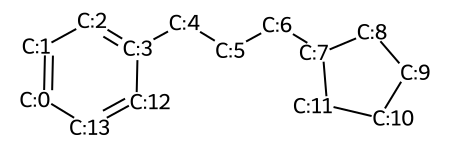

In [373]:
def third_019(mol):
    """aC-(CHn)m-CHcyc m>1 n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[c;H0;R;D3]{}-[C;H1;R;D3]'.format('-[C;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_019_smiles1 = 'c1ccc(CCCC2CCCC2)cc1'
print(my_test(third_019_smiles1, third_019))
mol_with_atom_index(third_019_smiles1)

(1, ((3, 4),))


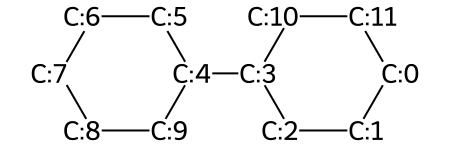

In [374]:
def third_020(mol):
    """CHcyc-CHcyc (different rings)"""
    query = Chem.MolFromSmarts('[C;H1;R;D3]-&!@[C;H1;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

third_020_smiles1 = 'C1CCC(C2CCCCC2)CC1'
print(my_test(third_020_smiles1, third_020))
mol_with_atom_index(third_020_smiles1)

(1, ((3, 4, 5, 6),))


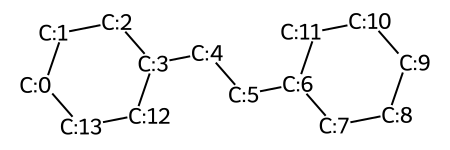

In [375]:
def third_021(mol):
    """CHcyc-(CHn)m-CHcyc (different rings)   m>0, n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms) + 1):
        query = Chem.MolFromSmarts('[C;H1;R;D3]{}!@&-[C;H1;R;D3]'.format('!@&-[C;H0,H1,H2;!R]' * i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list

third_021_smiles1 = 'C1CCC(CCC2CCCCC2)CC1'
print(my_test(third_021_smiles1, third_021))
mol_with_atom_index(third_021_smiles1)

(2, ((3,), (7,)))


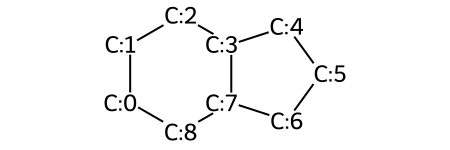

In [376]:
def third_022(mol):
    """CH multiring"""
    query = Chem.MolFromSmarts('[C;H1;!R1&R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

third_022_smiles1 = 'C1CCC2CCCC2C1'
print(my_test(third_022_smiles1, third_022))
mol_with_atom_index(third_022_smiles1)

(1, ((2,),))


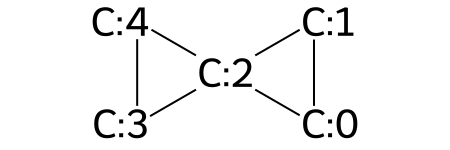

In [377]:
def third_023(mol):
    """C multiring"""
    query = Chem.MolFromSmarts('[C;H0;!R1&R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list

third_023_smiles1 = 'C1CC12CC2'
print(my_test(third_023_smiles1, third_023))
mol_with_atom_index(third_023_smiles1)

(1, ((3, 4, 5),))


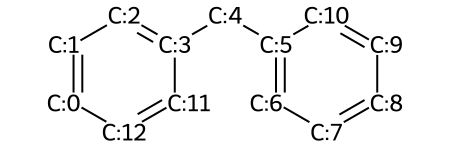

In [378]:
def third_024(mol):
    """aC-CHm-aC (different rings)   m=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R1]-[C;H0,H1,H2;!R]-[c;H0;R1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_024_smiles1 = 'c1ccc(Cc2ccccc2)cc1'
print(my_test(third_024_smiles1, third_024))
mol_with_atom_index(third_024_smiles1)

(1, ((2, 1, 0, 8),))


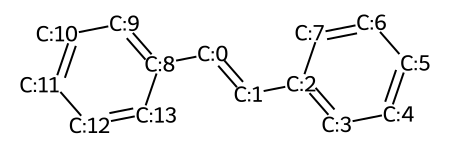

In [379]:
def third_025(mol):
    """aC-(CHm=CHn)-aC (different rings)   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]-[C;H0,H1,H2;!R]=[C;H0,H1,H2;!R]-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_025_smiles1 = 'C(=C/c1ccccc1)\c1ccccc1'
print(my_test(third_025_smiles1, third_025))
mol_with_atom_index(third_025_smiles1)

(0, ())


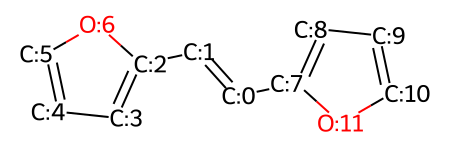

In [380]:
def third_026(mol):
    """(CHm=C)cyc-CH=CH-(C=CHn)cyc (different rings)   m,n没有限制"""
    query = Chem.MolFromSmarts('[C;R]=[C;H0;R]-[C;H1;!R]=[C;H1;!R]-[C;H0;R]=[C;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_026_smiles1 = 'C(=C/c1ccco1)\c1ccco1'
print(my_test(third_026_smiles1, third_026))
mol_with_atom_index(third_026_smiles1)

(0, ())


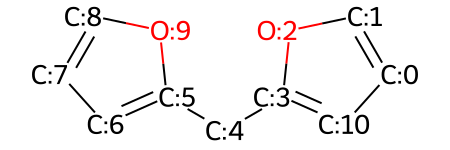

In [381]:
def third_027(mol):
    """(CHm=C)cyc-CHp-(C=CHn)cyc (different rings)   m,n,p没有限制"""
    query = Chem.MolFromSmarts('[C;R]=[C;H0;R]-[C;!R]-[C;H0;R]=[C;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_027_smiles1 = 'c1coc(Cc2ccco2)c1'
print(my_test(third_027_smiles1, third_027))
mol_with_atom_index(third_027_smiles1)

(1, ((2, 1, 0, 8),))


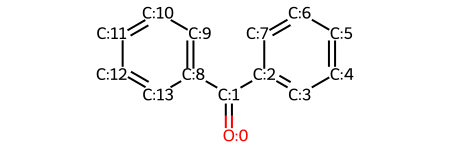

In [382]:
def third_028(mol):
    """aC-CO-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_028_smiles1 = 'O=C(c1ccccc1)c1ccccc1'
print(my_test(third_028_smiles1, third_028))
mol_with_atom_index(third_028_smiles1)

(1, ((3, 2, 1, 0, 9),))


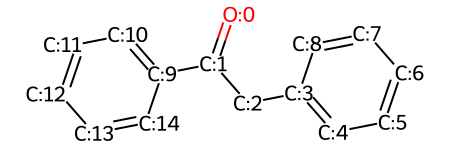

In [383]:
def third_029(mol):
    """aC-CHm-CO-aC (different rings)   m=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0,H1,H2;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_029_smiles1 = 'O=C(Cc1ccccc1)c1ccccc1'
print(my_test(third_029_smiles1, third_029))
mol_with_atom_index(third_029_smiles1)

(1, ((7, 1, 0, 2, 3),))


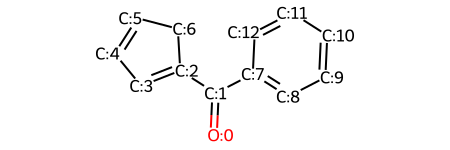

In [384]:
def third_030(mol):
    """aC-CO-(C=CHn)cyc (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H0;R;D3]=[C;H0,H1;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_030_smiles1 = 'O=C(c1ccccc1)c1ccco1'
third_030_smiles1 = 'O=C(C1=CC=CC1)c1ccccc1'
print(my_test(third_030_smiles1, third_030))
mol_with_atom_index(third_030_smiles1)

(1, ((4, 2, 3, 1, 0, 10),))


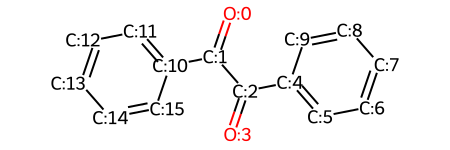

In [385]:
def third_031(mol):
    """aC-CO-CO-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H0;!R;D3](=[O;H0;!R;D1])-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_031_smiles1 = 'O=C(C(=O)c1ccccc1)c1ccccc1'
print(my_test(third_031_smiles1, third_031))
mol_with_atom_index(third_031_smiles1)

(1, ((23, 1, 0),))


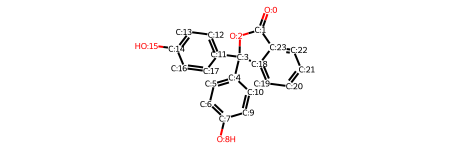

In [386]:
def third_032(mol):
    """aC-COcyc (fused rings)"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@&-[C;R;H0;D3](=[O;H0;!R;D1])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_032_smiles1 = 'O=C1OC(c2ccc(O)cc2)(c2ccc(O)cc2)c2ccccc21'
print(my_test(third_032_smiles1, third_032))
mol_with_atom_index(third_032_smiles1)

(1, ((6, 4, 5, 3, 2, 1, 0, 12),))


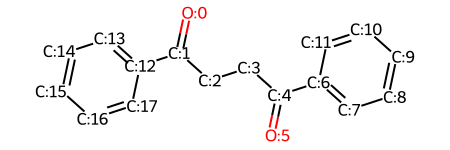

In [387]:
def third_033(mol):
    """aC-CO-(CHn)m-CO-aC (different rings)   m>0;n=0,1,2"""
    not_in_ring_atoms = [atom for atom in mol.GetAtoms() if not atom.IsInRing()]
    match_list = ()
    for i in range(1, len(not_in_ring_atoms)+1):
        query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1]){}-[C;H0;!R;D3](=[O;H0;!R;D1])-[c;H0;R;D3]'.format('-[C;H0,H1,H2;!R]'*i))
        match_list += mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_033_smiles1 = 'O=C(CCC(=O)c1ccccc1)c1ccccc1'
print(my_test(third_033_smiles1, third_033))
mol_with_atom_index(third_033_smiles1)

(1, ((2, 1, 0, 8),))


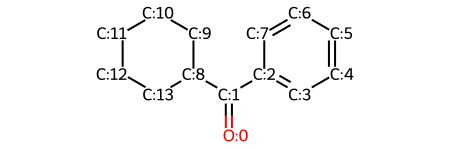

In [388]:
def third_034(mol):
    """aC-CO-CHn,cyc (different rings)   n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[C;H0,H1;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_034_smiles1 = 'O=C(c1ccccc1)C1CCCCC1'
print(my_test(third_034_smiles1, third_034))
mol_with_atom_index(third_034_smiles1)

(1, ((9, 1, 0, 2, 3),))


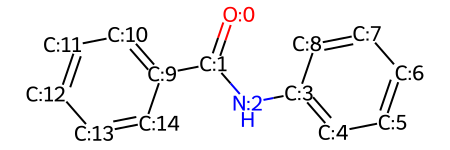

In [389]:
def third_035(mol):
    """aC-CO-NHn-aC (different rings)   n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H0,H1;!R]-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_035_smiles1 = 'O=C(Nc1ccccc1)c1ccccc1'
print(my_test(third_035_smiles1, third_035))
mol_with_atom_index(third_035_smiles1)

(1, ((3, 2, 1, 0, 9, 10),))


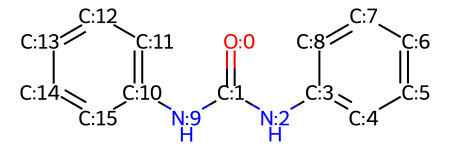

In [390]:
def third_036(mol):
    """aC-NHnCONHm-aC (different rings)   m,n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H0,H1;!R]-[C;H0;!R;D3](=[O;H0;!R;D1])-[N;H0,H1;!R]-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_036_smiles1 = 'O=C(Nc1ccccc1)Nc1ccccc1'
print(my_test(third_036_smiles1, third_036))
mol_with_atom_index(third_036_smiles1)

(1, ((2, 1, 0, 8),))


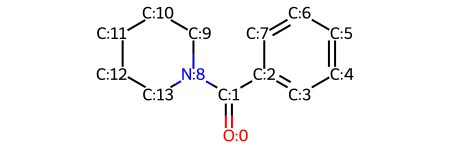

In [391]:
def third_037(mol):
    """aC-CO-Ncyc (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[C;H0;!R;D3](=[O;H0;!R;D1])!@&-[N;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_037_smiles1 = 'O=C(c1ccccc1)N1CCCCC1'
print(my_test(third_037_smiles1, third_037))
mol_with_atom_index(third_037_smiles1)

(2, ((4, 6), (7, 6)))


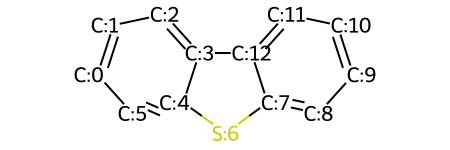

In [392]:
def third_038(mol):
    """aC-Scyc (fused rings)"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@[S,s;H0;D2;R1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_038_smiles1 = 'c1ccc2c(c1)sc1ccccc12'
print(my_test(third_038_smiles1, third_038))
mol_with_atom_index(third_038_smiles1)

(1, ((3, 4, 5),))


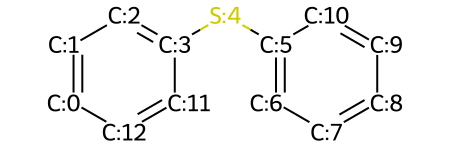

In [393]:
def third_039(mol):
    """aC-S-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R1;D3]!@&-[S;H0;D2;!R]!@&-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_039_smiles1 = 'c1ccc(Sc2ccccc2)cc1'
print(my_test(third_039_smiles1, third_039))
mol_with_atom_index(third_039_smiles1)

(3, ((3, 2, 1, 9, 10), (3, 2, 1, 16, 17), (10, 9, 1, 16, 17)))


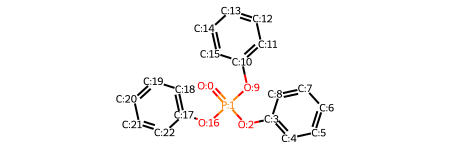

In [394]:
def third_040(mol):
    """aC-POn-aC (different rings)   n=0,1,2,3,4"""
    query0 = Chem.MolFromSmarts('[c;H0;R1;D3]-[P;H0,H1;!R]-[c;H0;R1;D3]')
    query1 = Chem.MolFromSmarts('[c;H0;R1;D3]-[O;H0;D2;!R]-[P;!R]-[O;H0;D2;!R]-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query0) + mol.GetSubstructMatches(query1)
    return len(match_list), match_list


third_040_smiles1 = 'O=P(Oc1ccccc1)(Oc1ccccc1)Oc1ccccc1'
print(my_test(third_040_smiles1, third_040))
mol_with_atom_index(third_040_smiles1)

(1, ((3, 1, 0, 2, 9),))


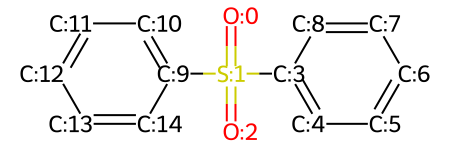

In [395]:
def third_041(mol):
    """aC-SOn-aC (different rings)   n=1,2,3,4"""
    query1 = Chem.MolFromSmarts('[c;H0;R1;D3]-[S;H0;D3;!R](=[O;!R;H0;D1])-[c;H0;R1;D3]')
    query2 = Chem.MolFromSmarts('[c;H0;R1;D3]-[S;H0;D4;!R](=[O;!R;H0;D1])(=[O;!R;H0;D1])-[c;H0;R1;D3]')
    query3 = Chem.MolFromSmarts('[c;H0;R1;D3]-[O;H0;D2;!R]-[S;H0;D3;!R](=[O;!R;H0;D1])-[O;H0;D2;!R]-[c;H0;R1;D3]')
    query4 = Chem.MolFromSmarts('[c;H0;R1;D3]-[O;H0;D2;!R]-[S;H0;D4;!R](=[O;!R;H0;D1])(=[O;!R;H0;D1])-[O;H0;D2;!R]-[c;H0;R1;D3]')
    match_list = mol.GetSubstructMatches(query1) + mol.GetSubstructMatches(query2) + mol.GetSubstructMatches(query3) + mol.GetSubstructMatches(query4)
    return len(match_list), match_list


third_041_smiles1 = 'O=S(=O)(c1ccccc1)c1ccccc1'
print(my_test(third_041_smiles1, third_041))
mol_with_atom_index(third_041_smiles1)

(2, ((4, 6), (7, 6)))


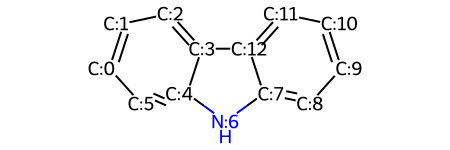

In [396]:
def third_042(mol):
    """aC-NHncyc (fused rings)   n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@[N,n;H0,H1;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_042_smiles1 = 'c1ccc2c(c1)[nH]c1ccccc12'
print(my_test(third_042_smiles1, third_042))
mol_with_atom_index(third_042_smiles1)

(1, ((3, 4, 5),))


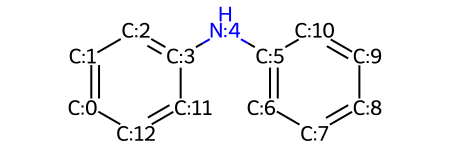

In [397]:
def third_043(mol):
    """aC-NH-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[N;H1;!R;D2]-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_043_smiles1 = 'c1ccc(Nc2ccccc2)cc1'
print(my_test(third_043_smiles1, third_043))
mol_with_atom_index(third_043_smiles1)

(1, ((3, 4, 8),))


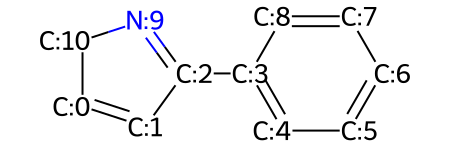

In [398]:
def third_044(mol):  # todo 芳香性
    """aC-(C=N)cyc (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[c,C;H0;R;D3]=,:[n,N;H0;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_044_smiles1 = 'c1ccc(-c2cc[nH]n2)cc1'
third_044_smiles2 = 'C1=CC(c2ccccc2)=NC1'
print(my_test(third_044_smiles1, third_044))
mol_with_atom_index(third_044_smiles2)

(1, ((7, 6, 5),))


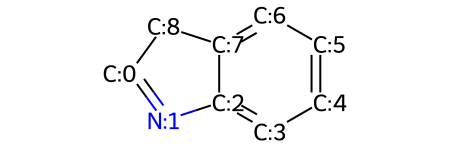

In [399]:
def third_045(mol):  # todo 芳香性
    """aC-(N=CHn)cyc (fused rings)   n=0,1"""
    # query = Chem.MolFromSmarts('[c][c;H0;R2]([c])-[N;H0;D2;R1]=[C;H0,H1;R]')
    query = Chem.MolFromSmarts('[c;H0;R;D3]@[n,N;H0;R;D2]@,=,:[c,C;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_045_smiles1 = 'c1ccc2ocnc2c1'
third_045_smiles2 = 'C1=Nc2ccccc2C1'
print(my_test(third_045_smiles1, third_045))
mol_with_atom_index(third_045_smiles2)

(1, ((7, 6, 5),))


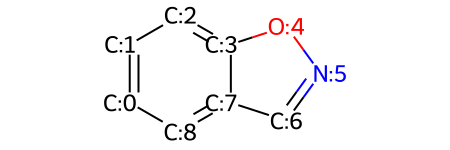

In [400]:
def third_046(mol):  # todo 芳香性
    """aC-(CHn=N)cyc (fused rings)   n=0,1"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@,=,:[c,C;H0,H1;R]@,=,:[n,N;H0;D2;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_046_smiles1 = 'c1ccc2oncc2c1'
third_046_smiles2 = 'C1=NCc2ccccc21'
print(my_test(third_046_smiles1, third_046))
mol_with_atom_index(third_046_smiles1)

(1, ((6, 5, 4, 3),))


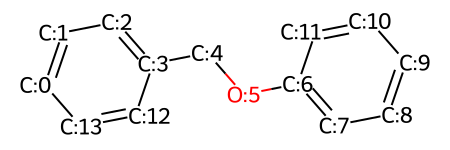

In [401]:
def third_047(mol):
    """aC-O-CHn-aC (different rings)   n=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@,-[O;H0;!R;D2]!@,-[C;H0,H1,H2;!R]!@,-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_047_smiles1 = 'c1ccc(COc2ccccc2)cc1'
print(my_test(third_047_smiles1, third_047))
mol_with_atom_index(third_047_smiles1)

(1, ((3, 4, 5),))


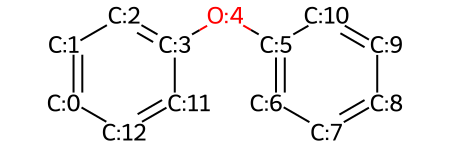

In [402]:
def third_048(mol):
    """aC-O-aC (different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[O;H0;!R;D2]-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_048_smiles1 = 'c1ccc(Oc2ccccc2)cc1'
print(my_test(third_048_smiles1, third_048))
mol_with_atom_index(third_048_smiles1)

(1, ((3, 4, 5, 6, 7),))


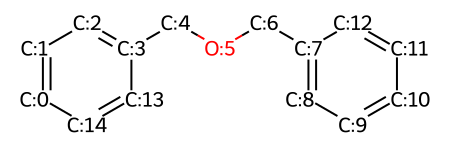

In [403]:
def third_049(mol):
    """aC-CHn-O-CHm-aC (different rings)   m,n=0,1,2"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]-[C;H0,H1,H2;!R]-[O;H0;!R;D2]-[C;H0,H1,H2;!R]-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_049_smiles1 = 'c1ccc(COCc2ccccc2)cc1'
print(my_test(third_049_smiles1, third_049))
mol_with_atom_index(third_049_smiles1)

(1, ((3, 4),))


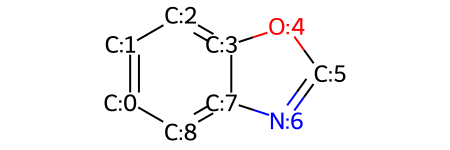

In [404]:
def third_050(mol):
    """aC-Ocyc (fused rings)"""
    query = Chem.MolFromSmarts('[c;H0;R2;D3]@[O,o;H0;R;D2]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_050_smiles1 = 'c1ccc2ocnc2c1'
print(my_test(third_050_smiles1, third_050))
mol_with_atom_index(third_050_smiles1)

(2, ((0, 9, 8, 7, 3, 4, 2, 1), (5, 4, 3, 2, 8, 9, 7, 6)))


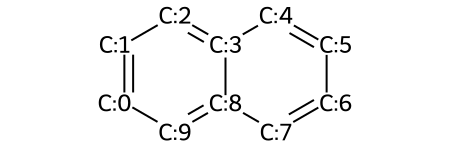

In [405]:
def third_051(mol):
    """AROMFUSED[2]"""
    query = Chem.MolFromSmarts('[c;H1]1[c;H1][c;R2]([c])[c;R2]([c])[c;H1][c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_051_smiles1 = 'c1ccc2ccccc2c1'
print(my_test(third_051_smiles1, third_051))
mol_with_atom_index(third_051_smiles1)

(1, ((2, 1, 0, 10, 9, 5, 6, 4, 3),))


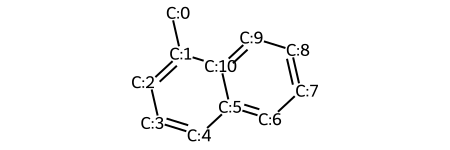

In [406]:
def third_052(mol):
    """AROMFUSED[2]s1"""
    query = Chem.MolFromSmarts('[c;H1]1[c](!@[*])[c;R2]([c])[c;R2]([c])[c;H1][c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list



third_052_smiles1 = 'Cc1cccc2ccccc12'
print(my_test(third_052_smiles1, third_052))
mol_with_atom_index(third_052_smiles1)

(2, ((0, 1, 11, 10, 9, 4, 5, 3, 2), (8, 7, 9, 10, 11, 4, 3, 5, 6)))


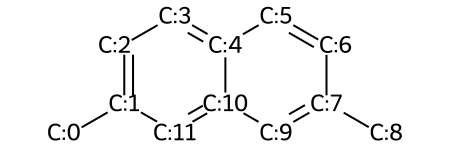

In [407]:
def third_053(mol):
    """AROMFUSED[2]s2"""
    query = Chem.MolFromSmarts('[*]!@[c]1[c;H1][c;R2]([c])[c;R2]([c])[c;H1][c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_053_smiles1 = 'Cc1ccc2ccc(C)cc2c1'
print(my_test(third_053_smiles1, third_053))
mol_with_atom_index(third_053_smiles1)

(1, ((0, 1, 10, 11, 9, 8, 7, 3, 4, 2),))


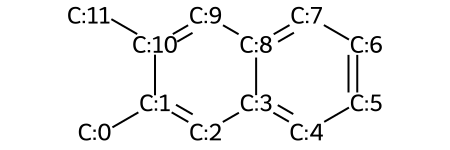

In [408]:
def third_054(mol):
    """AROMFUSED[2]s2s3"""
    query = Chem.MolFromSmarts('[*]!@[c]1[c](!@[*])[c;H1][c;R2]([c])[c;R2]([c])[c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_054_smiles1 = 'Cc1cc2ccccc2cc1C'
print(my_test(third_054_smiles1, third_054))
mol_with_atom_index(third_054_smiles1)

(1, ((2, 1, 0, 11, 10, 6, 7, 4, 5, 3),))


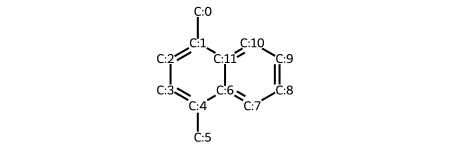

In [409]:
def third_055(mol):
    """AROMFUSED[2]s1s4"""
    query = Chem.MolFromSmarts('[c;H1]1[c](!@[*])[c;R2]([c])[c;R2]([c])[c](!@[*])[c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_055_smiles1 = 'Cc1ccc(C)c2ccccc12'
print(my_test(third_055_smiles1, third_055))
mol_with_atom_index(third_055_smiles1)

(1, ((2, 1, 0, 10, 11, 9, 8, 4, 5, 3),))


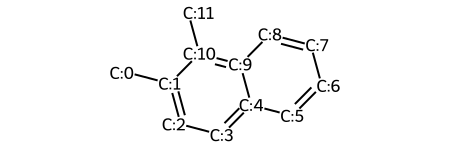

In [410]:
def third_056(mol):
    """AROMFUSED[2]s1s2"""
    query = Chem.MolFromSmarts('[c;H1]1[c](!@[*])[c](!@[*])[c;R2]([c])[c;R2]([c])[c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_056_smiles1 = 'Cc1ccc2ccccc2c1C'
print(my_test(third_056_smiles1, third_056))
mol_with_atom_index(third_056_smiles1)

(1, ((2, 1, 0, 11, 10, 9, 5, 6, 3, 4),))


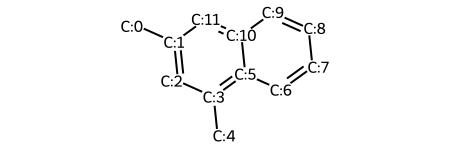

In [411]:
def third_057(mol):
    """AROMFUSED[2]s1s3"""
    query = Chem.MolFromSmarts('[c;H1]1[c](!@[*])[c;H1][c;R2]([c])[c;R2]([c])[c](!@[*])1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_057_smiles1 = 'Cc1cc(C)c2ccccc2c1'
print(my_test(third_057_smiles1, third_057))
mol_with_atom_index(third_057_smiles1)

(2, ((3, 2, 14, 15, 12, 11, 13, 0, 1), (4, 5, 15, 14, 9, 10, 8, 7, 6)))


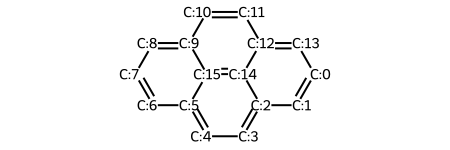

In [412]:
def third_058(mol):
    """AROMFUSED[3]"""
    query = Chem.MolFromSmarts('[c][c;R2]1[c;R3]([c])[c;R2]([c])ccc1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_058_smiles1 = 'c1cc2ccc3cccc4ccc(c1)c2c34'
print(my_test(third_058_smiles1, third_058))
mol_with_atom_index(third_058_smiles1)

(1, ((2, 3, 12, 13, 11, 10, 9, 5, 6, 4),))


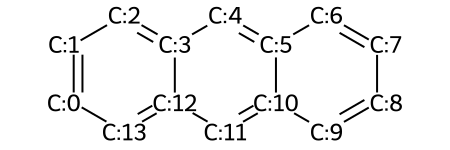

In [413]:
def third_059(mol):
    """AROMFUSED[4a]"""
    query = Chem.MolFromSmarts('[c;H1][c;R2]1[c;R2]([c])[c;H1][c;R2]([c])[c;R2]([c])[c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_059_smiles1 = 'c1ccc2cc3ccccc3cc2c1'
print(my_test(third_059_smiles1, third_059))
mol_with_atom_index(third_059_smiles1)

(1, ((0, 1, 2, 3, 7, 6, 8, 9, 10, 14, 13),))


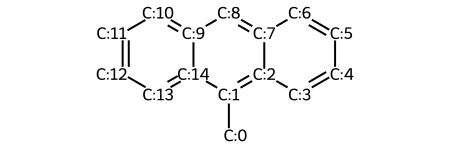

In [414]:
def third_060(mol):
    """AROMFUSED[4a]s1"""
    query = Chem.MolFromSmarts('[*]!@[c]1[c;R2]([c])[c;R2]([c])[c;H1][c;R2]([c])[c;R2]1([c])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_060_smiles1 = 'Cc1c2ccccc2cc2ccccc12'
print(my_test(third_060_smiles1, third_060))
mol_with_atom_index(third_060_smiles1)

(1, ((0, 1, 2, 3, 7, 6, 8, 9, 10, 11, 15, 14),))


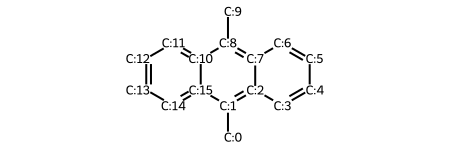

In [415]:
def third_061(mol):
    """AROMFUSED[4a]s1s4"""
    query = Chem.MolFromSmarts('[*]!@[c]1[c;R2]([c])[c;R2]([c])[c](!@[*])[c;R2]([c])[c;R2]1([c])')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_061_smiles1 = 'Cc1c2ccccc2c(C)c2ccccc12'
print(my_test(third_061_smiles1, third_061))
mol_with_atom_index(third_061_smiles1)

(1, ((6, 4, 5, 3, 2, 13, 12, 8, 9, 7),))


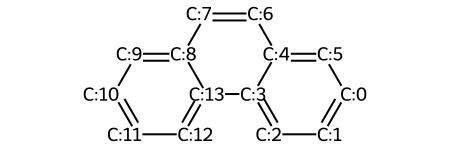

In [416]:
def third_062(mol):
    """AROMFUSED[4p]"""
    query = Chem.MolFromSmarts('[c;H1]1[c;!R1]([c])[c;!R1]([c])[c;!R1]([c])[c;!R1]([c])[c;H1]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_062_smiles1 = 'c1ccc2c(c1)ccc1ccccc12'
print(my_test(third_062_smiles1, third_062))
mol_with_atom_index(third_062_smiles1)

(1, ((0, 1, 15, 14, 10, 11, 9, 8, 4, 5, 2, 3),))


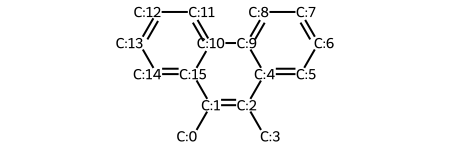

In [417]:
def third_063(mol):
    """AROMFUSED[4p]s3s4"""
    query = Chem.MolFromSmarts('[*]!@[c]1[c;!R1]([c])[c;!R1]([c])[c;!R1]([c])[c;!R1]([c])[c]1!@[*]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_063_smiles1 = 'Cc1c(C)c2ccccc2c2ccccc12'
print(my_test(third_063_smiles1, third_063))
mol_with_atom_index(third_063_smiles1)

(1, ((4, 5, 6, 7, 8, 9, 3, 2),))


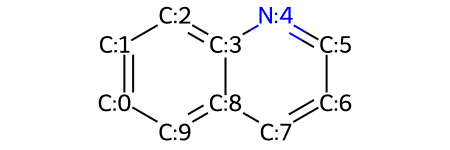

In [418]:
def third_064(mol):
    """PYRIDINE.FUSED[2]"""
    query = Chem.MolFromSmarts('[n;H0;R1;D2]1[c;H1;R1;D2][c;H1;R1;D2][c;H1;R1;D2][c;H0;R2;D3](a)[c;H0;R2;D3]1(a)')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_064_smiles1 = 'c1ccc2ncccc2c1'
print(my_test(third_064_smiles1, third_064))
mol_with_atom_index(third_064_smiles1)

(1, ((5, 6, 7, 8, 9, 3, 2, 4),))


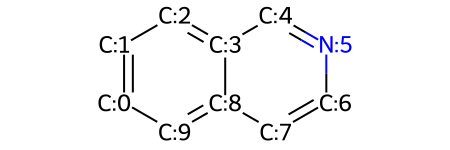

In [419]:
def third_065(mol):
    """PYRIDINE.FUSED[2-iso]"""
    query = Chem.MolFromSmarts('[n;H0;R1;D2]1[c;H1;R1;D2][c;H1;R1;D2][c;H0;R2;D3](a)[c;H0;R2;D3](a)[c;H1;R1;D2]1')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_065_smiles1 = 'c1ccc2cnccc2c1'
print(my_test(third_065_smiles1, third_065))
mol_with_atom_index(third_065_smiles1)

(1, ((4, 3, 2, 12, 13, 11, 10, 9, 5, 6),))


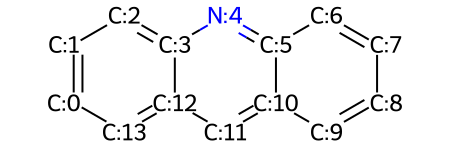

In [420]:
def third_066(mol):
    """PYRIDINE.FUSED[4]"""
    query = Chem.MolFromSmarts('[n;H0;R1;D2]1[c;H0;R2;D3](a)[c;H0;R2;D3](a)[c;H1;R1;D2][c;H0;R2;D3](a)[c;H0;R2;D3]1(a)')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_066_smiles1 = 'c1ccc2nc3ccccc3cc2c1'
print(my_test(third_066_smiles1, third_066))
mol_with_atom_index(third_066_smiles1)

(1, ((3, 4, 5),))


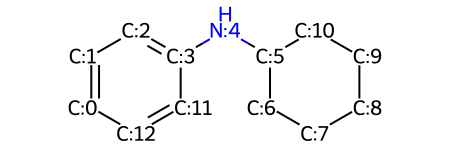

In [421]:
def third_067(mol):
    """aC-N-CHcyc(different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[N]!@&-[C;H1;R]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_067_smiles1 = 'c1ccc(NC2CCCCC2)cc1'
print(my_test(third_067_smiles1, third_067))
mol_with_atom_index(third_067_smiles1)

(1, ((3,),))


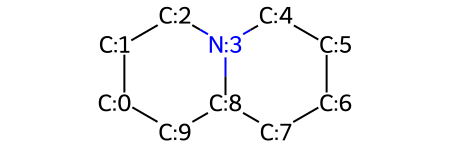

In [422]:
def third_068(mol):
    """N multiring"""
    query = Chem.MolFromSmarts('[N;R&!R1]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_068_smiles1 = 'C1CCN2CCCCC2C1'
print(my_test(third_068_smiles1, third_068))
mol_with_atom_index(third_068_smiles1)

(1, ((3, 4, 5, 6, 7),))


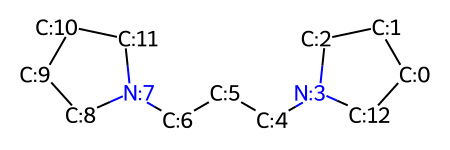

In [423]:
def third_069(mol):
    """Ncyc-(CH2)3-Ncyc(different rings)"""
    query = Chem.MolFromSmarts('[N;H0;R;D3]!@&-[C;H2][C;H2][C;H2]!@&-[N;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_069_smiles1 = 'C1CCN(CCCN2CCCC2)C1'
print(my_test(third_069_smiles1, third_069))
mol_with_atom_index(third_069_smiles1)

(1, ((10, 1, 0, 2, 3, 4),))


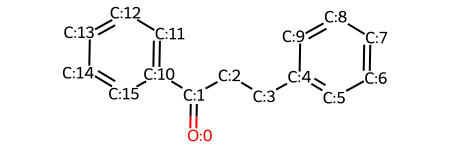

In [424]:
def third_070(mol):
    """aC-COCH2CH2-aC(different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[C;H0](=[O;H0;!R;D1])[C;H2][C;H2]!@&-[c;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_070_smiles1 = 'O=C(CCc1ccccc1)c1ccccc1'
print(my_test(third_070_smiles1, third_070))
mol_with_atom_index(third_070_smiles1)

(1, ((3, 4, 5, 6, 7),))


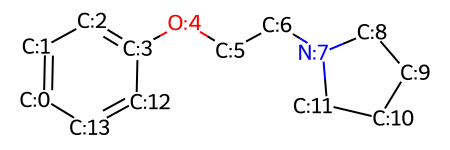

In [425]:
def third_071(mol):
    """aC-O-(CH2)2-Ncyc(different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[O;H0;D2]-[C;H2][C;H2]!@&-[N;H0;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_071_smiles1 = 'c1ccc(OCCN2CCCC2)cc1'
print(my_test(third_071_smiles1, third_071))
mol_with_atom_index(third_071_smiles1)

(1, ((10, 1, 0, 2, 3, 4),))


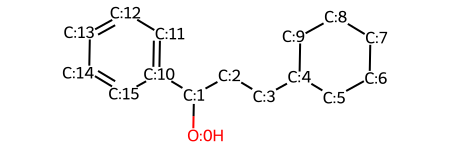

In [426]:
def third_072(mol):
    """aC-CH(OH)(CH2)2-CHcyc(different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[C;H1]([O;H1;!R;D1])-[C;H2][C;H2]!@&-[C;H1;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_072_smiles1 = 'OC(CCC1CCCCC1)c1ccccc1'
print(my_test(third_072_smiles1, third_072))
mol_with_atom_index(third_072_smiles1)

(1, ((6, 5, 4, 3),))


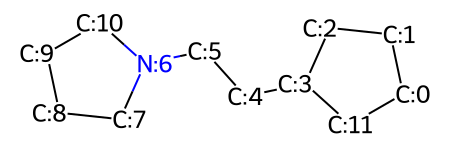

In [427]:
def third_073(mol):
    """Ncyc-(CH2)2-CHcyc(different rings)"""
    query = Chem.MolFromSmarts('[N;H0;R;D3]!@&-[C;H2][C;H2]!@&-[C;H1;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_073_smiles1 = 'C1CCC(CCN2CCCC2)C1'
print(my_test(third_073_smiles1, third_073))
mol_with_atom_index(third_073_smiles1)

(1, ((9, 1, 0, 2, 3, 4),))


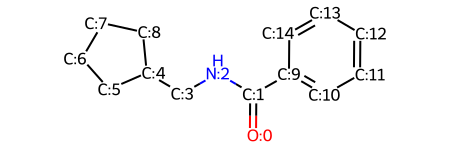

In [428]:
def third_074(mol):
    """aC-CONHCH2-CHcyc(different rings)"""
    query = Chem.MolFromSmarts('[c;H0;R;D3]!@&-[C;H0;D3](=[O;H0;!R;D1])[N;H1;D2][C;H2]!@&-[C;H1;R;D3]')
    match_list = mol.GetSubstructMatches(query)
    return len(match_list), match_list


third_074_smiles1 = 'O=C(NCC1CCCC1)c1ccccc1'
print(my_test(third_074_smiles1, third_074))
mol_with_atom_index(third_074_smiles1)